# PREDICTING LOAN DEFAULT RISK PROJECT (EUBA MORENIKEJI)

## Introduction  

In today’s financial landscape, accurately assessing the risk of loan default is critical for banks, microfinance institutions, and lending platforms. Traditional credit assessment methods often focus heavily on credit scores, overlooking the complex interplay of demographic, financial, and behavioral factors that shape a borrower’s repayment ability.  

This limitation can lead to:  
- Poor lending decisions  
- Increased default rates  
- Significant financial losses for lenders  

By applying **data-driven approaches** and **machine learning techniques**, it is possible to capture these hidden patterns, strengthen credit risk assessment, and enhance portfolio performance.  

---

## Problem Statement  

Financial institutions face persistent challenges in accurately identifying borrowers who are likely to default on their loans. Relying solely on conventional credit checks presents three major problems:  

- **High loan default rates** due to incomplete borrower evaluation  
- **Increased financial losses** for lending institutions  
- **Missed opportunities for fair credit access** to underserved populations  

A more comprehensive, machine learning–driven approach is required to integrate multiple borrower characteristics and repayment behaviors. This enables lenders to reduce uncertainty, improve decision-making, and ensure more inclusive access to credit.  

---

## Objective  

The primary objective of this project is to develop a robust **machine learning model** that predicts the likelihood of loan default for individual customers. The model leverages integrated data sources covering demographics, loan performance, and previous loan history—to provide actionable insights for smarter lending.  

**Key goals include:**  
- Supporting better credit decisions  
- Minimizing financial losses  
- Strengthening risk management practices  

### Datasets Used  
1. **Performance dataset** : captures current loan details, repayment outcomes, and loan terms.  
2. **Demographics dataset** : contains borrower attributes such as age, education, employment status, account type, and location.  
3. **Previous loans dataset** : provides historical borrowing records, repayment behaviors, credit scores, and delay metrics.  

---

## Project Workflow  

1. **Data Cleaning & Preprocessing** : handled missing values, treated outliers, encoded categorical variables, and scaled numerical features.  
2. **Feature Engineering** : designed financial ratios (loan-to-income, debt-to-income), temporal features (approved weekday, weekend flag), and aggregated previous loan metrics (e.g., total loans, delays, credit scores).  
3. **Dataset Integration** : merged all three datasets on customer ID into a unified analytical dataset.  
4. **Exploratory Data Analysis (EDA)** : explored borrower demographics, repayment patterns, and loan performance trends.  
5. **Model Development** : trained and compared Logistic Regression, Random Forest, XGBoost, and Neural Network models.  
6. **Class Imbalance Handling** : applied SMOTE and class weights to address imbalance between default and non-default cases.  
7. **Model Evaluation** : assessed models using accuracy, precision, recall, F1-score, ROC-AUC, and Precision-Recall curves.  
8. **Threshold Tuning & Interpretation** : adjusted probability thresholds and analyzed confusion matrices to improve recall and reduce false negatives.  
9. **Deployment** : finalized the Logistic Regression pipeline (Preprocessing + SMOTE + Model), saved with Joblib, and deployed using **Streamlit** for real-time loan-risk prediction.  

---

In [1]:
# I imported necessary libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

The following libraries were used for data manipulation ('pandas', 'numpy'), visualization ('seaborn, 'matplotlib'), and suppressing warnings ('warnings').

# Loading the Datasets

The 'performance', 'demographics', and 'previous loans' datasets were loaded directly from GitHub URLs using 'pandas.read_csv()'.


perf_url = "https://raw.githubusercontent.com/Oyeniran20/axia_cohort_8/refs/heads/main/trainperf.csv"
demo_url: "https://raw.githubusercontent.com/Oyeniran20/axia_cohort_8/refs/heads/main/traindemographics.csv"
prevloans_url =  "https://raw.githubusercontent.com/Oyeniran20/axia_cohort_8/refs/heads/main/trainprevloans.csv"


performance= pd.read_csv(perf_url)
demographics= pd.read_csv(demo_url)
prevloans = pd.read_csv(prevloans_url)

In [2]:
# I loaded the dataset from the provided URL

demo_url = "https://raw.githubusercontent.com/Oyeniran20/axia_cohort_8/refs/heads/main/traindemographics.csv"
demographics= pd.read_csv(demo_url)

## INITIAL EXPLORATION AND CLEANING (SEPARATELY)

## DEMOGRAPHICS DATASET

## Demographics Dataset Column Description

This dataset contains personal and financial background information of each loan applicant. These features are important for understanding socio-economic and behavioral patterns that may influence loan default risk.

| Column Name                | Description |
|---------------------------|-------------|
| `customerid`              | Unique identifier assigned to each customer. |
| `birthdate`               | The customer's date of birth. |
| `bank_account_type`       | Type of bank account held by the customer (e.g., Savings, Current, Other). |
| `longitude_gps`           | GPS longitude coordinate of the customer’s location. |
| `latitude_gps`            | GPS latitude coordinate of the customer’s location. |
| `bank_name_clients`       | Name of the customer’s primary bank. |
| `bank_branch_clients`     | Branch name of the customer’s bank. |
| `employment_status_clients` | Employment status of the customer (e.g., Permanent, Contract, Unemployed, etc.). |
| `level_of_education_clients` | Highest education level achieved (e.g., Graduate, Primary, None). |

In [3]:
demographics.sample(5)

,customerid,birthdate,bank_account_type,longitude_gps,latitude_gps,bank_name_clients,bank_branch_clients,employment_status_clients,level_of_education_clients
1137,8a858e475c1c2ea7015c1cedf8cd2eac,1980-02-08 00:00:00.000000,Savings,3.470797,6.543687,First Bank,NaN,NaN,NaN
2397,8a858957536752f3015375ad08686045,1980-02-27 00:00:00.000000,Other,4.596464,8.490016,GT Bank,NaN,Permanent,NaN
3176,8a858fc15b68ba6a015b77dc3edd5df5,1986-05-10 00:00:00.000000,Savings,3.404892,6.576988,Access Bank,NaN,Permanent,NaN
1988,8a858efe5bca0a81015bca60dfdc14bb,1978-01-06 00:00:00.000000,Savings,3.962218,7.459450,Stanbic IBTC,NaN,Permanent,NaN
3854,8a8588fd53c244bc0153c9c031e76307,1990-11-22 00:00:00.000000,Savings,7.387957,9.117131,Fidelity Bank,NaN,Permanent,NaN


## Cleaning and Preparing the Demographics Dataset

To prepare the demographics dataset for analysis and modelling, I carried out the following steps:

1. Converted 'birthdate' to age: I converted the 'birthdate' column to a datetime format and calculated the customer’s age by subtracting their date of birth from the current date. I then dropped the original 'birthdate' column since age was more relevant for modelling.

2. Handled missing values: I inspected each column for missing values. The 'bank_branch_clients' column had over 98% missing values, so I dropped it due to its limited usefulness. For the 'employment_status_clients', 'level_of_education_clients', 'city', and 'state' columns, I filled missing values with the placeholder 'Unknown' to preserve these features while maintaining consistency.

3. Decoded GPS coordinates to human-readable locations: I used reverse geocoding (via the 'geopy' library) to transform 'latitude_gps' and 'longitude_gps' into meaningful 'city', 'state', and 'country' fields. 

4. Filtered to only Nigerian records: After reverse geocoding, I filtered the dataset to retain only rows where 'country' was 'Nigeria', ensuring geographic consistency. I then dropped the 'country' column since it was no longer needed.

5. Cleaned and standardised city and state values: I capitalized city names and ensured that both 'city' and 'state' columns had consistent casing and no leading/trailing whitespace. I also standardised any inconsistent placeholders like 'unknown' and 'N/A' into 'Unknown'.

## Creating Age Column

In [4]:
# To convert birthdate to age

# I imported necessary libraries
from datetime import datetime

demographics['birthdate'] = pd.to_datetime(demographics['birthdate'], errors='coerce')
demographics['age'] = datetime.now().year - demographics['birthdate'].dt.year

In [5]:
# I droped the original birthdate column because I already extracted the age

demographics.drop(columns='birthdate', inplace=True)

In [6]:
# I rechecked the columns to confirm the age column

demographics.sample(5)

,customerid,bank_account_type,longitude_gps,latitude_gps,bank_name_clients,bank_branch_clients,employment_status_clients,level_of_education_clients,age
3170,8a858fcc5cf4a563015cf4d7285a1700,Savings,3.310807,6.473120,GT Bank,NaN,NaN,NaN,35
119,8a85886f54517ee0015470749d3c3ce7,Other,5.629202,6.270371,GT Bank,NaN,Self-Employed,Graduate,40
2801,8a858e125b391784015b391ddd6a078d,Savings,3.377566,6.557515,GT Bank,NaN,Permanent,NaN,42
696,8a85896653e2e18b0153eb033c3b45fd,Savings,3.277096,6.589890,Access Bank,NaN,Permanent,NaN,49
3752,8a858fd75bb62bbe015bc52a13c36f6c,Savings,6.129020,6.745356,GT Bank,NaN,Permanent,NaN,32


From the above, the age column has been added while the birthdate column has been dropped. 

## Creating Age Group Column

In [7]:
# I grouped clients into age groups in order to spot trends

bins = [0,25,35,45,60,100]
labels = ['Youth', 'Young Adult', 'Adult', 'Middle Age', 'Senior']
demographics ['age_group'] = pd.cut(demographics['age'], bins = bins, labels = labels, right = 'False')

In [8]:
# I rechecked the columns to confirm the age_group column

demographics.sample(5)

,customerid,bank_account_type,longitude_gps,latitude_gps,bank_name_clients,bank_branch_clients,employment_status_clients,level_of_education_clients,age,age_group
3741,8a85898a53bc15600153c7b188b67a9e,Savings,7.485222,9.106305,GT Bank,NaN,Permanent,Post-Graduate,38,Adult
1222,8a858edb5bd936e4015be280d1ce22c4,Savings,3.515982,6.439467,GT Bank,NaN,NaN,NaN,32,Young Adult
2798,8a858eba5b681df4015b75ab13016a89,Savings,3.383194,6.455726,GT Bank,NaN,Permanent,NaN,44,Adult
3149,8a858f965c6950da015c7b2cefaf445f,Savings,3.385515,6.668684,GT Bank,NaN,NaN,NaN,45,Adult
587,8a858f665ca1c775015ca1e1f1360d78,Savings,3.487207,6.634026,Access Bank,NaN,Permanent,NaN,37,Adult


From the above, the age_group column has been added.

In [9]:
# I checked for missing values

demographics.isna().sum().sort_values(ascending = False)

bank_branch_clients           4295
level_of_education_clients    3759
employment_status_clients      648
customerid                       0
bank_account_type                0
longitude_gps                    0
latitude_gps                     0
bank_name_clients                0
age                              0
age_group                        0
dtype: int64

In [10]:
# I checked for the percentage of missing values

demographics.isna().sum().sort_values(ascending = False) / len (demographics) * 100

bank_branch_clients           98.826507
level_of_education_clients    86.493327
employment_status_clients     14.910262
customerid                     0.000000
bank_account_type              0.000000
longitude_gps                  0.000000
latitude_gps                   0.000000
bank_name_clients              0.000000
age                            0.000000
age_group                      0.000000
dtype: float64

## Missing Values Report (Demographics Dataset)

After analyzing the percentage of missing values in the 'demographics' dataset, I made the following observations and decisions:

1. bank_branch_clients (98.83% missing): This column has an extremely high proportion of missing data.  
   - **Decision:** Dropped from the dataset as it holds little to no usable information.

2. level_of_education_clients (86.49% missing): Despite the high missing percentage, this feature may provide valuable insight into customer default risk.  
   - **Decision:** Imputed missing values with a placeholder category ('Unknown') to reflect the uncertainty and allow the model to learn from it..

3. employment_status_clients (14.91% missing): Employment status is a critical predictor of financial behaviour.  
   - **Decision:** Filled missing values with a placeholder category ('Unknown') to retain the variable without introducing bias.

4. The following columns had **0% missing values**: 'customerid', 'bank_account_type', 'longitude_gps', 'latitude_gps', 'bank_name_clients', 'age', 'age_group'. 
   - **Decision:** All retained for further use in modelling and analysis.

## Dropping and Filling Relevant Columns

In [11]:
# I dropped level_of_education_clients and bank_branch_clients as they had too many NaNs
demographics.drop(columns=['bank_branch_clients', 'level_of_education_clients'], inplace=True)

# I imputed missing values in 'employment_status_clients' with 'Unknown'
demographics['employment_status_clients'] = demographics['employment_status_clients'].fillna('Unknown')

I decided to drop the columns bank_branch_clients (98.83% missing) and level_of_education_clients (86.49% missing) because their extremely high proportion of missing values means they are unlikely to provide reliable predictive power. Keeping them could introduce noise, reduce model accuracy, and complicate preprocessing due to heavy imputation requirements. By removing these columns, I ensured that the dataset remains cleaner, with features that have sufficient data to support meaningful analysis and model training.

In [12]:
# I re-checked the percentage of missing values

demographics.isna().sum().sort_values(ascending = False) / len (demographics) * 100

customerid                   0.0
bank_account_type            0.0
longitude_gps                0.0
latitude_gps                 0.0
bank_name_clients            0.0
employment_status_clients    0.0
age                          0.0
age_group                    0.0
dtype: float64

From the above, there are no missing values again and now, I went ahead with other steps. 

## Decoding the GPS Data

I converted the latitude and longitude values in the 'demographics' dataset into human-readable locations: city, state, and country using the 'geopy' library and the OpenStreetMap Nominatim API.

1. I installed and imported required libraries 
   - geopy for reverse geocoding  
   - time to manage delays and avoid rate limits

2. I initialized the geocoder
   - Used Nominatim with a custom user agent for API requests.

3. I defined a reverse_geocode() function  
   - Extracts city, state, and country from each GPS coordinate.  
   - Handles exceptions and missing values gracefully.

4. I extracted unique coordinate pairs 
   - Used drop_duplicates() to minimize API calls and respect rate limits.

5. I applied the reverse geocode function
   - Assigned decoded location fields (city, state, country) to each unique coordinate pair.

6. I drew a map using the decoded coordinates  
   - This step visually represents the geographic distribution of customers.  
   - Mapping helps identify spatial patterns, clusters, and regional differences in the dataset.  
   - It also allowed me to spot anomalies or missing values more easily and communicate insights more clearly.

In [13]:
# I checked the range of latitude and longitude values to identify any outliers or data entry errors.

print(demographics['latitude_gps'].describe())
print(demographics['longitude_gps'].describe())

count    4346.000000
mean        7.251356
std         3.055052
min       -33.868818
25%         6.470610
50%         6.621888
75%         7.425052
max        71.228069
Name: latitude_gps, dtype: float64
count    4346.000000
mean        4.626189
std         7.184832
min      -118.247009
25%         3.354953
50%         3.593302
75%         6.545220
max       151.209290
Name: longitude_gps, dtype: float64


To ensure geospatial data quality, I examined the distribution of 'latitude_gps' and 'longitude_gps' values to identify any outliers or data entry errors.

Summary Statistics:

'latitude_gps'
- Min: -33.87 (possible error; likely outside the expected region)
- Max: 71.23
- Median: 6.62
- Expected Nigeria Range:  4 to 14

'longitude_gps'
- Min: -118.25 (clear error; possibly foreign or incorrectly recorded)
- Max: 151.29
- Median: 3.59
- Expected Nigeria Range: 2 to 15

Insights:
- Some coordinates fall far outside the expected geographical range of Nigeria.
- These likely represent data entry errors or placeholder values.

Next Step:
Filter or flag the rows where:
- 'latitude_gps' < 4 or > 14
- 'longitude_gps' < 2 or > 15

This ensures that I only work with customers within the realistic geographic scope.

In [14]:
# I removed rows with implausible GPS coordinates to ensure data quality

demographics = demographics[(demographics['latitude_gps'] >= 4) & (demographics['latitude_gps'] <= 14) &
        (demographics['longitude_gps'] >= 2) & (demographics['longitude_gps'] <= 15)]

After cleaning the GPS data, I applied reverse geocoding to decode the latitude and longitude values into location names such as city or state. This step allowed me to add meaningful geographic context to the dataset, which may help uncover regional patterns in loan default risk.

Since reverse geocoding can be slow and is subject to rate limits, I performed this operation on unique coordinate pairs and merged the results back into the main dataset.

In [15]:
# I imported necessary libraries

!pip install geopy
from geopy.geocoders import Nominatim
import time

In [16]:
# I initialized the geocoder for reverse geocoding

geolocator = Nominatim(user_agent="loan_default_geocoder")

In [17]:
# I defined a function to extract city, state, and country from latitude and longitude.
def reverse_geocode(lat, lon):
    try:
        location = geolocator.reverse((lat, lon), exactly_one=True, timeout=10)
        if location and location.raw and 'address' in location.raw:
            address = location.raw['address']
            city = address.get('city', address.get('town', address.get('village', None)))
            state = address.get('state', None)
            country = address.get('country', None)
            return pd.Series([city, state, country])
        else:
            return pd.Series([None, None, None])
    except:
        return pd.Series([None, None, None])

In [18]:
# I extracted unique coordinate pairs to minimize API calls and avoid rate limits

unique_coords = demographics[['latitude_gps', 'longitude_gps']].drop_duplicates()

In [19]:
# I applied the reverse geocoding function to each unique coordinate pair

unique_coords[['city', 'state', 'country']] = unique_coords.apply(
    lambda row: reverse_geocode(row['latitude_gps'], row['longitude_gps']), axis=1
)

In [20]:
# I merged the decoded city, state, and country columns back into the main dataset

demographics= demographics.merge(unique_coords, on=['latitude_gps', 'longitude_gps'], how='left')

In [21]:
# I filtered to Only Nigeria and Drop Invalid Rows

demographics = demographics[demographics['country'] == 'Nigeria']

In [22]:
# I filled missing city and state with 'Unknown'

demographics['city'].fillna('Unknown', inplace=True)
demographics['state'].fillna('Unknown', inplace=True)

In [23]:
# I dropped country column since I filtered it to Nigeria

demographics.drop(columns=['country'], inplace=True)

In [24]:
# I displayed a sample of the new columns to verify the results

print(demographics[['latitude_gps', 'longitude_gps', 'city', 'state']].sample(10))

      latitude_gps  longitude_gps               city  \
2907      6.658334       3.343072            Unknown   
260       8.942409       7.093638         Gwagwalada   
199       6.679004       3.297868            Unknown   
1479      6.324524       8.113206          Abakaliki   
2349      6.464603       3.285552        Festac Town   
159       7.351172       3.859009             Ìbàdàn   
1969      7.390172       3.881388  Links Reservation   
3545      6.643422       3.289961         Abule Egba   
3550      7.237548       5.200084              Akure   
844       6.430241       7.492748              Enugu   

                          state  
2907                      Lagos  
260   Federal Capital Territory  
199                        Ogun  
1479                     Ebonyi  
2349                      Lagos  
159                         Oyo  
1969                        Oyo  
3545                      Lagos  
3550                       Ondo  
844                       Enugu  


# Drawing a Map

In [25]:
# I installed and imported necessary libraries
!pip install folium
import folium
from folium.plugins import MarkerCluster

In [26]:
# I created a base map centered around Nigeria
m = folium.Map(location=[9.0820, 8.6753], zoom_start=6)

In [27]:
# I added cluster
marker_cluster = MarkerCluster().add_to(m)

In [28]:
# I lopped through and added points

for _, row in demographics.iterrows():
    folium.Marker(
        location=[row['latitude_gps'], row['longitude_gps']],
        popup=f"{row['city']}, {row['state']}"
    ).add_to(marker_cluster)

# I displayed the map
m

### Map Interpretation & Insights

1. High concentration in South-West Nigeria (Lagos/Ibadan axis)
   - The largest cluster (over 35,000 data points) is located in the Lagos–Ibadan area.  
   - This suggests that the majority of customers are concentrated in Lagos State and nearby regions, reflecting its role as Nigeria’s economic hub.  

2. Moderate concentration in North-Central (Abuja, Makurdi, Jos axis)
   - A noticeable cluster (646 points) appears in Abuja and surrounding states.  
   - Abuja, being the Federal Capital Territory, serves as an administrative and political hub, explaining this concentration.  

3. Medium cluster in South-East/South-South (Port Harcourt, Enugu, Onitsha axis)
   - The Port Harcourt cluster (90 points) indicates activity in Rivers State and the South-South.  
   - This aligns with the region’s importance in oil & gas, trade, and industry.  

4. Smaller clusters in Northern Nigeria (Katsina, Bauchi, Kano axis) 
   - Northern regions show fewer but notable clusters (7–12 points), reflecting lower but spread-out engagement compared to the South.  
   - This may be due to lower data capture or limited penetration of services in these areas.  

5. Overall distribution 
   - The dataset covers much of Nigeria but is highly skewed toward urban and economic centers (Lagos, Abuja, Port Harcourt).  
   - Rural and northern areas are underrepresented, suggesting either data collection bias or service/product concentration in the South.  

Business/Research Implications
- Lagos should be the primary focus for business or research interventions.  
- Abuja and Port Harcourt are secondary hubs worth strategic attention.  
- Northern Nigeria may require targeted outreach programs to ensure inclusivity.  
- The spatial distribution highlights potential underserved regions, valuable for policy, planning, or expansion decisions.  

In [29]:
# I dropped the longitude and latitude columns as I have extracted the city and states. 

demographics.drop(columns=['longitude_gps',	'latitude_gps'], inplace=True)

In [30]:
demographics.sample(3)

,customerid,bank_account_type,bank_name_clients,employment_status_clients,age,age_group,city,state
2739,8a858f065bd31ee6015bd35984932c89,Savings,Skye Bank,Permanent,46,Middle Age,Unknown,Federal Capital Territory
843,8a858ea35d0cdd1c015d0d2b2d4f2888,Savings,GT Bank,Unemployed,39,Adult,Unknown,Lagos
4297,8a858e6f5cd5e874015ce8ea0b996796,Savings,Access Bank,Unknown,59,Middle Age,Ìkòròdú,Lagos


In [31]:
demographics['city'].isna().sum()

0

From the above, there are no missing values.

In [32]:
demographics['city'].unique()

array(['Unknown', 'Abeokuta', 'Warri', 'Ikeja', 'Dorayi', 'Iganmu',
       'Shangisha', 'Ebute-Metta', 'Abuja', 'Mgbuoshimini', 'Moba',
       'Ifẹ̀', 'Orlu', 'Keffi', 'Qua Iboe', 'Elelenwo', 'Port-Harcourt',
       'Itirin', 'Arum Karimi', 'Akure', 'Gwarinpa', 'Ìkòròdú', 'Ikoga',
       'Uselu', 'Calabar', 'Ìsẹ́yìn', 'Benin City', 'Alaiyabiagba',
       'Sogeke', 'Minna', 'Iju', 'Lagos', 'Ilado', 'Unguwar Sarki',
       'Kakau', 'Igboefon', 'Jibowu', 'Ilawe-Ekiti', 'Òṣogbo', 'Kubwa',
       'Ìlọrin', 'Asewele', 'Ado', 'Naze', 'Adó-Èkìtì', 'Bonny',
       'Barden Yana', 'Ugbor', 'Isunba', 'Onitsha', 'Ìjẹ̀bú-Ìgbò',
       'Falomo', 'Rumuodumaya', 'Orie Uratta', 'Ihiagwa', 'Ijanikin',
       'Nyanya', 'Giginyu', 'Ihiala', 'Ìbàdàn', 'Merin', 'Badiko', 'Uyo',
       'Markurdi', 'Tudun Wada', 'Iranla', 'Oworonṣoki', 'Shagamu',
       'AlakIa', 'Ajah', 'Otta', 'Unguwan Sanusi', 'Ibafo',
       'Satellite Town', 'Elegun', 'Agbara', 'Yenegoa', 'Dutse', 'Ososa',
       'Rumualogu', 'Igbo Ora', 

In [33]:
# I capitalized the first letter of each city name and make the rest lowercase for consistency

demographics['city'] = demographics['city'].str.capitalize()

In [34]:
# I stripped leading and trailing whitespace from city and state columns to ensure uniformity

demographics['city'] = demographics['city'].str.strip()
demographics['state'] = demographics['state'].str.strip()

In [35]:
# I rechecked the city column

demographics['city'].unique()

array(['Unknown', 'Abeokuta', 'Warri', 'Ikeja', 'Dorayi', 'Iganmu',
       'Shangisha', 'Ebute-metta', 'Abuja', 'Mgbuoshimini', 'Moba',
       'Ifẹ̀', 'Orlu', 'Keffi', 'Qua iboe', 'Elelenwo', 'Port-harcourt',
       'Itirin', 'Arum karimi', 'Akure', 'Gwarinpa', 'Ìkòròdú', 'Ikoga',
       'Uselu', 'Calabar', 'Ìsẹ́yìn', 'Benin city', 'Alaiyabiagba',
       'Sogeke', 'Minna', 'Iju', 'Lagos', 'Ilado', 'Unguwar sarki',
       'Kakau', 'Igboefon', 'Jibowu', 'Ilawe-ekiti', 'Òṣogbo', 'Kubwa',
       'Ìlọrin', 'Asewele', 'Ado', 'Naze', 'Adó-èkìtì', 'Bonny',
       'Barden yana', 'Ugbor', 'Isunba', 'Onitsha', 'Ìjẹ̀bú-ìgbò',
       'Falomo', 'Rumuodumaya', 'Orie uratta', 'Ihiagwa', 'Ijanikin',
       'Nyanya', 'Giginyu', 'Ihiala', 'Ìbàdàn', 'Merin', 'Badiko', 'Uyo',
       'Markurdi', 'Tudun wada', 'Iranla', 'Oworonṣoki', 'Shagamu',
       'Alakia', 'Ajah', 'Otta', 'Unguwan sanusi', 'Ibafo',
       'Satellite town', 'Elegun', 'Agbara', 'Yenegoa', 'Dutse', 'Ososa',
       'Rumualogu', 'Igbo ora', 

In [36]:
demographics.sample(3)

,customerid,bank_account_type,bank_name_clients,employment_status_clients,age,age_group,city,state
596,8a858f965bb63a25015bba71070e6859,Savings,Skye Bank,Permanent,34,Young Adult,Ìkòròdú,Lagos
666,8a858f5c5ad7d927015adc131c314be0,Savings,First Bank,Unknown,50,Middle Age,Umuahia,Abia
2351,8a858f605623784501562ba579fb44dd,Other,First Bank,Permanent,35,Young Adult,Unknown,Lagos


To ensure uniformity across the dataset, I standardized the 'city' column by capitalizing only the first letter of each city name while converting the rest to lowercase, stripped leading and trailing whitespaces to avoid duplicate entries that differ only due to spacing issues (e.g., 'Lagos' vs  ' Lagos '), which can affect grouping, encoding, and aggregations in later stages.

In [37]:
# I checked for duplicates

demographics.duplicated(subset='customerid').sum()

12

From the above, there are 12 duplicates and should be removed.

In [38]:
# I removed duplicate customer entries from the demographics dataset to ensure one unique record per customer
demographics = demographics.drop_duplicates(subset='customerid', keep='first')

To maintain data integrity, I removed 12 duplicate entries based on the 'customerid' column in the demographics dataset. Since each customer should have only one set of demographic information (such as age, education, and employment status), having multiple rows per customer could lead to inconsistencies or bias in model training. 

I retained only the first occurrence of each duplicated 'customerid', assuming it reflects the original or most reliable demographic profile.

In [39]:
# I rechecked for duplicates

demographics.duplicated(subset='customerid').sum()

0

Now, there are no more duplicates.

In [40]:
demographics.sample(3)

,customerid,bank_account_type,bank_name_clients,employment_status_clients,age,age_group,city,state
3398,8a858fa3586d20e001586e10a33b6821,Savings,GT Bank,Permanent,40,Adult,Falomo,Lagos
1919,8a858efd5b39cf3d015b39dc39b20bc7,Savings,Access Bank,Permanent,41,Adult,Falomo,Lagos
2148,8a858f335cd0c78e015cd3f1dc417e7a,Savings,FCMB,Permanent,36,Adult,Ìlọrin,Kwara


## Visualization

In [41]:
# I grouped the columns 
num_cols = demographics.select_dtypes(include = ['int32']).columns.tolist()
cat_cols = ['bank_account_type', 'bank_name_clients', 'employment_status_clients', 'age_group']

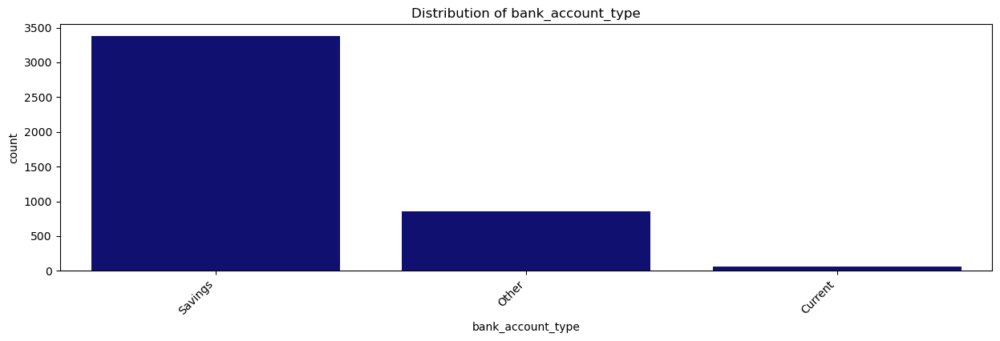

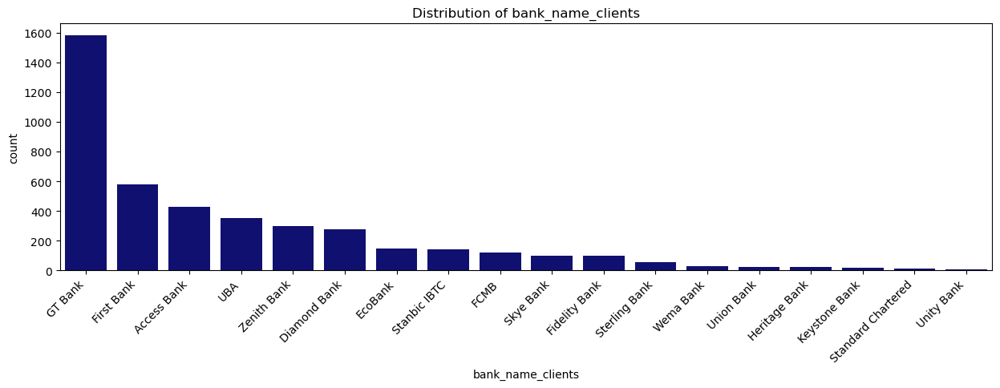

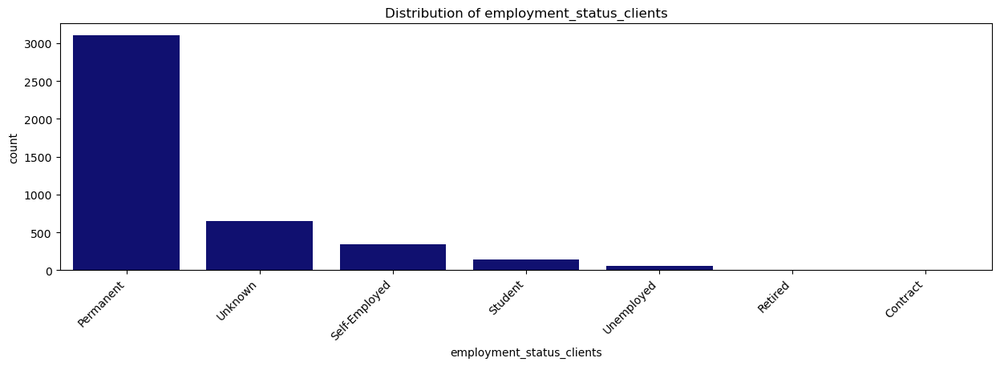

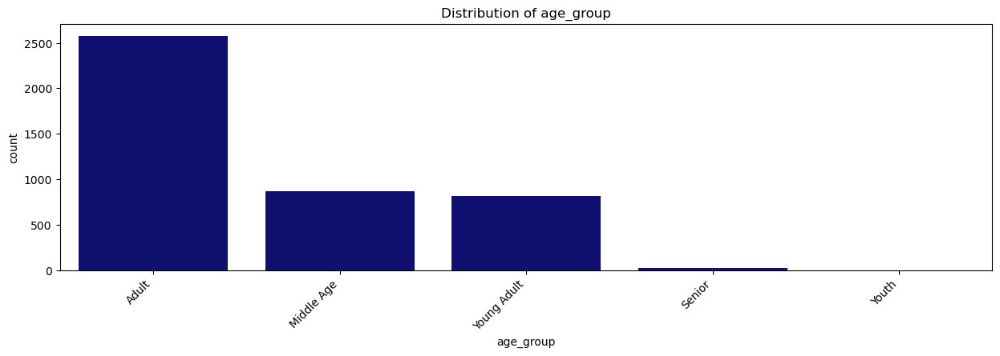

In [42]:
# I looped through the categorical columns and visualized

for col in cat_cols:
    plt.figure(figsize=(15,4))
    sns.countplot(data=demographics, x=col, order=demographics[col].value_counts().index, color ='navy')
    plt.xticks(rotation=45, ha='right')
    plt.title(f'Distribution of {col}')
    plt.show()

# Insights from Demographic Distributions

1. Bank Account Type Distribution
   - The majority of clients hold Savings accounts, reflecting a strong preference for simple, accessible, and low-cost financial products.  
   - Current accounts are extremely rare, which may indicate either low demand or limited promotion.  
   - This highlights an opportunity to diversify account offerings and design products tailored to business-oriented or higher-income clients.  

2. Bank Name Distribution 
   - The distribution is skewed toward a few dominant banks, likely due to brand trust, regional dominance, or greater accessibility.  
   - Smaller banks capture only a marginal share, suggesting challenges in outreach or visibility.  
   - This presents potential for strategic partnerships with leading banks while also exploring ways to strengthen ties with underutilized banks to expand coverage.  

3. Employment Status Distribution  
   - Most clients are permanently employed, a positive indicator of financial stability and reliability.  
   - A significant proportion of clients have Unknown employment status, which highlights data quality gaps and possible reluctance to disclose information.  
   - Minor categories such as self-employed, students, unemployed, retired, and contract workers appear less frequently, pointing to underserved groups.  
   - This creates opportunities to improve data collection practices and develop targeted financial products for these underrepresented segments.  

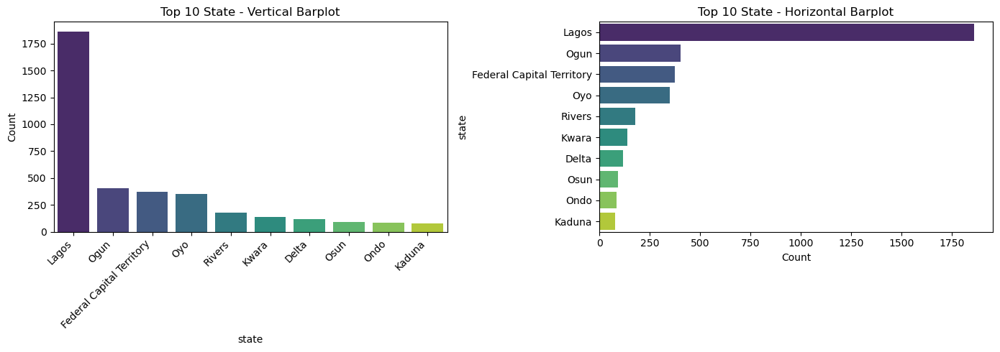

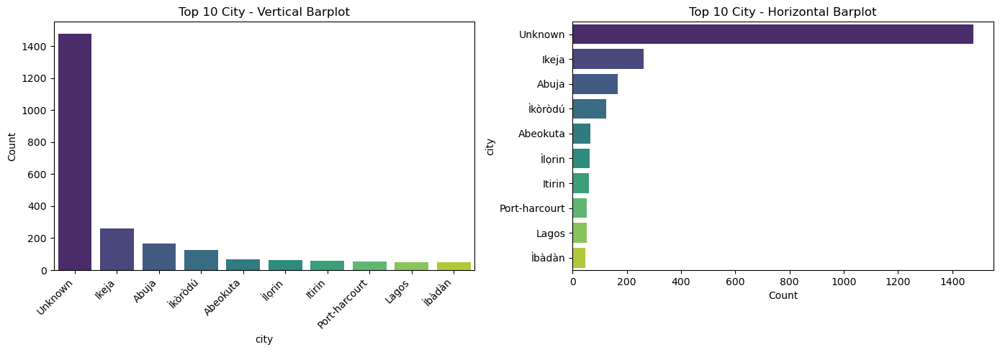

In [43]:
# for the state and city, visualized the top 10

# I reassigned the columns to be visulaized inorder to loop through
geo_cols = ['state', 'city']

# I looped through
for col in geo_cols:
    # Get top 10
    top_10 = demographics[col].value_counts().head(10)

    # I created subplots
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Vertical Barplot 
    sns.barplot(x=top_10.index, y=top_10.values, palette="viridis", ax=axes[0])
    axes[0].set_title(f"Top 10 {col.title()} - Vertical Barplot")
    axes[0].set_ylabel("Count")
    axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

    # Horizontal Barplot
    sns.barplot(y=top_10.index, x=top_10.values, palette="viridis", ax=axes[1])
    axes[1].set_title(f"Top 10 {col.title()} - Horizontal Barplot")
    axes[1].set_xlabel("Count")

    plt.tight_layout()
    plt.show()

# Insights from Top 10 States and Cities Visualizations

1. Top 10 States 
   - Lagos overwhelmingly dominates the client distribution, confirming its role as the primary hub of the customer base.  
   - Secondary states such as Ogun, Federal Capital Territory (Abuja), and Oyo contribute significantly but remain far below Lagos, each with less than a quarter of its count.  
   - The remaining states in the top 10 (Rivers, Kwara, Delta, Osun, Ondo, and Kaduna) represent small client clusters, highlighting a long-tail distribution.  
   - This pattern suggests that client engagement is highly concentrated in Lagos, with other states serving as regional but smaller markets.  

2. Top 10 Cities  
   - The dominance of “Unknown” city entries** points to a critical data quality issue. Missing city-level information severely limits the ability to perform granular, location-based insights.  
   - Among available records, Ikeja, Abuja, and Ikorodu emerge as the top cities, although their counts are far behind the “Unknown” category.  
   - Other cities such as Abeokuta, Ilorin, Itirim, Port Harcourt, Lagos, and Ibadan appear in smaller proportions, indicating fragmented representation outside the leading hubs.  
   - The reliance on “Unknown” suggests that without improved data completeness, decision-making based on city-level analysis could be misleading or biased.  

Strategic Implications
- Lagos should remain the focal point for targeted campaigns, resource allocation, or policy design, as it contains the largest share of clients.  
- Other top states (Ogun, Abuja, Oyo) represent natural secondary markets where expansion strategies can yield measurable growth.  

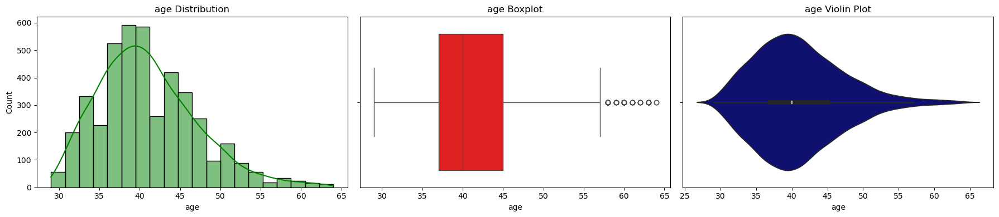

In [44]:
for col in num_cols:
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))
    
    # for histogram
    sns.histplot(demographics[col], kde=True, bins=20, color='green', ax=axes[0])
    axes[0].set_title(f'{col} Distribution')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('Count')

    # for boxplot
    sns.boxplot(x=demographics[col], color='red', ax=axes[1])
    axes[1].set_title(f'{col} Boxplot')
    axes[1].set_xlabel(col)

    # for violinplot
    sns.violinplot(x=demographics[col], color = 'navy', ax=axes[2])
    axes[2].set_title(f'{col} Violin Plot')
    axes[2].set_xlabel(col)
    
plt.tight_layout()
plt.show()

# Insights from Age Distribution Visualizations

1. Histogram (Age Distribution)  
   - The distribution is slightly right-skewed, with most clients concentrated between 35 and 45 years old.  
   - The peak occurs in the late 30s, indicating this is the most common age group in the dataset.  
   - A smaller proportion of clients are older than 50, with very few above 60, suggesting limited representation among older adults.  

2. Boxplot (Age)  
   - The median age is around 40 years, consistent with the histogram peak.  
   - The interquartile range (IQR: 35–45 years) shows that half of the client base falls within this middle-aged range.  
   - Outliers above age 55 highlight a small subset of older clients, less common compared to the core demographic.  

3. Violin Plot (Age)  
   - The violin plot reinforces that the density of clients is highest between 35 and 45 years, confirming the concentration of middle-aged clients.  
   - The distribution has a long tail toward higher ages, but these older ages are less frequent.  


Conclusion & Strategic Implications
- The client base is predominantly middle-aged (35–45 years), suggesting that products, services, or interventions should be tailored toward this group’s financial behaviors, career stage, and lifestyle.  
- The presence of older clients as outliers indicates a niche but potentially important segment—such as retirees or late-career individuals who may require specialized products (e.g., retirement savings, health-related financial services).  
- The underrepresentation of younger clients (<30 years) highlights an opportunity to expand outreach to students, early-career workers, or younger demographics, potentially building long-term customer loyalty.  

## Categorical vs Numerical Visualization

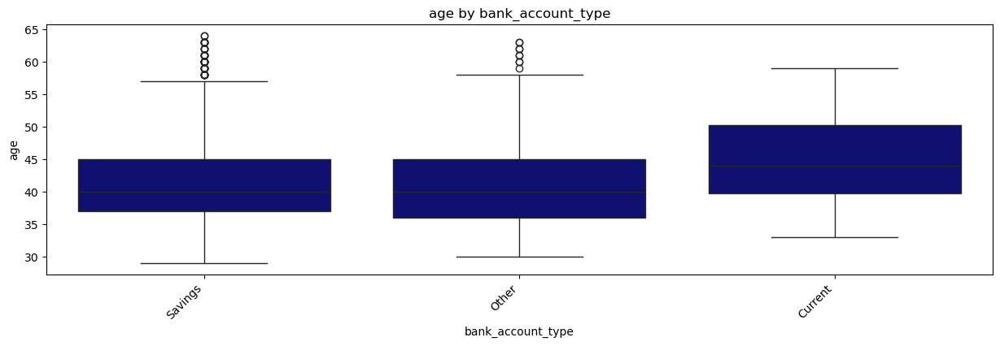

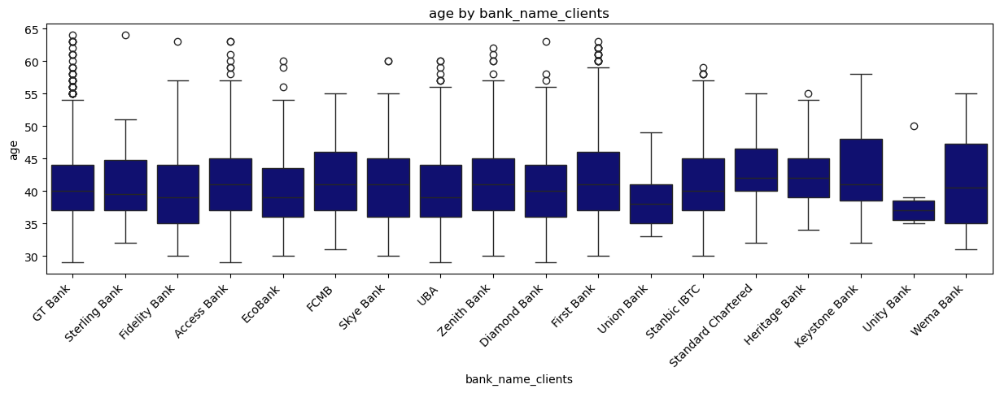

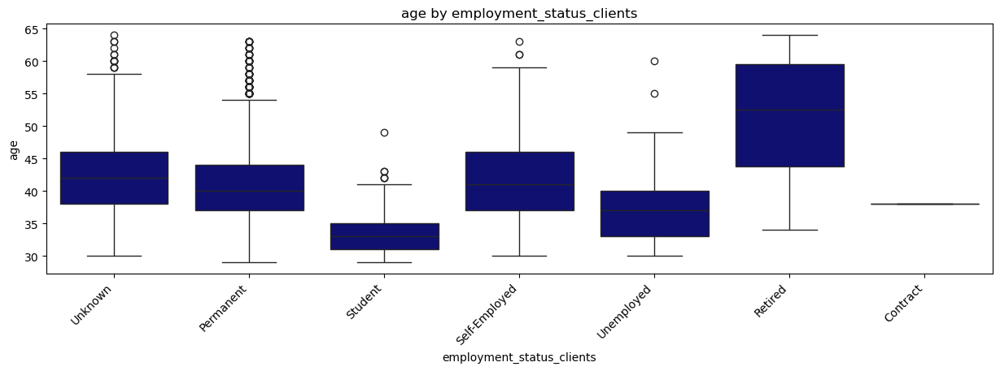

In [45]:
num_col = 'age'
cat_cols = ['bank_account_type', 'bank_name_clients', 'employment_status_clients']

for col in cat_cols:
    plt.figure(figsize=(15,4))
    sns.boxplot(data=demographics, x=col, y=num_col, color = 'navy')
    plt.title(f"{num_col} by {col}")
    plt.xticks(rotation=45, ha='right')
    plt.show()

# Insights from Age vs Categorical Variables

1. Age by Bank Account Type 
   - The median age (~40 years) is consistent across Savings and Other account types.  
   - Current account holders have a slightly higher median age, suggesting these accounts appeal more to older or established clients.  
   - Outliers exist across all types, especially Savings and Other accounts, showing a small subset of significantly older customers.  
   - The age spread is generally 35–45 years across all account types, reflecting a shared demographic target.  

2. Age by Bank Name Clients
   - Most banks serve clients with median ages between 38 and 45 years.  
   - Some banks (e.g., Union Bank, Unity Bank) show narrower age ranges, while others (e.g., Keystone Bank, Heritage Bank) attract clients across broader age segments.  
   - Outliers, especially in GT Bank, Sterling Bank, and UBA, reveal the presence of older clients outside the main cluster.  
   - This indicates that while banks generally target middle-aged clients, certain institutions serve broader or more niche segments.  

3. Age by Employment Status Clients  
   - Retired clients have the highest median age (~mid-50s), as expected.  
   - Self-employed and Unknown categories have medians in the early-to-mid 40s.  
   - Students and Unemployed clients are concentrated in the early-to-mid 30s, reflecting earlier life stages.  
   - Permanent employees are stable in the 35–45 age range, with some older outliers.  
   - These variations align well with expected career and life-cycle stages.  

Overall Conclusion
- Middle-aged clients (38–45 years) dominate across most categories, reaffirming this group as the core demographic.  
- Employment status provides clearer age differentiation than bank account type or bank name, reflecting natural life and career stages.  
- Outliers across all categories suggest a small but significant subset of older customers with distinct needs (e.g., retirement or wealth management). 
- The consistency in age medians across most categories highlights a shared target market in the mid-life stage, while certain banks and employment groups represent niche opportunities for tailored strategies.  

# Stacked Bar Visualization : Age Group vs Bank Account Type

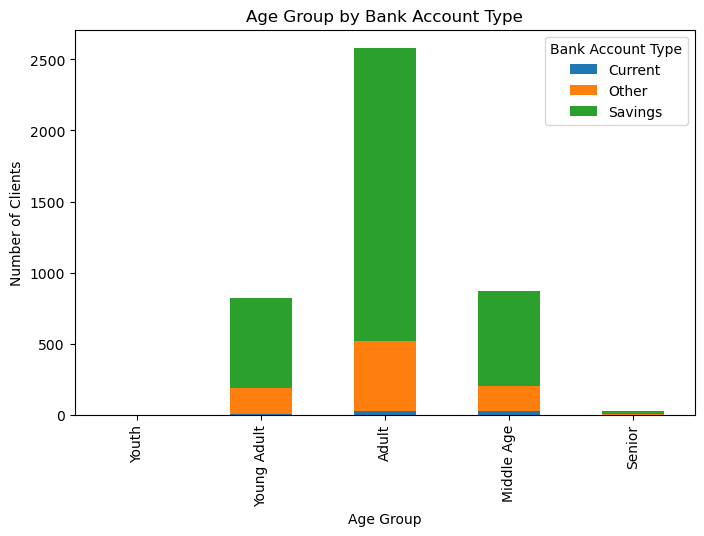

In [46]:
age_bank = demographics.groupby(['age_group', 'bank_account_type']).size().unstack()

age_bank.plot(kind='bar', stacked=True, figsize=(8,5))
plt.title("Age Group by Bank Account Type")
plt.ylabel("Number of Clients")
plt.xlabel("Age Group")
plt.legend(title="Bank Account Type")
plt.show()

Insights from Age Group vs Bank Account Type Visualization

1. Dominance of Adults (35–45 years)  
   - The Adult group has the highest number of clients by a wide margin.  
   - Most of these clients hold Savings accounts, reinforcing the strong preference for savings products among middle-aged customers.  
   - A smaller but noticeable portion of Adults hold Other accounts, while Current accounts are minimal.  

2. Young Adults (25–34 years) and Middle Age (45–54 years)  
   - Both groups are moderately represented, but far below the Adult category.  
   - Within these groups, Savings accounts remain dominant, with a smaller share of Other accounts.  
   - Current accounts are again rare, suggesting low adoption across all age segments.  

3. Youth (<25 years) and Seniors (55+ years) 
   - Both groups are barely represented in the dataset.  
   - This indicates limited engagement with very young clients (possibly due to limited financial independence) and older clients (possibly due to retirement or reduced banking activity).  

4. Overall Pattern 
   - Across all age groups, Savings accounts dominate, showing that they are universally preferred.  
   - Current accounts are nearly absent, regardless of age, indicating either a lack of demand or limited promotion of this product.  
   - The distribution suggests that the core customer base is middle-aged adults, while younger and older clients remain underrepresented.  

Strategic Implications
- Banks should strengthen offerings for Adults and Middle Age groups, as they form the bulk of clients.  
- Younger clients (Youth, Young Adults) present an untapped opportunity—designing entry-level products (e.g., student savings, digital wallets) could help capture this segment early.  
- Older clients (Seniors) may require specialized products (e.g., retirement savings, pension-linked accounts) to better serve their needs.  
- The near absence of Current accounts highlights a potential product gap, banks could repackage or market these accounts to appeal to professionals or business owners in the mid-age segments.  

# Employment Status vs Bank Account Type

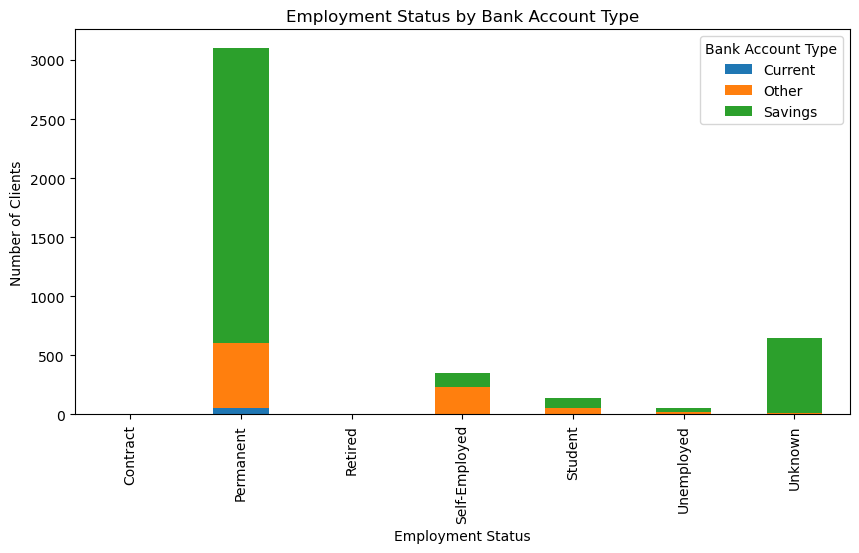

In [47]:
emp_bank = demographics.groupby(['employment_status_clients', 'bank_account_type']).size().unstack()

emp_bank.plot(kind='bar', stacked=True, figsize=(10,5))
plt.title("Employment Status by Bank Account Type")
plt.ylabel("Number of Clients")
plt.xlabel("Employment Status")
plt.legend(title="Bank Account Type")
plt.show()

Insights from Employment Status vs Bank Account Type Visualization

1. Permanent Employees Dominate  
   - The largest client group by far is Permanent employees, with well over 3,000 clients.  
   - Within this group, Savings accounts dominate, followed by a smaller share of Other accounts.  
   - Current accounts are almost absent, showing limited adoption even among financially stable clients.  

2. Other Employment Categories  
   - Self-employed and Students form the next significant groups, but their numbers are small compared to Permanent employees.  
   - Savings accounts remain the most common across these groups, though Self-employed clients show some diversity with “Other” accounts.  
   - Unemployed and Retired clients are very few, suggesting limited engagement or smaller financial inclusion in these categories.  

3. Unknown Employment Status  
   - A notable number of clients fall under Unknown, with Savings accounts dominating here as well.  
   - This points to a data quality issue, as unclear employment status makes it harder to segment and tailor financial products effectively.  

4. Overall Pattern  
   - Across all employment categories, Savings accounts dominate, showing universal appeal.  
   - Current accounts are almost invisible, regardless of employment type, indicating a significant gap in either demand or marketing.  
   - The dataset is skewed toward Permanent employees, making them the main target group, but also highlighting an opportunity to engage underserved categories (Students, Self-employed, Retired).  


Strategic Implications
- Permanent employees represent the core customer base and should be the primary target for retention and product upgrades.  
- Students and Self-employed clients present growth opportunities,tailored entry-level or flexible products (e.g., student savings, mobile banking, micro-credit) could help capture these groups early.  
- Retired and Unemployed clients are underrepresented; banks could design specialized products (retirement accounts, social benefit-linked accounts) to engage them.  
- Unknown employment status would be addressed through data cleaning and enrichment, as it represents a blind spot in customer understanding.  
- The near absence of Current accounts is a red flag, banks may need to rebrand or reposition them to attract working professionals and businesses.  

# Bank Name vs Age Group

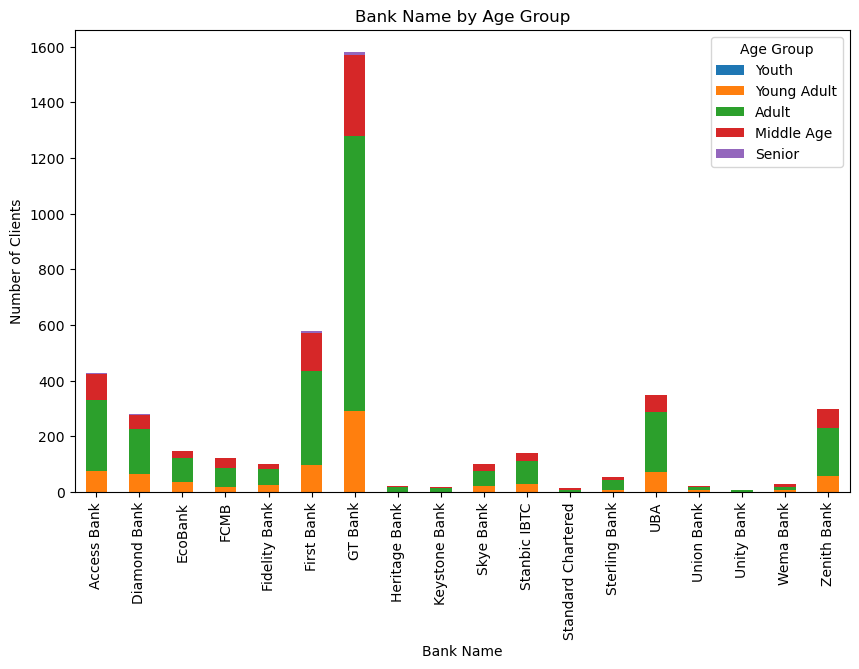

In [48]:
bank_age = demographics.groupby(['bank_name_clients', 'age_group']).size().unstack()

bank_age.plot(kind='bar', stacked=True, figsize=(10,6))
plt.title("Bank Name by Age Group")
plt.ylabel("Number of Clients")
plt.xlabel("Bank Name")
plt.legend(title="Age Group")
plt.show()

Insights from Bank Name vs Age Group Visualization

1. Dominance of GT Bank 
   - GT Bank has the largest client base overall, significantly ahead of all other banks.  
   - Within GT Bank, Adults (35–45 years) form the majority, followed by Middle-aged clients (45–54 years).  
   - Young Adults and other age groups are present but in much smaller numbers.  

2. First Bank as Secondary Leader
   - First Bank also has a sizeable client base, with Adults as the dominant group.  
   - Middle-aged clients make up a visible share, while Young Adults, Youth, and Seniors are minimally represented.  

3. UBA, Access Bank, and Diamond Bank 
   - These banks serve moderate numbers of clients compared to GT Bank and First Bank.  
   - Their distributions are similar: dominated by Adults and Middle-aged groups, with very few Youth or Seniors.  
   - Access Bank and UBA, in particular, have some of the stronger secondary representation after the top two banks.  

4. Other Banks (EcoBank, FCMB, Fidelity, Sterling, Zenith, etc.) 
   - These institutions have much smaller client bases overall.  
   - Most still serve primarily Adults, with minimal contributions from other age groups.  
   - Zenith Bank stands out slightly among the smaller banks with a modestly visible mix of Adults and Middle-aged clients.  

5. Overall Pattern
   - Across nearly all banks, Adults dominate the client base, followed by Middle-aged clients.  
   - Youth and Seniors are nearly absent, suggesting banks have weak penetration into these demographics.  
   - The concentration of clients in just a few banks (GT Bank, First Bank, UBA, Access) shows brand dominance and client loyalty in the sector.  

Strategic Implications
- GT Bank and First Bank are the clear leaders, and strategies focusing on partnerships or deeper client engagement with them would yield the most impact.  
- Adults (35–45 years) remain the core customer demographic across nearly all banks, highlighting this group’s central role in financial services.  
- The low representation of Youth and Seniors suggests missed opportunities:
  - Banks could design youth-focused digital banking products to capture early customers.  
  - For Seniors, retirement and wealth management solutions could open a niche market.  
- Smaller banks face serious market share challenges and may need to target niche age groups or regions to differentiate themselves.  

## Dealing with Outliers and Log Transformation of the Age Column

I checked the skewness of the age column to understand its distribution and determine whether it deviates significantly from a normal (symmetric) distribution. Skewness is important because highly skewed data can negatively impact the performance models.

In this dataset, the age column was found to be right-skewed, meaning the tail of the distribution extends toward higher values. This pattern is common in demographic data, where the majority of individuals fall within younger to middle age ranges, with fewer very old individuals.

I also performed outlier detection using the Interquartile Range (IQR) method, which is robust to skewed data. This step helped identify extreme values that could disproportionately influence model training and distort statistical measures like the mean. Detecting outliers allows for informed decisions on whether to keep, transform, or remove them, depending on the context and modeling goals.

By performing these checks, I ensured the age feature is well-understood and appropriately handled before modeling, improving data quality and predictive reliability.

In [49]:
# I checked for skewness
skew_value = demographics['age'].skew()
print(f"Skewness of age: {skew_value}")

Skewness of age: 0.7021520171609801


The calculated skewness for the age variable is 0.702, which indicates a moderate positive skew. 

Meaning:
- Positive skew (right skew) means the right tail of the distribution is longer than the left.
- Most borrowers are clustered toward the younger or middle ages, with fewer older borrowers pulling the mean upward.
- According to common skewness thresholds:
  - 0 → perfectly symmetrical
  - 0 to ± 0.5 → fairly symmetrical
  - ± 0.5 to ±1 → moderately skewed
  - > ± 1 → highly skewed

In [50]:
# I calculated Q1, Q3 and IQR
Q1 = demographics['age'].quantile(0.25)
Q3 = demographics['age'].quantile(0.75)
IQR = Q3 - Q1

In [51]:
# I defined the bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [52]:
# I identified the outliers
outliers = demographics[(demographics['age'] < lower_bound) | (demographics['age'] > upper_bound)]
print(f"Number of outliers in age: {outliers.shape[0]}")
outliers['age']

Number of outliers in age: 63


9       60
68      59
124     58
444     59
610     59
        ..
4041    58
4235    59
4259    62
4297    59
4303    58
Name: age, Length: 63, dtype: int32

The analysis identified 63 outliers in the age column using the IQR (Interquartile Range) method.
- Row 9 has age = 60
- Row 68 has age = 59
- Row 124 has age = 58

Insights:
- The outliers are mostly concentrated at the upper end of the age range (e.g., 58–62 years old), suggesting that the bulk of the dataset contains younger individuals.
- Since the skewness of age was moderately positive (0.702), the right tail of the distribution (older ages) is longer — these values are contributing to that skew.
- These records are not necessarily errors; they may represent legitimate older borrowers who are simply rare in the dataset.

In [53]:
# I logged transform the age
demographics['log_age'] = np.log1p(demographics['age'])

In [54]:
# I previewed the age and log_age column
demographics[['age', 'log_age']].head()

,age,log_age
0,52,3.970292
1,39,3.688879
2,38,3.663562
3,34,3.555348
4,43,3.784190


I created a new feature log_age by applying a natural log transformation to the age column using log1p (log of age + 1). This transformation reduces right-skewness, compresses the scale of large values. Both age and log_age are retained for now, allowing flexibility in model selection.

# Visualizing the Log_Age Column

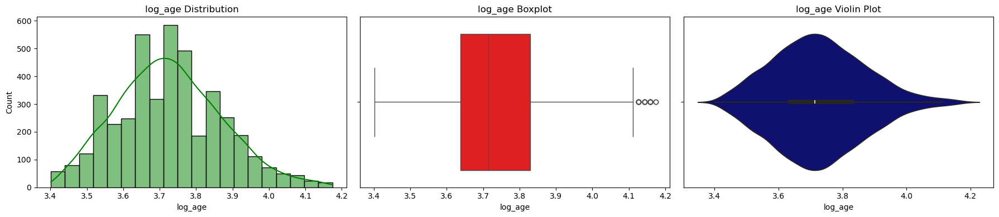

In [55]:
col = 'log_age' 

fig, axes = plt.subplots(1, 3, figsize=(18, 4))

# Histogram
sns.histplot(demographics[col], kde=True, bins=20, color='green', ax=axes[0])
axes[0].set_title(f'{col} Distribution')
axes[0].set_xlabel(col)
axes[0].set_ylabel('Count')

# Boxplot
sns.boxplot(x=demographics[col], color='red', ax=axes[1])
axes[1].set_title(f'{col} Boxplot')
axes[1].set_xlabel(col)

# Violin Plot
sns.violinplot(x=demographics[col], color='navy', ax=axes[2])
axes[2].set_title(f'{col} Violin Plot')
axes[2].set_xlabel(col)

plt.tight_layout()
plt.show()

Interpretation of log_age Distribution and Outlier Analysis

1. Histogram (left plot):
- The distribution of log_age is now closer to normal after applying the logarithmic transformation.
- Most values cluster around the center (≈ 3.6–3.8), indicating reduced skewness compared to the raw age variable.
- The transformation has compressed the right tail, making the spread more balanced.

2. Boxplot (middle plot):
- The majority of the data lies within a compact interquartile range (IQR).
- A few points on the right side are flagged as outliers, but they are fewer and less extreme compared to the untransformed age.
- These outliers still represent older borrowers but are now less distant from the main distribution.

3. Violin plot (right plot):
- The distribution is symmetric around the median after transformation.
- The plot confirms that most data is concentrated in the middle range, with thinner tails at both extremes.
- The density is highest near the median, indicating a large proportion of borrowers fall within the typical age range.

Overall Insight:
- Applying a log transformation to age successfully reduced positive skewness and brought the distribution closer to normality.
- The number and severity of outliers have decreased, making this transformed variable better suited for models sensitive to skewed data 

In [56]:
# I previewed the demographics column

demographics.sample(3)

,customerid,bank_account_type,bank_name_clients,employment_status_clients,age,age_group,city,state,log_age
701,8a858ee55830c4b90158341898b03594,Other,Access Bank,Unemployed,33,Young Adult,Ashipa,Lagos,3.526361
365,8a858f445a4c929e015a4ca09cf50f44,Savings,GT Bank,Permanent,44,Adult,Hotoro south,Kano,3.806662
3154,8a858f365b2547f3015b32c34eed3f93,Savings,UBA,Permanent,40,Adult,Unknown,Ogun,3.713572


## PERFORMANCE DATASET

## Performance Dataset Column Description

| Column Name     | Description |
|------------------|-------------|
| `customerid`     | Unique customer ID (used to join with other datasets like demographics). |
| `systemloanid`   | Internal loan system ID. |
| `loannumber`     | Number of times the customer has taken a loan (can indicate borrower behavior). |
| `approveddate`   | Date the loan was approved. |
| `creationdate`   | Date the loan request was created. |
| `loanamount`     | The amount of money granted to the borrower. |
| `totaldue`       | Amount expected to be paid back (loan amount + fees/interest). |
| `termdays`       | Duration of the loan in days. |
| `referredby`     | Referrer ID. |

## Cleaning of Performance Dataset

In preparing the performance dataset for modelling, I conducted a series of cleaning and feature engineering steps to ensure that the data was structured, interpretable, and machine-learning.

1. Removed Unnecessary Columns: I dropped irrelevant columns such as:
- systemloanid: an internal tracking ID with no analytical value.
- referredby: a high-cardinality identifier that doesn't directly contribute to modeling goals.
- 'approveddate' and 'creationdate': after extracting their components, I removed the original full datetime columns to reduce noise.

2. Feature Engineering from Date Columns:
- The 'approveddate' and 'creationdate' columns contained both date and time values. Since the time component (hour/minute) was not important for this analysis, I extracted useful date-related features:
- approved_day and creation_day: Clean calendar dates (YYYY-MM-DD) for daily-level tracking.
- approved_year, approved_month: To group loans by month or year of approval.
- creation_year, creation_month: To analyze trends in loan requests over time.

3. Created Loan Duration Feature
- I calculated 'loan_duration_days' by subtracting the 'creation_day' from 'approved_day'. This gave insights into how long it took for a loan to be approved after being requested.

4. Extracted Approval Time Insights
From the approved date, I extracted:
- 'approved_hour' to analyze loan approvals by time of day.
- 'day_of_week' to check if loans are more likely approved on weekdays.
- 'is_weekend' as a binary feature (1 = weekend, 0 = weekday).


5. Handled Missing Values

In [57]:
# I loaded the dataset from URL
perf_url = "https://raw.githubusercontent.com/Oyeniran20/axia_cohort_8/refs/heads/main/trainperf.csv"

performance= pd.read_csv(perf_url)

In [58]:
# I checked the random 3 rows of the performance dataset

performance.sample(3)

,customerid,systemloanid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,referredby,good_bad_flag
1065,8a858e395cb1d4d9015cc4deb919484a,301983390,2,2017-07-18 09:53:39.000000,2017-07-18 08:53:31.000000,10000.0,13000.0,30,8a858f665c2142a0015c2cf209e20a6f,Good
3266,8a8589d754a05c0a0154a48518666580,301981095,3,2017-07-17 03:31:15.000000,2017-07-17 02:31:07.000000,10000.0,13000.0,30,NaN,Good
376,8a858edf55ca17ba0155d58ee8d43f6a,301999627,2,2017-07-27 22:44:00.000000,2017-07-27 21:43:54.000000,10000.0,11500.0,15,NaN,Good


In [59]:
 # I checked for basic info

performance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4368 entries, 0 to 4367
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   customerid     4368 non-null   object 
 1   systemloanid   4368 non-null   int64  
 2   loannumber     4368 non-null   int64  
 3   approveddate   4368 non-null   object 
 4   creationdate   4368 non-null   object 
 5   loanamount     4368 non-null   float64
 6   totaldue       4368 non-null   float64
 7   termdays       4368 non-null   int64  
 8   referredby     587 non-null    object 
 9   good_bad_flag  4368 non-null   object 
dtypes: float64(2), int64(3), object(5)
memory usage: 341.4+ KB


From the above, some of the columns are not appropriately categorized. However, I will treat them later.

In [60]:
performance.describe()

,systemloanid,loannumber,loanamount,totaldue,termdays
count,4.368000e+03,4368.000000,4368.000000,4368.000000,4368.000000
mean,3.019810e+08,5.172390,17809.065934,21257.377679,29.261676
std,1.343115e+04,3.653569,10749.694571,11943.510416,11.512519
min,3.019585e+08,2.000000,10000.000000,10000.000000,15.000000
25%,3.019691e+08,2.000000,10000.000000,13000.000000,30.000000
50%,3.019801e+08,4.000000,10000.000000,13000.000000,30.000000
75%,3.019935e+08,7.000000,20000.000000,24500.000000,30.000000
max,3.020040e+08,27.000000,60000.000000,68100.000000,90.000000


# Interpretation of Summary Statistics – Performance Dataset

1. systemloanid
- This appears to be a unique identifier and is not suitable for numerical analysis.
- The values are large integers (in the 3.019×10⁸ range) but have no analytical meaning beyond identification.

2. loannumber
- Ranges from 2 to 27, with a median of 4.
- The majority of loans fall between 2 and 7, indicating most clients have taken only a few loans.
- Higher loan numbers (above 15) may represent repeat or long-term customers.

3. loanamount
- Ranges from 10,000 to 60,000.
- The median is 10,000, meaning half of the loans are for the minimum amount.
- The 75th percentile is 20,000, showing that large loans (above 25,000) are relatively rare.
- The mean (17,809) is higher than the median, suggesting a right-skewed distribution due to some high-value loans.

4. totaldue
- Ranges from 10,000 to 68,100, with a median of 13,000.
- The mean (21,257) is noticeably higher than the median, again showing right skewness likely caused by higher repayment amounts for larger loans or extended loan terms.
- This variable is directly influenced by loanamount and possibly interest rates or penalties.

5. termdays
- Loan terms range from 15 to 90 days.
- The median and 75th percentile are both 30 days, suggesting that the majority of loans have a 1-month term.
- A small portion of loans extends beyond 30 days, up to 90 days.

Key Observations:
- The numerical features ('loanamount', 'totaldue') are right-skewed, indicating the presence of a few large-value loans that pull the average upward.
- 'systemloanid' is not analytically useful and wouldbe excluded from statistical modeling.
- 'loannumber' and 'termdays' suggest a typical customer profile: few loans taken, usually short-term (30 days).

In [61]:
# I checked for missing values

performance.isna().sum().sort_values(ascending = False)

referredby       3781
customerid          0
systemloanid        0
loannumber          0
approveddate        0
creationdate        0
loanamount          0
totaldue            0
termdays            0
good_bad_flag       0
dtype: int64

In [62]:
# I checked for the percentage of missing values

performance.isna().sum().sort_values(ascending = False) / len (performance) * 100

referredby       86.561355
customerid        0.000000
systemloanid      0.000000
loannumber        0.000000
approveddate      0.000000
creationdate      0.000000
loanamount        0.000000
totaldue          0.000000
termdays          0.000000
good_bad_flag     0.000000
dtype: float64

## Dropping Columns

In [63]:
# I dropped 2 columns

performance.drop(['systemloanid', 'referredby'], axis=1, inplace=True)

I dropped systemloanid and referredby because they are not useful for modeling. Also, referred by has 86.5% missing values as well.

In [64]:
# I previewed random 3 columns
performance.sample(3)

,customerid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,good_bad_flag
4170,8a858e0f5577f579015581d14503059f,12,2017-07-24 16:27:30.000000,2017-07-24 15:27:22.000000,40000.0,44000.0,30,Good
91,8a858f0f5bfd79d2015c0331ce3378fe,2,2017-07-26 19:36:09.000000,2017-07-26 18:36:02.000000,10000.0,11500.0,15,Good
238,8a858fb557330de1015750e05ade4eb8,4,2017-07-14 11:37:32.000000,2017-07-14 10:36:21.000000,10000.0,13000.0,30,Good


## Debt-to-Income Ratio(DTI)

In [65]:
# I engineered DTI to show how much loan was taken relative to repayment burden

performance['debt_to_income'] = performance['loanamount'] / (performance['totaldue'] + 1)

## Estimated Income

In [66]:
# I estimated income by dividing total due by the debt-to-income ratio
performance['estimated_income'] = performance['totaldue'] / (performance['debt_to_income'] + 1e-9)

## Loan-to-Income Ratio

In [67]:
# I created a column `loan_to_income_ratio` by dividing loan amount by estimated income to assess borrower affordability.
performance['loan_to_income_ratio'] = performance['loanamount'] / (performance['estimated_income'] + 1e-9)

## Loan-to-Term Ratio

In [68]:
# I engineered this to show how much is borrowed per repayment day.

performance['loan_to_term_ratio'] = performance['loanamount'] / (performance['termdays'] + 1)

## Extracting Approval Year and Month

In [69]:
# I converted 'approveddate' and 'creationdate' into datetime objects for further extraction.
performance['approveddate'] = pd.to_datetime(performance['approveddate'], errors='coerce')
performance['creationdate'] = pd.to_datetime(performance['creationdate'], errors='coerce')

In [70]:
# I extracted year, month, and full calendar date to track loan trends over time.
performance['approved_day'] = performance['approveddate'].dt.date
performance['creation_day'] = performance['creationdate'].dt.date

performance['approved_year'] = performance['approveddate'].dt.year
performance['approved_month'] = performance['approveddate'].dt.month

performance['creation_year'] = performance['creationdate'].dt.year
performance['creation_month'] = performance['creationdate'].dt.month

In [71]:
# I extracted approval time insights to evaluate business process efficiency
performance['approved_hour'] = performance['approveddate'].dt.hour
performance['approved_weekday'] = performance['approveddate'].dt.day_name()
performance['is_weekend'] = performance['approved_weekday'].isin(['Saturday', 'Sunday']).astype(int)

In [72]:
# I calculated how many days it took for the loan to be approved after it was requested.
performance['loan_duration_days'] = (performance['approveddate'] - performance['creationdate']).dt.days

In [73]:
# I engineered the number of credit lines(loan number)
performance['total_loans'] = performance.groupby('customerid')['loannumber'].transform('max')

In [74]:
# I encoded the target column

performance['flag'] = performance['good_bad_flag'].map({'Good': 0, 'Bad': 1})

The 'flag' variable is a numeric representation of 'good_bad_flag':
- 0 : Loan was repaid on time (“Good”).
- 1 : Loan defaulted or had repayment issues (“Bad”).

A higher proportion of '1' values indicates a greater share of problematic loans, while a higher proportion of '0' values indicates healthier repayment performance.

In [75]:
# I dropped original datetime and text target columns after extracting useful features.
performance.drop(['approveddate', 'creationdate', 'good_bad_flag'], axis=1, inplace=True)

In [76]:
performance.sample(5)

,customerid,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_day,...,approved_year,approved_month,creation_year,creation_month,approved_hour,approved_weekday,is_weekend,loan_duration_days,total_loans,flag
666,8a858e0a5b192e2e015b194726201191,5,20000.0,24500.0,30,0.816293,30013.724963,0.666362,645.161290,2017-07-08,...,2017,7,2017,7,9,Saturday,1,0,5,0
1534,8a858ed25bf83782015bfb706c897db3,3,10000.0,13000.0,30,0.769172,16901.299978,0.591670,322.580645,2017-07-04,...,2017,7,2017,7,10,Tuesday,0,0,3,0
4349,8a858fa3552ae1120155466a51db4d34,15,40000.0,44000.0,30,0.909070,48401.099947,0.826427,1290.322581,2017-07-04,...,2017,7,2017,7,10,Tuesday,0,0,15,0
2500,8a858e955cf51403015cf88251eb3019,2,10000.0,13000.0,30,0.769172,16901.299978,0.591670,322.580645,2017-07-19,...,2017,7,2017,7,16,Wednesday,0,0,2,1
3777,8a858fa257d8223c0157f60ebd4d310f,2,10000.0,13000.0,30,0.769172,16901.299978,0.591670,322.580645,2017-07-04,...,2017,7,2017,7,13,Tuesday,0,0,2,0


In [77]:
# I checked for the uniqueness of the year extracted

print(performance['approved_year'].unique())
print(performance['creation_year'].unique())

[2017]
[2017]


From the above, they have the same year, I will drop the column to reduce redundancy and simplify the dataset

In [78]:
# I dropped the columns
performance.drop(['approved_year', 'creation_year'], axis=1, inplace=True)

In [79]:
# I rechecked the columns

performance.sample(5)

,customerid,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_day,creation_day,approved_month,creation_month,approved_hour,approved_weekday,is_weekend,loan_duration_days,total_loans,flag
4070,8a858fb557330de101573d9e848a6536,6,25000.0,28750.0,30,0.869535,33063.649962,0.756117,806.451613,2017-07-05,2017-07-05,7,7,8,Wednesday,0,0,6,0
1254,8a858f445d41ebbe015d50c105334acc,2,10000.0,11500.0,15,0.869490,13226.149985,0.756078,625.000000,2017-07-25,2017-07-25,7,7,17,Tuesday,0,0,2,0
1315,8a858e0c5bfceae6015bfcfabccb0a81,3,10000.0,13000.0,30,0.769172,16901.299978,0.591670,322.580645,2017-07-05,2017-07-05,7,7,18,Wednesday,0,0,3,0
3890,8a858f1e5baffcc9015bb02b505f180d,5,20000.0,24500.0,30,0.816293,30013.724963,0.666362,645.161290,2017-07-18,2017-07-18,7,7,5,Tuesday,0,0,5,0
1896,8a858eba5b681df4015b7b63e6ed6a23,4,10000.0,11500.0,15,0.869490,13226.149985,0.756078,625.000000,2017-07-22,2017-07-22,7,7,19,Saturday,1,0,4,0


In [80]:
# I checked for the uniqueness of the month extracted

print(performance['approved_month'].unique())
print(performance['creation_month'].unique())

[7]
[7]


From the above, they have the same year, I will drop the column to reduce redundancy and simplify the dataset

In [81]:
# I dropped the columns
performance.drop(['approved_month', 'creation_month'], axis=1, inplace=True)

In [82]:
# I rechecked the dataset

performance.sample(3)

,customerid,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_day,creation_day,approved_hour,approved_weekday,is_weekend,loan_duration_days,total_loans,flag
1172,8a858e005c2154c2015c218a9a451516,2,10000.0,13000.0,30,0.769172,16901.299978,0.591670,322.580645,2017-07-02,2017-07-02,20,Sunday,1,0,2,1
4298,8a858f955cc6631f015ccabe708129ed,2,10000.0,13000.0,30,0.769172,16901.299978,0.591670,322.580645,2017-07-06,2017-07-06,20,Thursday,0,0,2,1
577,8a858f9158be26030158cca6f4aa5f6e,9,20000.0,22250.0,15,0.898836,24754.237472,0.807942,1250.000000,2017-07-05,2017-07-05,18,Wednesday,0,0,9,1


In conclusion, I removed the 'approved_year', 'creation_year', 'creation_month' and 'approved_month' columns after confirming they contained only one unique value (2017 and 7, respectively). 

Since features with no variance do not contribute to the model’s learning process and can add unnecessary complexity, dropping them ensures a leaner and more relevant dataset.

In [83]:
# I checked for the uniqueness of the loan_duration_days

print(performance['loan_duration_days'].unique())

[0 1]


The 'loan_duration_days' variable measures the number of days between loan creation and approval.  
The values in the dataset are primarily 0 and 1, which provide the following insights:

- 0 Days: Loan was approved on the same day it was created/requested.  
This indicates a fast approval process, likely due to automated systems or pre-approved clients.

- 1 Day: Loan was approved the day after it was created/requested.  
This suggests some level of manual review, additional verification, or batch processing overnight.

In [84]:
# I checked for the uniqueness of the is_weekend

print(performance['is_weekend'].unique())

[0 1]


The 'is_weekend' variable indicates whether the loan was approved on a weekend.

- 0: Loan approval occurred on a weekday (Monday–Friday).
- 1: Loan approval occurred on a weekend (Saturday or Sunday).

In [85]:
# I checked for duplicates using customer id

performance.duplicated(subset='customerid').sum()

0

From the above, there are no duplicates.

In [86]:
# I dropped more columns
performance.drop(['approved_day', 'creation_day'], axis=1, inplace=True)

I dropped the columns 'approved_day' and 'creation_day' from the 'performance' dataset. These columns have already been decomposed into more granular time-based features ('approved_weekday', 'approved_hour', and 'is_weekend') which captures the same temporal information in a more analysis-friendly way.  

In [87]:
# I rounded off the numbers in the columns

performance = performance.round({
    'debt_to_income': 3,
    'loan_to_income_ratio': 3,
    'loan_to_term_ratio': 3,
    'estimated_income': 4,
})

I rounded numerical columns (e.g., 'debt_to_income', 'loan_to_income_ratio', 'loan_to_term_ratio', 'default_rate', 'estimated_income') to a consistent number of decimal places to enhance readability and maintain a cleaner presentation in tables and visualizations.

I did not round monetary columns such as 'estimated_income', 'loanamount', and 'totaldue' because preserving their full precision is crucial for accurate financial reporting, maintaining integrity in subsequent calculations, and avoiding cumulative rounding errors.

In [88]:
# I rechecked the dataset

performance.sample(3)

,customerid,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_hour,approved_weekday,is_weekend,loan_duration_days,total_loans,flag
1750,8a858eba5591bf28015598d9905c1ce2,6,10000.0,13000.0,30,0.769,16901.30,0.592,322.581,7,Tuesday,0,0,6,1
1456,8a858f0f5bfd79d2015c0647c85b2c1d,3,10000.0,13000.0,30,0.769,16901.30,0.592,322.581,23,Wednesday,0,0,3,0
1953,8a858f8a558227f201558b6beb697cd8,13,30000.0,34500.0,30,0.870,39676.15,0.756,967.742,21,Saturday,1,0,13,0


## Visualization

In [89]:
# I grouped the columns into categorical and numerical

num_cols = ['loannumber','loanamount','totaldue','termdays','debt_to_income','estimated_income','loan_to_income_ratio', 
            'loan_to_term_ratio', 'approved_hour', 'total_loans']

cat_cols = ['approved_weekday', 'is_weekend', 'loan_duration_days', 'flag']

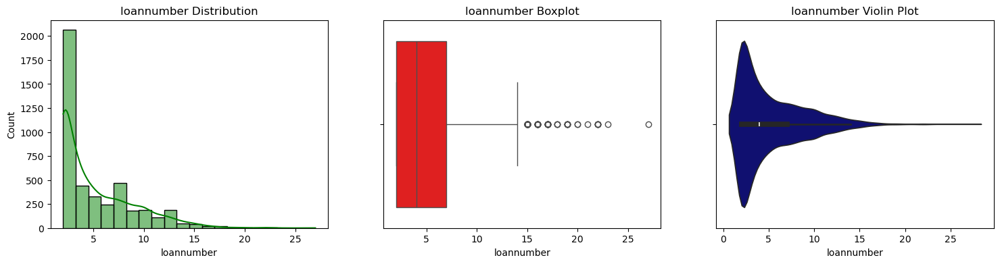

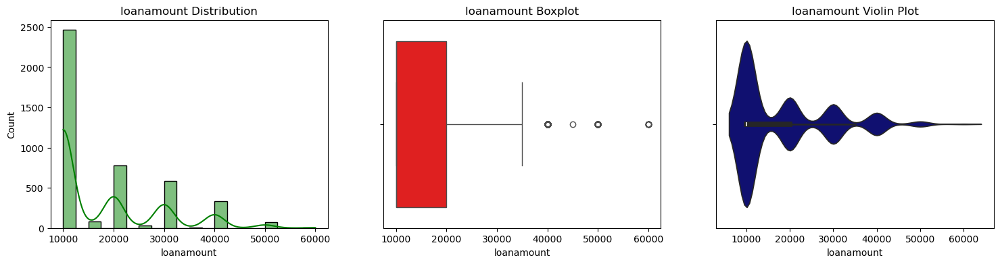

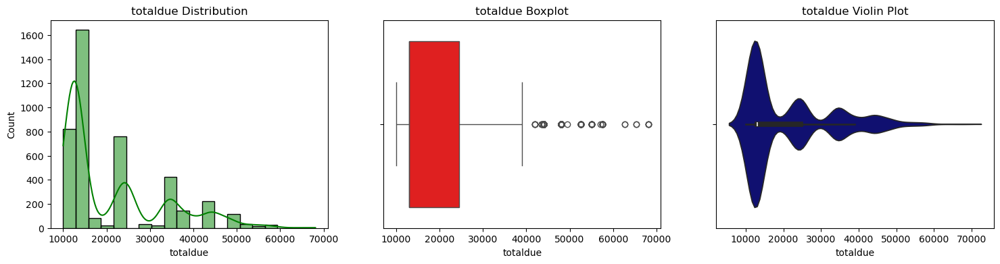

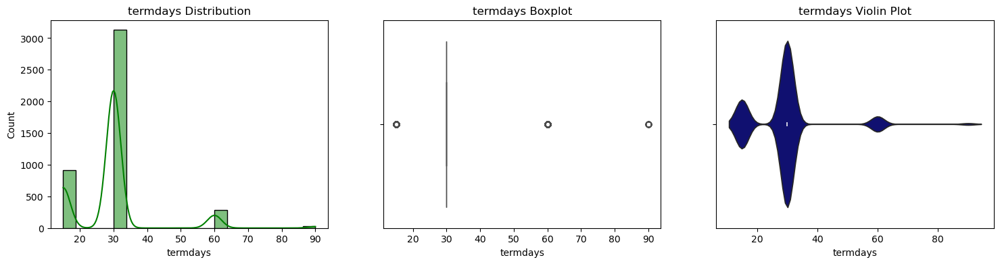

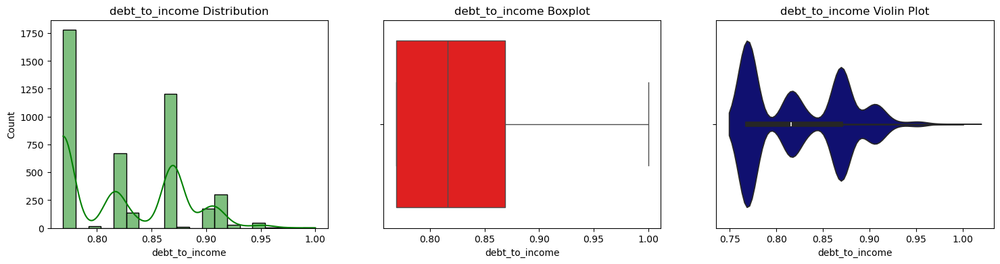

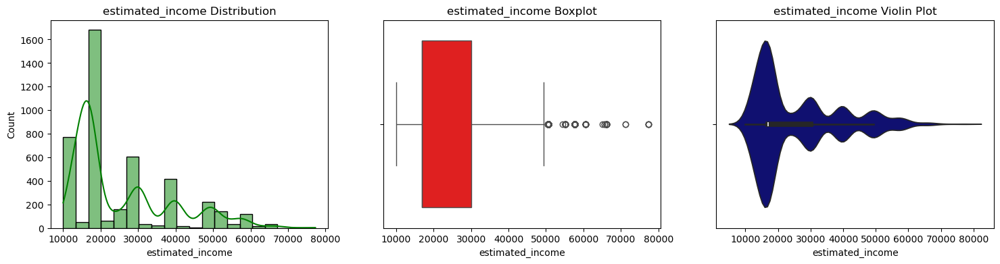

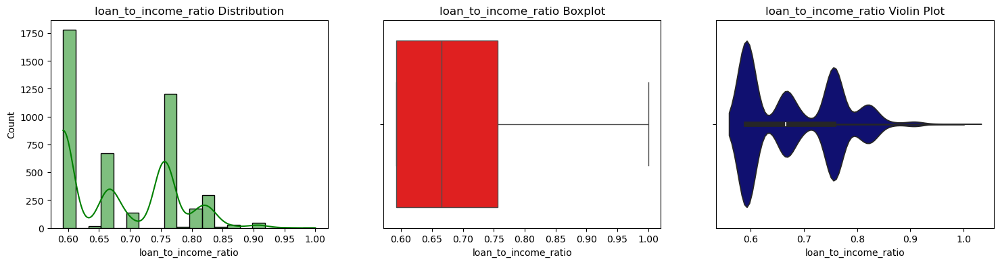

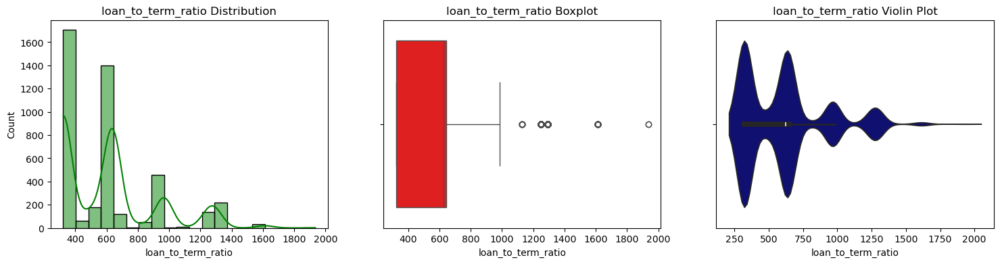

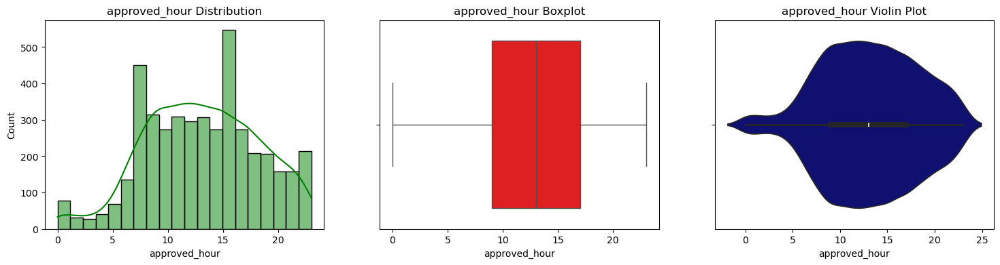

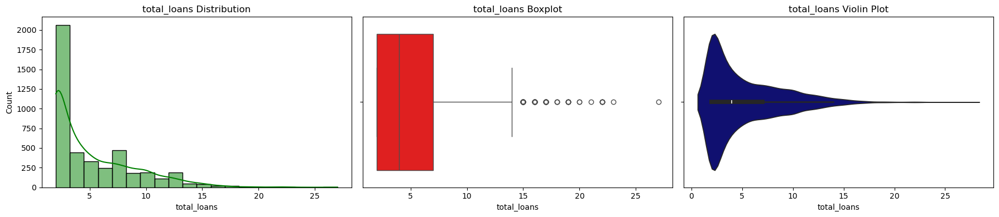

In [90]:
# I visualized the numerical columns using a loop
for col in num_cols:
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))
    
    # for histogram
    sns.histplot(performance[col], kde=True, bins=20, color='green', ax=axes[0])
    axes[0].set_title(f'{col} Distribution')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('Count')

    # for boxplot
    sns.boxplot(x=performance[col], color='red', ax=axes[1])
    axes[1].set_title(f'{col} Boxplot')
    axes[1].set_xlabel(col)

    # for violinplot
    sns.violinplot(x=performance[col], color = 'navy', ax=axes[2])
    axes[2].set_title(f'{col} Violin Plot')
    axes[2].set_xlabel(col)
    
plt.tight_layout()
plt.show()

Insights from Performance Dataset Visualizations

1. Borrowing Behavior  
   - Most customers are low-frequency borrowers (1–5 loans), indicating that credit is used occasionally rather than habitually.  
   - A small subset of high-frequency borrowers (15+ loans) exists, suggesting strong reliance on credit products or higher financial dependency. These could represent loyal customers or potential risk cases requiring monitoring.  

2. Loan Amounts & Repayments  
   - Lending activity is concentrated on small to medium loan amount*, with only a few very large loans.  
   - High-value loans result in correspondingly high repayment totals (totaldue), creating repayment risks if income levels are not aligned.  
   - This pattern suggests the institution is risk-conscious, focusing on smaller, more manageable loans for the majority of clients.  

3. Loan Terms 
   - Loan periods are highly standardized (15, 30, 60 days), reducing complexity in repayment scheduling.  
   - Standardization may improve repayment discipline, but it may also limit flexibility for diverse borrower needs.  

4. Debt-to-Income & Income Distribution 
   - Most customers borrow within reasonable debt-to-income ratios (<1.0), showing lending is generally aligned with repayment ability.  
   - A minority of customers with high debt-to-income ratios are potential default risks and should be flagged for closer credit checks.  
   - The income distribution is heavily skewed toward low-income clients, indicating that the customer base is primarily lower-earning individuals who may be more sensitive to repayment pressures.  

5. Loan-to-Income & Loan-to-Term Ratios 
   - Most loans are sized conservatively relative to income (ratios <1), but outliers reveal risky lending profiles.  
   - The loan-to-term ratio shows extreme outliers, large loans issued for short repayment periods, creating significant repayment burdens.  
   - These borrowers may face repayment stress and require special monitoring or tailored repayment plans.  

6. Approval Patterns 
   - Loan approvals occur throughout the day, with slight peaks at midday and evening, suggesting operational efficiency is maintained across business hours.  
   - This even spread indicates no systemic bottleneck, but staffing or automation could be optimized around peak hours.  

7. Borrowing History (Total Loans) 
   - Similar to loannumber, the majority of clients have few recorded loans, while a minority hold extensive borrowing histories.  
   - These repeat borrowers may be prime candidates for loyalty products or targeted risk assessments, depending on their repayment performance.  

Overall Strategic Insights
- The customer base is dominated by low-income, middle-aged individuals taking small, short-term loans.  
- A minority of clients with high-frequency borrowing, large loan amounts, or risky ratios** represent both valuable loyal clients and potential default risks.  
- The lending model is conservative and standardized, reducing risk but possibly overlooking customers who need more flexible products.  
- Data highlights opportunities to:  
  - Expand flexible loan terms to attract diverse borrowers.  
  - Closely monitor high debt-to-income and high loan-to-term clients to manage repayment risk.  
  - Leverage repeat borrowers by offering tailored products (e.g., loyalty discounts, bundled services).  
  - Improve financial inclusion for underserved groups, particularly those with very low income or limited borrowing history.  

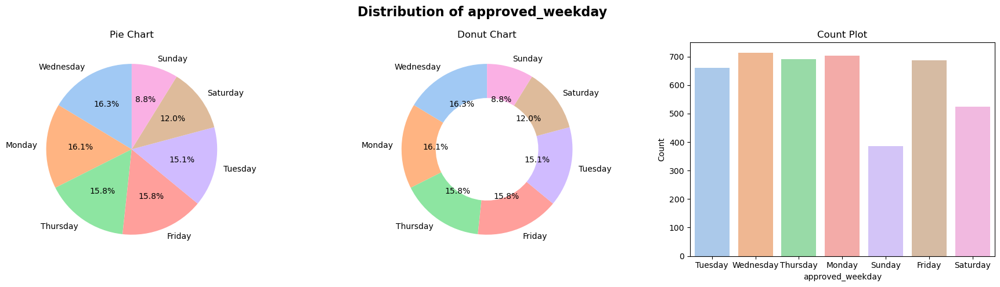

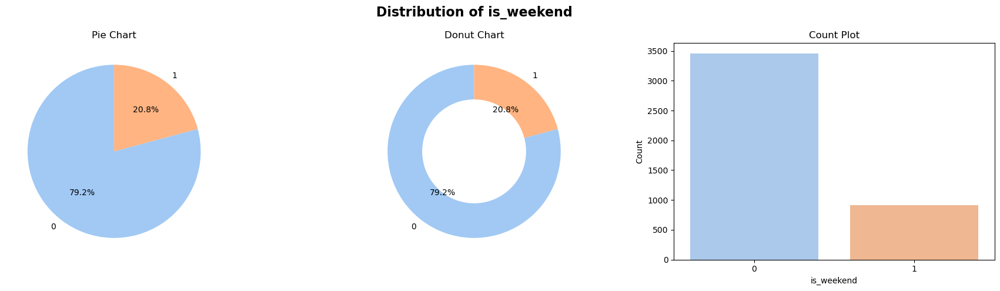

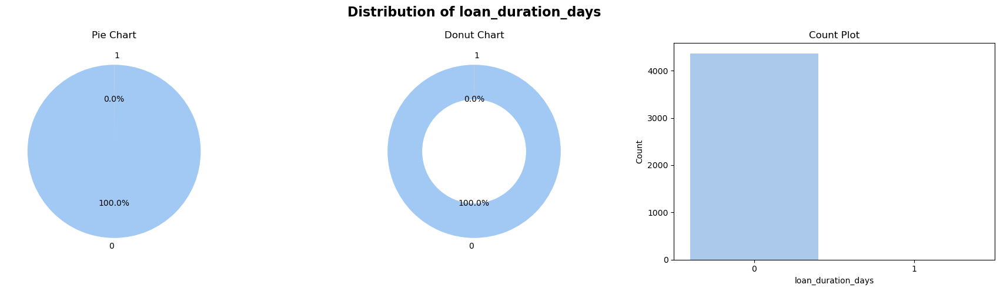

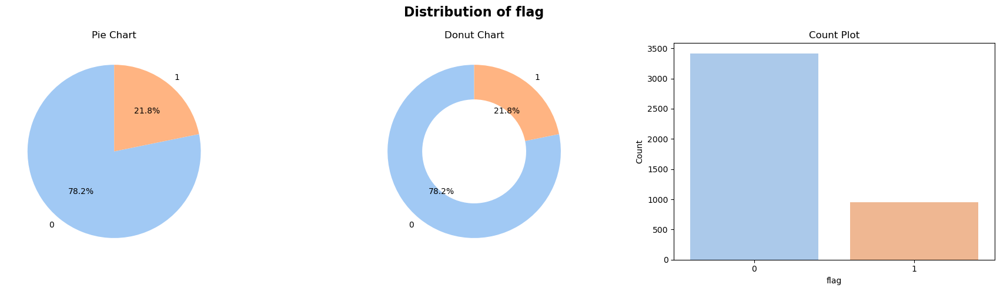

In [91]:
# I visualized the categorical columns

for col in cat_cols:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f'Distribution of {col}', fontsize=16, fontweight='bold')
    
    # Pie Chart 
    axes[0].pie(
        performance[col].value_counts(),
        labels=performance[col].value_counts().index,
        autopct='%1.1f%%',
        startangle=90,
        colors=sns.color_palette("pastel")
    )
    axes[0].set_title('Pie Chart')
    
    # Donut Chart
    wedges, texts, autotexts = axes[1].pie(
        performance[col].value_counts(),
        labels=performance[col].value_counts().index,
        autopct='%1.1f%%',
        startangle=90,
        colors=sns.color_palette("pastel"),
        wedgeprops=dict(width=0.4)  
    )
    axes[1].set_title('Donut Chart')
    
    # Bar Plot 
    sns.countplot(
        x=col,
        data=performance,
        ax=axes[2],
        palette="pastel"
    )
    axes[2].set_title('Count Plot')
    axes[2].set_ylabel('Count')
    
    plt.tight_layout()
    plt.show()

Insights from Categorical Column Visualizations

1. Approved Weekday 
   - Loan approvals are fairly balanced across weekdays, but with slight peaks on Wednesday (16.3%) and Monday (16.1%).  
   - Sunday shows the lowest activity (8.8%)**, highlighting reduced lending during weekends.  
   - Implication: Borrowers and lenders prefer processing loans during standard working days, particularly early to midweek. Lower weekend activity likely reflects reduced operational capacity or borrower availability.  

2. Is Weekend  
   - A large majority of approvals (79.2%) occur on weekdays (0), with only 20.8% on weekends (1).  
   - Implication: Lending is primarily a weekday-driven activity, aligning with business operations and typical borrower demand cycles. This reinforces the weekday preference observed in the weekday distribution.  

3. Loan Duration Days 
   - The variable is completely skewed toward '0' days, with no meaningful spread across categories.  
   - Implication: This feature lacks variability and does not differentiate between records. It is likely non-informative and would be excluded from predictive modeling.  

4. Flag
   - Distribution: 78.2% of loans are flagged as '0' (non-default), while 21.8% are flagged as '1' (default).  
   - The distribution closely mirrors the default_rate, suggesting strong correlation or potential duplication in meaning.  
   - Implication: The fla variable may be redundant with default_rate. Careful feature selection would be done to avoid multicollinearity in models.  

Overall Summary
- Loan approvals are concentrated during weekdays, especially midweek, reflecting borrower behavior and operational cycles.  
- Weekend activity is low, indicating possible constraints in processing or reduced borrower demand.  
- Loan Duration Days is not useful for modeling due to lack of variance and should be removed.  
- Flag and Default Rate may carry overlapping information; feature engineering or correlation checks will be needed to decide which to retain.  

# Feature Removal: Dropping Irrelevant or Redundant Columns

I decided to drop the 'loan_duration_days' column from the dataset.
- loan_duration_days: This column has zero variance (all values are the same),meaning it does not provide any useful information for the model and will not contribute to prediction.

In [92]:
# I dropped more columns
performance.drop(['loan_duration_days'], axis=1, inplace=True)

In [93]:
# I dropped more columns
performance.drop(['is_weekend'], axis=1, inplace=True)

In [94]:
# I dropped more columns; it captures the same information as loan number
performance.drop(['total_loans'], axis=1, inplace=True)

In [95]:
# I rechecked the dataset

performance.sample(3)

,customerid,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_hour,approved_weekday,flag
3659,8a858f3e5885ffa30158928cad6501c6,10,20000.0,24500.0,30,0.816,30013.725,0.666,645.161,11,Friday,0
4211,8a858f99560bbe4501560e67467e3832,3,10000.0,11500.0,15,0.869,13226.150,0.756,625.000,9,Monday,0
4344,8a858f8658c206a90158d0c447863597,8,30000.0,34500.0,30,0.870,39676.150,0.756,967.742,21,Thursday,0


From the above, the columns have been dropped. 

In [96]:
# I redefined the categorical columns

cat_cols = ['approved_weekday', 'flag']

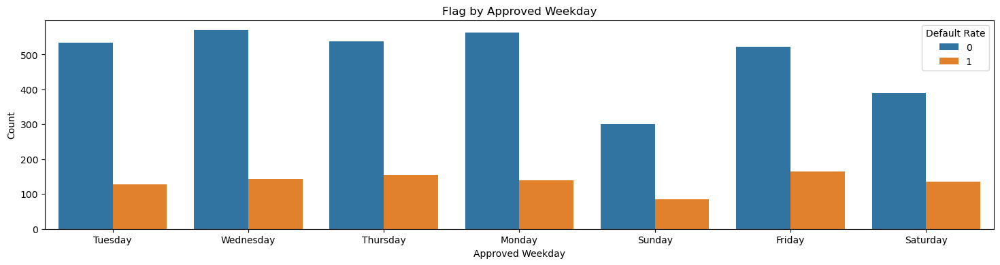

In [97]:
# Approved Weekday vs Default Rate (stacked count plot)
plt.figure(figsize=(18,4))
sns.countplot(x='approved_weekday', hue='flag', data=performance)
plt.title("Flag by Approved Weekday")
plt.xlabel("Approved Weekday")
plt.ylabel("Count")
plt.legend(title="Default Rate")
plt.show()

Insights from Grouped Bar Chart (Weekday Approvals vs Defaults)

1. Weekday vs Weekend Approvals  
   - Loan approvals are significantly *higher on weekdays, with Wednesday and Monday recording the highest counts.  
   - Approvals drop sharply on weekends, reflecting reduced loan activity during these days.  

2. Default Patterns Across Days  
   - Default counts remain relatively consistent across weekdays, without extreme spikes.  
   - This suggests that approval day alone is not a strong predictor of default, as defaults appear evenly distributed across the week.  

3. Weekend Defaults 
   - Weekends show lower absolute default counts, but this is aligned with the lower number of approvals overall, rather than a difference in borrower behavior.  

4. Friday Anomaly 
   - Friday exhibits a slightly higher proportion of defaults relative to total loans** compared to other weekdays.  
   - This could reflect unique borrower characteristics or loan products commonly approved on Fridays, and warrants further investigation.  

5. Overall Observations  
   - While there are differences in total loan approvals by day, default rates do not appear strongly tied to approval weekday.  
   - This implies that weekday of approval is not likely a key risk factor but may still interact with other variables (e.g., borrower type, loan amount, or product category).  


Strategic Implication
- Operationally, loan approvals are weekday-driven, peaking midweek.  
- From a risk perspective, weekday of approval does not meaningfully predict default, though the Friday anomaly may deserve a closer look.  
- This feature may not be highly predictive in isolation, but could provide marginal value when combined with other variables in modeling.  

# Stacked Bar Chart: Approved Weekday vs Flag

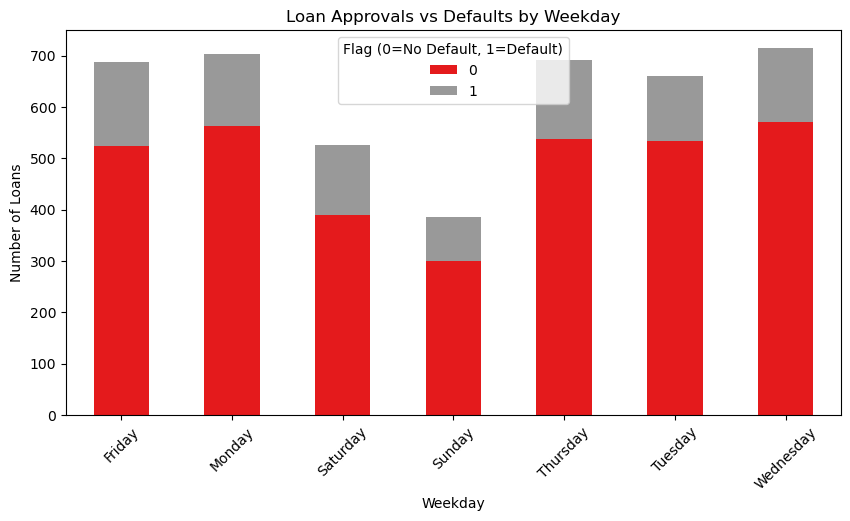

In [98]:
# I  grouped by weekday and flag
weekday_flag = performance.groupby(['approved_weekday', 'flag']).size().unstack()

# I plotted stacked bar chart
weekday_flag.plot(kind='bar', stacked=True, figsize=(10,5), colormap="Set1")

plt.title("Loan Approvals vs Defaults by Weekday")
plt.ylabel("Number of Loans")
plt.xlabel("Weekday")
plt.legend(title="Flag (0=No Default, 1=Default)")
plt.xticks(rotation=45)
plt.show()

Insights from Loan Approvals vs Defaults by Weekday

1. Overall Approval Volume  
   - Loan approvals are higher on weekdays compared to weekends.  
   - Monday, Wednesday, and Friday show the highest number of approvals.  
   - Sunday has the lowest loan approvals, indicating minimal weekend activity.  

2. Defaults Across Weekdays
   - Defaults (gray bars) are present across all days, but their absolute counts are lower compared to non-defaults.  
   - The proportion of defaults appears fairly consistent across weekdays, suggesting that day of approval is not a strong standalone predictor of default.  

3. Friday Pattern  
   - While total approvals are high on Friday, the proportion of defaults relative to total loans seems slightly higher compared to other weekdays.  
   - This anomaly may point to borrower profile or loan type differences specific to Friday approvals, requiring further investigation.  

4. Weekend Trends  
   - Both Saturday and Sunday have fewer approvals and defaults, likely due to reduced operational activity or borrower demand.  
   - However, the ratio of defaults to approvals on weekends appears similar to weekdays, reinforcing that day-of-week itself does not strongly influence repayment behavior.  

Strategic Implications
- Weekday focus: Loan approvals are concentrated on weekdays, reflecting business-hour lending operations. Staffing and resources can be optimized for peak days (Monday, Wednesday, Friday).  
- Risk Monitoring: Since defaults occur at a consistent rate across weekdays, approval weekday is unlikely to be a strong predictor in modeling. 
- Weekend opportunities: Low weekend activity may represent an untapped channel, especially if digital lending platforms are introduced to capture borrowers outside traditional workdays.  

# Defaults Vs Non-Defaults by Weekday

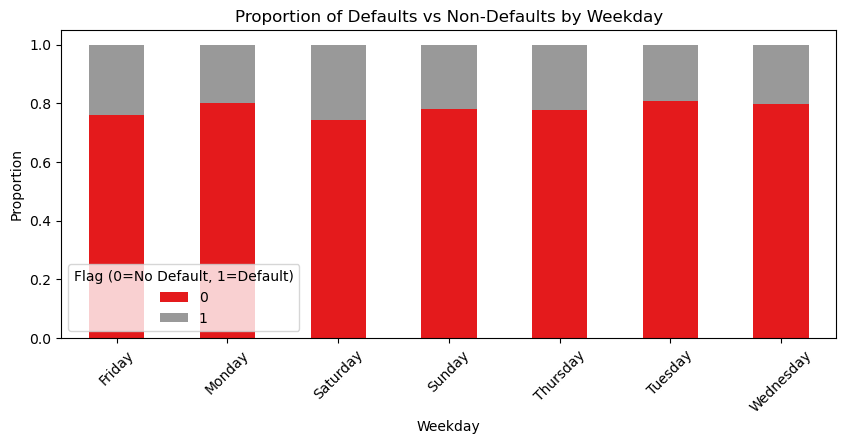

In [99]:
weekday_flag_pct = weekday_flag.div(weekday_flag.sum(axis=1), axis=0)

weekday_flag_pct.plot(kind='bar', stacked=True, figsize=(10,4), colormap="Set1")

plt.title("Proportion of Defaults vs Non-Defaults by Weekday")
plt.ylabel("Proportion")
plt.xlabel("Weekday")
plt.legend(title="Flag (0=No Default, 1=Default)")
plt.xticks(rotation=45)
plt.show()

Insights from Proportion of Defaults vs Non-Defaults by Weekday

1. Overall Default Rates  
   - Across all weekdays, the proportion of defaults (gray bars) remains relatively consistent.  
   - Default rates are around 20–25%, with no day showing an extreme deviation.  

2. Weekday Comparisons 
   - Monday and Tuesday show slightly higher proportions of defaults compared to other weekdays.  
   - Friday also shows a relatively elevated default proportion, aligning with earlier observations.  
   - Wednesday and Thursday fall closer to the average, showing balanced approval-to-default ratios.  

3. Weekend Observations  
   - Saturday and Sunday exhibit default proportions similar to weekdays, despite fewer total loan approvals overall.  
   - This confirms that *default risk is not strongly influenced by whether a loan was approved on a weekday or weekend.  

4. Key Takeaway  
   - There is no strong weekday effect on default likelihooD, defaults occur at similar rates across the week.  
   - The minor variations (e.g., slightly higher on Monday/Friday) could reflect borrower profiles or loan types processed on those days, but are not large enough to be standalone predictors.  

Strategic Implications
- Weekday is not a strong predictor of default risk, and may not add much standalone value in a predictive model.  
- From an operational perspective, loan approvals can remain spread across the week without significant impact on default risk.  

In [100]:
# I redefined the numerical columns
num_cols = ['loannumber', 'loanamount', 'totaldue',	'termdays', 'debt_to_income', 'estimated_income','loan_to_income_ratio', 'loan_to_term_ratio',
            'approved_hour']	

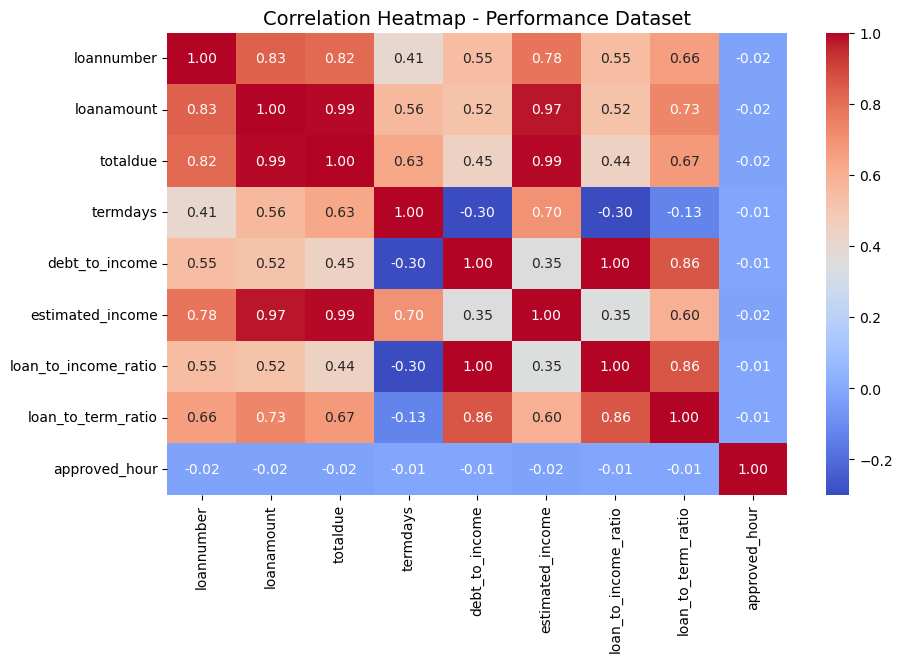

In [101]:
# I plotted a correlation Matrix

corr_matrix = performance[num_cols].corr()

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap - Performance Dataset", fontsize=14)
plt.show()

Insights from Correlation Heatmap (Performance Dataset)

1. High Correlations (Potential Multicollinearity)
   - Loan Amount vs Total Due (r = 0.99): Almost perfect correlation. Since total due is essentially loan amount plus interest, including both introduces redundancy. One should be dropped for modeling.  
   - Estimated Income vs Loan Amount (r = 0.97):* Strong link; higher-income borrowers tend to receive larger loans. These features overlap in explanatory power.  
   - Loan-to-Income Ratio vs Debt-to-Income Ratio (r = 0.86): These two ratios are closely related; retaining both may not add value. One can be removed or transformed into a composite metric.  
   - Loan Number vs Loan Amount (r = 0.83): Customers with more loans often borrow larger amounts, indicating repeat borrowers may secure progressively bigger loans.  
   - Loan Amount vs Loan-to-Term Ratio (r = 0.73): Larger loans correspond to higher repayment pressure per unit time, reinforcing the importance of monitoring short-term, high-value loans.  

2. Moderate Correlations
   - Term Days vs Estimated Income (r = 0.70): Longer loan terms are more common among higher-income borrowers, possibly reflecting confidence in repayment ability.  
   - Loan Number vs Estimated Income (r = 0.78): Frequent borrowers tend to have higher incomes, suggesting repeat lending may be skewed toward financially stable clients.  

3. Low / Negligible Correlations
   - Approved Hour (|r| < 0.03): Has virtually no linear relationship with loan size, income, or ratios. This feature likely adds little predictive value and can be deprioritized during feature selection.  

In [102]:
performance.sample(3)

,customerid,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_hour,approved_weekday,flag
4347,8a858f9d5668e3f10156768953330256,4,10000.0,11500.0,15,0.869,13226.15,0.756,625.0,13,Saturday,0
2254,8a858f8d56e0c3a70156fc952cf77e8c,13,10000.0,11500.0,15,0.869,13226.15,0.756,625.0,10,Tuesday,0
3155,8a858e495cef1ef1015cf3a804e535d7,2,10000.0,11500.0,15,0.869,13226.15,0.756,625.0,12,Friday,0


## PREVIOUS LOANS DATASET

## Previous Loans Dataset Description

| Column Name         | Description                                                                 |
|---------------------|-----------------------------------------------------------------------------|
| `customerid`        | Unique identifier for each customer                                         |
| `systemloanid`      | System-generated ID for each loan entry           |
| `loannumber`        | Number representing how many loans the customer has taken                   |
| `approveddate`      | Timestamp when the loan was approved                                        |
| `creationdate`      | Timestamp when the loan record was created in the system                    |
| `loanamount`        | The amount (principal) given to the customer                                |
| `totaldue`          | The total amount expected to be repaid (includes interest/fees)             |
| `termdays`          | Duration of the loan in days (e.g., 15 or 30)                               |
| `closeddate`        | The date the loan was officially closed or marked repaid                    |
| `referredby`        | Indicates referral info            |
| `firstduedate`      | Scheduled date for first repayment                                           |
| `firstrepaiddate`   | Actual date when the customer made their first repayment                    |

In [103]:
# I loaded dataset from provided URL
prevloans_url = "https://raw.githubusercontent.com/Oyeniran20/axia_cohort_8/refs/heads/main/trainprevloans.csv"
prevloans = pd.read_csv(prevloans_url)

In [104]:
# I previewed the first 5 rows

prevloans.head()

,customerid,systemloanid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,closeddate,referredby,firstduedate,firstrepaiddate
0,8a2a81a74ce8c05d014cfb32a0da1049,301682320,2,2016-08-15 18:22:40.000000,2016-08-15 17:22:32.000000,10000.0,13000.0,30,2016-09-01 16:06:48.000000,NaN,2016-09-14 00:00:00.000000,2016-09-01 15:51:43.000000
1,8a2a81a74ce8c05d014cfb32a0da1049,301883808,9,2017-04-28 18:39:07.000000,2017-04-28 17:38:53.000000,10000.0,13000.0,30,2017-05-28 14:44:49.000000,NaN,2017-05-30 00:00:00.000000,2017-05-26 00:00:00.000000
2,8a2a81a74ce8c05d014cfb32a0da1049,301831714,8,2017-03-05 10:56:25.000000,2017-03-05 09:56:19.000000,20000.0,23800.0,30,2017-04-26 22:18:56.000000,NaN,2017-04-04 00:00:00.000000,2017-04-26 22:03:47.000000
3,8a8588f35438fe12015444567666018e,301861541,5,2017-04-09 18:25:55.000000,2017-04-09 17:25:42.000000,10000.0,11500.0,15,2017-04-24 01:35:52.000000,NaN,2017-04-24 00:00:00.000000,2017-04-24 00:48:43.000000
4,8a85890754145ace015429211b513e16,301941754,2,2017-06-17 09:29:57.000000,2017-06-17 08:29:50.000000,10000.0,11500.0,15,2017-07-14 21:18:43.000000,NaN,2017-07-03 00:00:00.000000,2017-07-14 21:08:35.000000


In [105]:
prevloans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18183 entries, 0 to 18182
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   customerid       18183 non-null  object 
 1   systemloanid     18183 non-null  int64  
 2   loannumber       18183 non-null  int64  
 3   approveddate     18183 non-null  object 
 4   creationdate     18183 non-null  object 
 5   loanamount       18183 non-null  float64
 6   totaldue         18183 non-null  float64
 7   termdays         18183 non-null  int64  
 8   closeddate       18183 non-null  object 
 9   referredby       1026 non-null   object 
 10  firstduedate     18183 non-null  object 
 11  firstrepaiddate  18183 non-null  object 
dtypes: float64(2), int64(3), object(7)
memory usage: 1.7+ MB


Also, some of the columns are not properly assigned but I will deal with them later.

In [106]:
# I viewed summary statistics for numeric columns

prevloans.describe()

,systemloanid,loannumber,loanamount,totaldue,termdays
count,1.818300e+04,18183.000000,18183.000000,18183.000000,18183.000000
mean,3.018395e+08,4.189353,16501.237420,19573.202931,26.692790
std,9.367767e+04,3.249490,9320.547516,10454.245277,10.946556
min,3.016001e+08,1.000000,3000.000000,3450.000000,15.000000
25%,3.017766e+08,2.000000,10000.000000,11500.000000,15.000000
50%,3.018550e+08,3.000000,10000.000000,13000.000000,30.000000
75%,3.019197e+08,6.000000,20000.000000,24500.000000,30.000000
max,3.020003e+08,26.000000,60000.000000,68100.000000,90.000000


The table displays descriptive statistics for numeric columns in the prevloans dataset.

Key Insights:
Loan Number:
   - Range: 1 to 26 previous loans per customer.
   - Median: 3 loans, meaning at least half of the borrowers had 3 or fewer past loans.
   - High standard deviation (3.25) indicates variability in borrowing frequency.

Loan Amount:
   - Range: 3,000 to 60,000.
   - Median: 10,000, with the 75th percentile at 20,000, indicating a right-skewed distribution with some large loans.
   - Standard deviation (~9,320) suggests substantial variation in loan sizes.

Total Due:
   - Closely tracks loan amount; range is 3,450 to 68,100.
   - The near-linear relationship with loanamount suggests this includes principal + interest.

Term Days:
   - Range: 15 to 90 days.
   - Most loans are short-term, with the median at 30 days.
   - 25th percentile at 15 days shows a significant proportion of very short-term loans.

In [107]:
# I checked for missing values

prevloans.isna().sum().sort_values(ascending = False)

referredby         17157
customerid             0
systemloanid           0
loannumber             0
approveddate           0
creationdate           0
loanamount             0
totaldue               0
termdays               0
closeddate             0
firstduedate           0
firstrepaiddate        0
dtype: int64

The referredby columns has a hugh number of missing values and the othet columns have none.

In [108]:
# I checked for the percentage of missing values

prevloans.isna().sum().sort_values(ascending = False) / len (prevloans) * 100

referredby         94.357367
customerid          0.000000
systemloanid        0.000000
loannumber          0.000000
approveddate        0.000000
creationdate        0.000000
loanamount          0.000000
totaldue            0.000000
termdays            0.000000
closeddate          0.000000
firstduedate        0.000000
firstrepaiddate     0.000000
dtype: float64

The percentage of missing values in the referred column is 94%. Therefore, I will drop it.

In [109]:
# I dropped some columns

prevloans.drop(['referredby', 'systemloanid'], axis=1, inplace=True)

I dropped:
- 'systemloanid': System-generated and not meaningful for analysis
- 'referredby': Has excessive missing values (mostly NaN), not useful for modeling

In [110]:
# I previewed the first 3 rows

prevloans.sample(3)

,customerid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,closeddate,firstduedate,firstrepaiddate
7289,8a858e5856b7840c0156c298b5d35422,13,2017-02-28 13:43:55.000000,2017-02-28 12:43:34.000000,40000.0,44800.0,30,2017-03-22 23:15:55.000000,2017-03-30 00:00:00.000000,2017-03-22 23:00:44.000000
7733,8a858ee755a0c84a0155b7028fea49b6,2,2016-08-11 19:20:13.000000,2016-08-11 18:20:07.000000,10000.0,11500.0,15,2016-08-25 12:51:27.000000,2016-08-26 00:00:00.000000,2016-08-25 12:36:24.000000
15907,8a858e5856b7840c0156c183c7966a3a,7,2017-03-16 15:17:54.000000,2017-03-16 14:16:40.000000,40000.0,47600.0,60,2017-05-08 10:02:53.000000,2017-04-17 00:00:00.000000,2017-04-18 09:07:10.000000


In [111]:
# I converted all datetime-like columns using `errors="coerce"` so bad or missing values become NaT.

date_cols = [
    "approveddate","creationdate","closeddate",
    "firstduedate","firstrepaiddate"
]
for date in date_cols:
    if date in prevloans.columns:
        prevloans[date] = pd.to_datetime(prevloans[date], errors="coerce")

In [112]:
# I extracted clean date in YY/MM/DD format
prevloans['approved_day'] = prevloans['approveddate'].dt.strftime('%y/%m/%d')
prevloans['creation_day'] = prevloans['creationdate'].dt.strftime('%y/%m/%d')
prevloans['closeddate'] = prevloans['closeddate'].dt.strftime('%y/%m/%d')
prevloans['firstduedate'] = prevloans['firstduedate'].dt.strftime('%y/%m/%d')
prevloans['firstrepaiddate'] = prevloans['firstrepaiddate'].dt.strftime('%y/%m/%d')

In [113]:
# I created a feature that shows the number of loans each customer has had
prevloans['total_loans'] = prevloans.groupby('customerid')['loannumber'].transform('count')

In [114]:
# I created the is_default column in the prevloans dataset to serve as an intermediate feature for calculating the credit_score
prevloans['on_time_flag'] = (prevloans['firstrepaiddate'] <= prevloans['firstduedate']).astype(int)

In [115]:
# I previewed the dataset
prevloans.sample(2)

,customerid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,closeddate,firstduedate,firstrepaiddate,approved_day,creation_day,total_loans,on_time_flag
2485,8a858ee75a1db75f015a1df3eb031cf7,3,2017-04-30 09:24:20,2017-04-30 08:24:00,10000.0,11500.0,15,17/05/14,17/05/15,17/05/14,17/04/30,17/04/30,4,1
7647,8a858f585a6bfa1d015a6f8b2d582fb9,5,2017-06-10 12:22:35,2017-06-10 11:21:28,10000.0,13000.0,30,17/07/16,17/07/10,17/07/16,17/06/10,17/06/10,5,0


In [116]:
# I dropped original datetime and text target columns after extracting useful features.
prevloans.drop(['approveddate', 'creationdate'], axis=1, inplace=True)

In [117]:
# I engineered the interest/fees
prevloans["interest_amount"] = prevloans["totaldue"] - prevloans["loanamount"]

In [118]:
# I engineered the daily repayment amount
prevloans["daily_repayment_amount"] = prevloans["totaldue"] / prevloans["termdays"].replace({0: np.nan})

In [119]:
# I merged estimated_income into prevloans
prevloans = prevloans.merge(
    performance[["customerid", "estimated_income"]],
    on="customerid",
    how="left"
)

In [120]:
# I converted these columns to datetime to extract information

prevloans["firstrepaiddate"] = pd.to_datetime(prevloans["firstrepaiddate"], errors="coerce")
prevloans["firstduedate"] = pd.to_datetime(prevloans["firstduedate"], errors="coerce")

In [121]:
# I created a repayment delay column

prevloans["repayment_delay_days_signed"] = (
    prevloans["firstrepaiddate"] - prevloans["firstduedate"]
).dt.days

In [122]:
# I clipped negative delays to zero (early payments counted as zero delay)
prevloans["repayment_delay_days"] = prevloans["repayment_delay_days_signed"].clip(lower=0)

In [123]:
# I previewed the result
prevloans[["firstduedate", "firstrepaiddate", "repayment_delay_days_signed", "repayment_delay_days"]].head()

,firstduedate,firstrepaiddate,repayment_delay_days_signed,repayment_delay_days
0,2014-09-16,2001-09-16,-4748,0
1,2030-05-17,2026-05-17,-1461,0
2,2004-04-17,2026-04-17,8035,8035
3,2024-04-17,2024-04-17,0,0
4,2003-07-17,2014-07-17,4018,4018


I created 'repayment_delay_days' to quantify how many days a loan repayment was late.

First, I ensured that 'firstrepaiddate' and 'firstduedate' were in proper datetime format.Then, I calculated the difference ('firstrepaiddate - firstduedate') in days, which can be:
- Positive if the repayment was late.
- Negative if the repayment was early.

I stored this as 'repayment_delay_days_signed' for full transparency.

Finally, I clipped all negative values to zero to form 'repayment_delay_days', because for my analysis, I treat early repayments as having zero delay rather than negative delay.
This feature is important for assessing borrower behavior and is used later in the credit score calculation to penalize late repayments.

In [124]:
# I developed a simple credit score metric (0–600)

# I ensured required columns are numeric
prevloans["on_time_flag"] = pd.to_numeric(prevloans["on_time_flag"], errors="coerce").fillna(0)
prevloans["repayment_delay_days"] = pd.to_numeric(prevloans["repayment_delay_days"], errors="coerce").fillna(0)

In [125]:
# I estimated smooth penalty for delay
prevloans["delay_smooth"] = 1 / (1 + prevloans["repayment_delay_days"])

In [126]:
# I weighted thecomponents, scaled to 600 max
prevloans["credit_score"] = (
    ((1 - prevloans["on_time_flag"]) * 0.60) +     # repayment success weight
    (prevloans["delay_smooth"] * 0.40)           # delay penalty weight
) * 600                                          # scale to 600

In [127]:
# I cliped to range [0, 600]
prevloans["credit_score"] = prevloans["credit_score"].clip(lower=0, upper=600)

I constructed a simple, interpretable credit score to summarize repayment behavior at the loan level. My goal is to reward non-defaults and penalize late repayments with a smooth decay (so 1 day late is not as bad as 30 days late).

Design choices I made:
- I used (1 - on_time_flag) as a repayment success signal (1 = not defaulted, 0 = defaulted), weighted at 60%.
- I transformed repayment_delay_days with 1 / (1 + delay) so that: On-time (delay = 0) maps to 1.0 (best). As delay grows, the value smoothly decays toward 0. This avoids hard thresholds and reduces sensitivity to outliers.
- I weighted the delay component at 40%.
- I clipped the final score to the range [0, 600] and handled missing values.

Interpretation:
- Scores near 600: no default and on-time/early repayment.
- Scores around 360: no default but significant delay.
- Scores below 240: defaults and/or extreme delays.

I will later aggregate these scores by 'customerid' (e.g., mean/max) to capture historical behavior.

In [128]:
# I previewed it
prevloans[["customerid", "on_time_flag","repayment_delay_days", "delay_smooth", "credit_score"]].head()

,customerid,on_time_flag,repayment_delay_days,delay_smooth,credit_score
0,8a2a81a74ce8c05d014cfb32a0da1049,1,0,1.000000,240.000000
1,8a2a81a74ce8c05d014cfb32a0da1049,1,0,1.000000,240.000000
2,8a2a81a74ce8c05d014cfb32a0da1049,0,8035,0.000124,360.029866
3,8a8588f35438fe12015444567666018e,1,0,1.000000,240.000000
4,8a85890754145ace015429211b513e16,0,4018,0.000249,360.059716


I created the on_time_flag column in the prevloans dataset to serve as an intermediate feature for calculating the credit_score.

The  on_time_flag identifies whether a specific loan was not repaid on time or in full and this information is essential for the credit scoring formula, which rewards non-defaults and penalizes defaults when assigning a score.
By deriving on_time_flag directly in prevloans, I can avoid repeatedly merging target information from the performance dataset during the feature engineering stage.

Although on_time_flag relates to the target variable in the performance dataset, I am not using it directly as a feature for modeling but only as a temporary input for computing credit_score. After generating credit_score, I will drop on_time_flag from the dataset before merging into the final modeling dataframe to prevent any leakage of target information into training.

In [129]:
# I dropped some columns I used to engineer the credit score from prevloans
prevloans = prevloans.drop(columns=["on_time_flag", "repayment_delay_days",	"delay_smooth", "repayment_delay_days_signed"], errors="ignore")

In [130]:
# I previewed the columns

prevloans.sample(3)

,customerid,loannumber,loanamount,totaldue,termdays,closeddate,firstduedate,firstrepaiddate,approved_day,creation_day,total_loans,interest_amount,daily_repayment_amount,estimated_income,credit_score
12992,8a858fd55c45ba15015c46be3e0d33f3,2,10000.0,13000.0,30,17/07/12,2024-07-17,2012-07-17,17/06/22,17/06/22,2,3000.0,433.333333,16901.3000,240.000000
1005,8a858ece586263020158696870092f98,1,10000.0,13000.0,30,17/06/05,2002-06-17,2005-06-17,17/05/03,17/05/03,1,3000.0,433.333333,13226.1500,360.218778
18061,8a858ece5862630201586465cc5f32eb,4,20000.0,21900.0,15,16/12/09,2009-12-16,2009-12-16,16/11/24,16/11/24,16,1900.0,1460.000000,55126.0499,240.000000


## Aggregation

In [131]:
agg_prevloans = prevloans.groupby('customerid', dropna=False).agg(
    total_loans=('loannumber', 'count'),                      # Borrowing history length
    avg_interest_amount=('interest_amount', 'mean'),          # Average interest burden
    max_interest_amount=('interest_amount', 'max'),           # Maximum interest burden
    avg_daily_repayment_amount=('daily_repayment_amount', 'mean'),  # Avg repayment pressure
    max_daily_repayment_amount=('daily_repayment_amount', 'max'),   # Max repayment pressure
    last_closeddate=('closeddate', 'max'),                     # For optional recency calculation
    avg_credit_score=('credit_score', 'mean'),   # Average credit score
    max_credit_score=('credit_score', 'max'),  # Best historical credit score
).reset_index()


Why I performed aggregation here:
- The prevloans dataset contains multiple rows per customer (one row per past loan).
- For modeling purposes, I need one record per customer so that it can be merged with the performance dataset, which also has one row per loan/customer combination.
- Aggregating transforms raw per-loan details into historical summary metrics that describe a borrower's past behavior.

What I aggregated:
- total_loans → Total number of past loans per customer (borrowing history length).
- avg_interest_amount / max_interest_amount → Measures of historical interest burden.
- avg_daily_repayment_amount /max_daily_repayment_amount → Measures of historical repayment pressure.
- last_closeddate → Most recent loan closure date, for potential use in recency calculations.

Benefits of this approach:
- Reduces data dimensionality by replacing multiple raw records with meaningful summary features.
- Captures long-term behavior patterns rather than isolated loan instances.
- Makes the dataset merge-ready while keeping only unique, high-signal features.

## Merging

I merged the three datasets to create the final model-ready dataframe.

Order of merge:
- Started with performance as the base because it contains the target variable.
- Merged in agg_prevloans on customerid (customer loan history).
- Merged in demographics on customerid (customer profile attributes).

Why this order matters:
- Ensured that every row in the final dataset corresponds to a customer in the performance dataset.
- Left joins preserve all performance records, even for customers with no previous loan data or missing demographics.

In [132]:
# I merged the aggregated previous loans into performance
final_df = performance.merge(agg_prevloans, on="customerid", how="left")

In [133]:
# I previewed it
final_df.sample(3)

,customerid,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_hour,approved_weekday,flag,total_loans,avg_interest_amount,max_interest_amount,avg_daily_repayment_amount,max_daily_repayment_amount,last_closeddate,avg_credit_score,max_credit_score
1482,8a858e625c8d993a015c9334d1f96fba,3,10000.0,13000.0,30,0.769,16901.3000,0.592,322.581,7,Wednesday,1,2.0,3000.000000,3000.0,433.333333,433.333333,17/07/26,120.023603,240.0
792,8a858e0b5cfa2028015d099b789b229f,2,10000.0,11500.0,15,0.869,13226.1500,0.756,625.000,16,Saturday,0,1.0,1500.000000,1500.0,766.666667,766.666667,17/07/11,240.000000,240.0
1222,8a858e0d59bbb9050159c0c33dfe4f9d,7,30000.0,39000.0,60,0.769,50701.2999,0.592,491.803,13,Monday,0,6.0,3383.333333,4500.0,676.666667,816.666667,17/07/03,240.000000,240.0


In [134]:
# I merged with demographics
final_df = final_df.merge(demographics, on="customerid", how="left")

In [135]:
# I previewed the dataset
final_df.sample(3)

,customerid,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_hour,...,avg_credit_score,max_credit_score,bank_account_type,bank_name_clients,employment_status_clients,age,age_group,city,state,log_age
1989,8a8589a7545186b1015468c4ca294b60,4,10000.0,13000.0,30,0.769,16901.30,0.592,322.581,8,...,440.261771,600.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2454,8a858f7958b0a4a80158b4e352b6367b,8,20000.0,23000.0,30,0.870,26451.15,0.756,645.161,10,...,257.236279,360.653951,Savings,Access Bank,Permanent,43.0,Adult,Unknown,Lagos,3.784190
2681,8a858ff35acdd593015ad12db5593535,8,30000.0,34500.0,30,0.870,39676.15,0.756,967.742,18,...,171.448197,240.000000,Savings,GT Bank,Permanent,37.0,Adult,Ikeja,Lagos,3.637586


In [136]:
# I checked for the columns available
final_df.columns.tolist()

['customerid',
 'loannumber',
 'loanamount',
 'totaldue',
 'termdays',
 'debt_to_income',
 'estimated_income',
 'loan_to_income_ratio',
 'loan_to_term_ratio',
 'approved_hour',
 'approved_weekday',
 'flag',
 'total_loans',
 'avg_interest_amount',
 'max_interest_amount',
 'avg_daily_repayment_amount',
 'max_daily_repayment_amount',
 'last_closeddate',
 'avg_credit_score',
 'max_credit_score',
 'bank_account_type',
 'bank_name_clients',
 'employment_status_clients',
 'age',
 'age_group',
 'city',
 'state',
 'log_age']

In [137]:
# I checked for missing values
final_df.isna().sum().sort_values(ascending=False)

log_age                       1132
state                         1132
city                          1132
age_group                     1132
age                           1132
employment_status_clients     1132
bank_name_clients             1132
bank_account_type             1132
avg_daily_repayment_amount       9
max_credit_score                 9
avg_credit_score                 9
last_closeddate                  9
max_daily_repayment_amount       9
max_interest_amount              9
avg_interest_amount              9
total_loans                      9
loannumber                       0
flag                             0
approved_weekday                 0
approved_hour                    0
loan_to_term_ratio               0
loan_to_income_ratio             0
estimated_income                 0
debt_to_income                   0
termdays                         0
totaldue                         0
loanamount                       0
customerid                       0
dtype: int64

In [138]:
# I checked for missing values percentage
(final_df.isna().sum().sort_values(ascending=False) / len(final_df)) * 100

log_age                       25.915751
state                         25.915751
city                          25.915751
age_group                     25.915751
age                           25.915751
employment_status_clients     25.915751
bank_name_clients             25.915751
bank_account_type             25.915751
avg_daily_repayment_amount     0.206044
max_credit_score               0.206044
avg_credit_score               0.206044
last_closeddate                0.206044
max_daily_repayment_amount     0.206044
max_interest_amount            0.206044
avg_interest_amount            0.206044
total_loans                    0.206044
loannumber                     0.000000
flag                           0.000000
approved_weekday               0.000000
approved_hour                  0.000000
loan_to_term_ratio             0.000000
loan_to_income_ratio           0.000000
estimated_income               0.000000
debt_to_income                 0.000000
termdays                       0.000000


After merging the performance dataset with aggregated features from prevloans, I observed that:
- 9 rows have missing values in all aggregated previous-loan features:
  - max_interest_amount
  - avg_interest_amount
  - avg_daily_repayment_amount
  - max_daily_repayment_amount
  - total_loans
  - last_closeddate
  - avg_credit_score
  - max_credit_score
  
- All other columns from performance (e.g., loanamount, totaldue, termdays) have no missing values.

Reason for these missing values:
- These 9 customers do not appear in the prevloans dataset at all, meaning they have no historical loans to aggregate.
- As a result, when the datasets were merged, the aggregated columns for these customers became NaN.

How this would be handled:
- Numeric aggregates: Filled missing values with 0 (e.g., total_loans = 0 for no loan history).
- Date fields: Kept as NaT 
- Credit score: Assigned 0 if no history exists.

Key point:
This is not a data error but an expected outcome when merging with an aggregated dataset, it simply reflects customers without prior borrowing history.

In [139]:
# I reassgined the categorical columns to be filled
cat_cols_to_fill = ['state', 'city', 'age_group', 'employment_status_clients', 'bank_name_clients', 'bank_account_type']             

In [140]:
for col in cat_cols_to_fill:
    final_df[col] = final_df[col].astype(str).fillna("Unknown")

In [141]:
# I reassgined the numerical columns to be filled
num_cols_to_fill = [
    'age',
    'log_age',
    'max_interest_amount',
    'avg_interest_amount',
    'max_daily_repayment_amount',
    'avg_daily_repayment_amount',
    'total_loans',
    'avg_credit_score',
    'max_credit_score'
]

In [142]:
# I fill NaNs with 0 for these columns
final_df[num_cols_to_fill] = final_df[num_cols_to_fill].fillna(0)

In [143]:
final_df.sample(3)

,customerid,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_hour,...,avg_credit_score,max_credit_score,bank_account_type,bank_name_clients,employment_status_clients,age,age_group,city,state,log_age
1880,8a858e165a47b2fd015a4aff578837c6,6,30000.0,34500.0,30,0.870,39676.15,0.756,967.742,16,...,144.010565,240.000000,Savings,UBA,Permanent,42.0,Adult,Offa,Kwara,3.761200
3491,8a858e8e5cc54eb9015cc59a217a246a,2,10000.0,13000.0,30,0.769,16901.30,0.592,322.581,9,...,240.000000,240.000000,Savings,First Bank,Permanent,40.0,Adult,Falomo,Lagos,3.713572
1153,8a858f565c3acb9d015c3b9369bb571a,2,10000.0,11500.0,15,0.869,13226.15,0.756,625.000,7,...,0.026368,0.026368,Savings,Zenith Bank,Unemployed,34.0,Young Adult,Uyo,Akwa Ibom,3.555348


From the above, some of the columns still have nan and I have to treat it.

In [144]:
for col in cat_cols_to_fill:
    # I converted to string, stripped spaces, replacedempty with NaN
    final_df[col] = final_df[col].astype(str).str.strip().replace(['', 'nan', 'NaN'], np.nan)
    # Filled NaN with "Unknown"
    final_df[col] = final_df[col].fillna('Unknown')

In [145]:
# I previewed the dataset
final_df.sample(3)

,customerid,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_hour,...,avg_credit_score,max_credit_score,bank_account_type,bank_name_clients,employment_status_clients,age,age_group,city,state,log_age
4184,8a858e8e58f6d66f0158ff063d6d38cd,2,10000.0,13000.0,30,0.769,16901.300,0.592,322.581,17,...,240.000000,240.000000,Savings,Diamond Bank,Permanent,39.0,Adult,Bar jirgi summa,Plateau,3.688879
1207,8a858ede5ca210f0015ca32170645e53,3,10000.0,11125.0,15,0.899,12377.675,0.808,625.000,5,...,120.015703,240.000000,Unknown,Unknown,Unknown,0.0,Unknown,Unknown,Unknown,0.000000
2265,8a8588ae53f1cb7c01540e8cf9f66b81,2,10000.0,11500.0,15,0.869,13226.150,0.756,625.000,6,...,360.655738,360.655738,Other,GT Bank,Permanent,41.0,Adult,Shagamu,Ogun,3.737670


In [146]:
final_df.shape

(4368, 28)

In [147]:
# I checked for the columns available
final_df.columns.tolist()

['customerid',
 'loannumber',
 'loanamount',
 'totaldue',
 'termdays',
 'debt_to_income',
 'estimated_income',
 'loan_to_income_ratio',
 'loan_to_term_ratio',
 'approved_hour',
 'approved_weekday',
 'flag',
 'total_loans',
 'avg_interest_amount',
 'max_interest_amount',
 'avg_daily_repayment_amount',
 'max_daily_repayment_amount',
 'last_closeddate',
 'avg_credit_score',
 'max_credit_score',
 'bank_account_type',
 'bank_name_clients',
 'employment_status_clients',
 'age',
 'age_group',
 'city',
 'state',
 'log_age']

In [148]:
# I dropped some columns
drop_cols = [
    'customerid',         # Unique identifier, no predictive power
    'last_closeddate',    # Date column - not engineered yet
    'age_group',          # Redundant: same info as 'age'
    'city',               # High cardinality
    'state'               # High cardinality
]

final_df = final_df.drop(columns=drop_cols, errors='ignore')

I dropped the following columns from the dataset:
- customerid: Unique identifier that provides no predictive value for the model.
- last_closeddate: A date column that has not been transformed into numerical features. Keeping it as raw date/time would be uninformative
- age_group: Perfectly correlated with age and log_age. To avoid redundancy and multicollinearity, I kept only the continuous version (age) and its log transformation (log_age).
- city and state: High-cardinality categorical features that could introduce sparsity and noise in one-hot encoding. These can be reintroduced later if engineered into meaningful groupings or frequency counts.

Dropping these columns reduces dimensionality, prevents multicollinearity, and improves data quality for model training.

In [149]:
# I previewed the columns
final_df.head()

,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_hour,approved_weekday,...,max_interest_amount,avg_daily_repayment_amount,max_daily_repayment_amount,avg_credit_score,max_credit_score,bank_account_type,bank_name_clients,employment_status_clients,age,log_age
0,12,30000.0,34500.0,30,0.870,39676.1500,0.756,967.742,8,Tuesday,...,4500.0,736.060606,1150.000000,229.116638,360.081246,Other,Diamond Bank,Permanent,53.0,3.988984
1,2,15000.0,17250.0,30,0.870,19838.6500,0.756,483.871,17,Wednesday,...,0.0,0.000000,0.000000,0.000000,0.000000,Savings,GT Bank,Permanent,40.0,3.713572
2,7,20000.0,22250.0,15,0.899,24754.2375,0.808,1250.000,14,Thursday,...,3000.0,711.111111,766.666667,180.062208,360.315789,Other,EcoBank,Permanent,41.0,3.737670
3,3,10000.0,11500.0,15,0.869,13226.1500,0.756,625.000,19,Thursday,...,3000.0,600.000000,766.666667,360.111938,360.164159,Savings,First Bank,Permanent,48.0,3.891820
4,9,40000.0,44000.0,30,0.909,48401.0999,0.826,1290.323,23,Monday,...,9000.0,622.500000,793.333333,240.000000,240.000000,Other,GT Bank,Permanent,39.0,3.688879


In [150]:
# I rechecked the dataset
final_df.shape

(4368, 23)

In [151]:
# I rechecked the columns 
final_df.columns.tolist()

['loannumber',
 'loanamount',
 'totaldue',
 'termdays',
 'debt_to_income',
 'estimated_income',
 'loan_to_income_ratio',
 'loan_to_term_ratio',
 'approved_hour',
 'approved_weekday',
 'flag',
 'total_loans',
 'avg_interest_amount',
 'max_interest_amount',
 'avg_daily_repayment_amount',
 'max_daily_repayment_amount',
 'avg_credit_score',
 'max_credit_score',
 'bank_account_type',
 'bank_name_clients',
 'employment_status_clients',
 'age',
 'log_age']

In [152]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4368 entries, 0 to 4367
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   loannumber                  4368 non-null   int64  
 1   loanamount                  4368 non-null   float64
 2   totaldue                    4368 non-null   float64
 3   termdays                    4368 non-null   int64  
 4   debt_to_income              4368 non-null   float64
 5   estimated_income            4368 non-null   float64
 6   loan_to_income_ratio        4368 non-null   float64
 7   loan_to_term_ratio          4368 non-null   float64
 8   approved_hour               4368 non-null   int32  
 9   approved_weekday            4368 non-null   object 
 10  flag                        4368 non-null   int64  
 11  total_loans                 4368 non-null   float64
 12  avg_interest_amount         4368 non-null   float64
 13  max_interest_amount         4368 

In [153]:
# I rounded up the numbers in the columns

final_df = final_df.round({
    'loannumber': 3,
    'loanamount': 3,
    'debt_to_income': 3,
    'loan_to_income_ratio': 3,
    'total_loans':3,
    'avg_interest_amount': 3,
    'max_interest_amount': 3,
    'avg_daily_repayment_amount': 3,
    'max_daily_repayment_amount' : 3,
    'max_credit_score' : 3,
    'avg_credit_score': 3,
    'loan_to_term_ratio': 3,
    'estimated_income': 4
})

In [154]:
# I dropped more columns
final_df = final_df.drop(columns=["log_age"])

In [155]:
# I rechecked the dataset
final_df.sample(3)

,loannumber,loanamount,totaldue,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_hour,approved_weekday,...,avg_interest_amount,max_interest_amount,avg_daily_repayment_amount,max_daily_repayment_amount,avg_credit_score,max_credit_score,bank_account_type,bank_name_clients,employment_status_clients,age
3238,2,10000.0,11500.0,15,0.869,13226.15,0.756,625.000,10,Sunday,...,1500.0,1500.0,766.667,766.667,0.037,0.037,Savings,GT Bank,Permanent,37.0
50,3,10000.0,13000.0,30,0.769,16901.30,0.592,322.581,11,Tuesday,...,2250.0,3000.0,600.000,766.667,240.000,240.000,Savings,Zenith Bank,Permanent,39.0
573,3,10000.0,13000.0,30,0.769,16901.30,0.592,322.581,7,Monday,...,3000.0,3000.0,433.333,433.333,240.000,240.000,Savings,GT Bank,Permanent,42.0


In [156]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4368 entries, 0 to 4367
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   loannumber                  4368 non-null   int64  
 1   loanamount                  4368 non-null   float64
 2   totaldue                    4368 non-null   float64
 3   termdays                    4368 non-null   int64  
 4   debt_to_income              4368 non-null   float64
 5   estimated_income            4368 non-null   float64
 6   loan_to_income_ratio        4368 non-null   float64
 7   loan_to_term_ratio          4368 non-null   float64
 8   approved_hour               4368 non-null   int32  
 9   approved_weekday            4368 non-null   object 
 10  flag                        4368 non-null   int64  
 11  total_loans                 4368 non-null   float64
 12  avg_interest_amount         4368 non-null   float64
 13  max_interest_amount         4368 

## VISUALIZATION OF THE FINAL DATAFRAME

In [157]:
# I reassigned my columns

num_cols = final_df.select_dtypes(include = ['int64', 'float64', 'int32']).columns.tolist()
num_cols = [col for col in num_cols if col not in ['flag']]

cat_cols = final_df.select_dtypes(include = ['object']).columns.tolist()
cat_cols = [col for col in cat_cols if col not in ['bank_name_clients', 'employment_status_clients']]

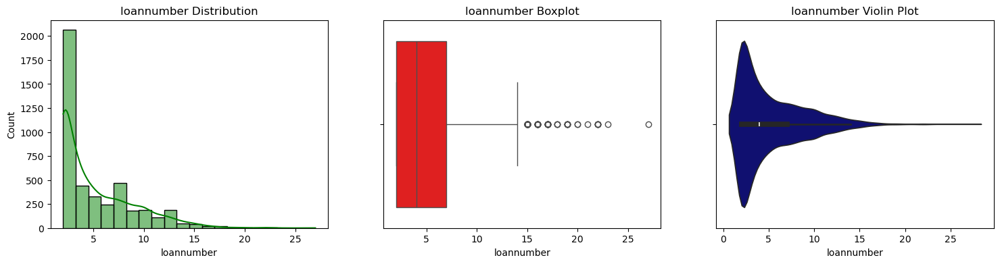

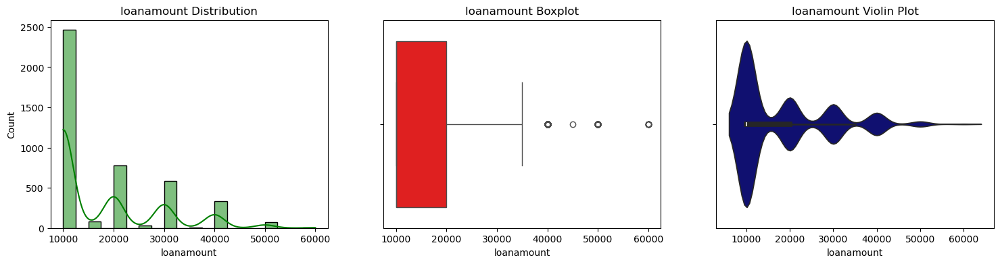

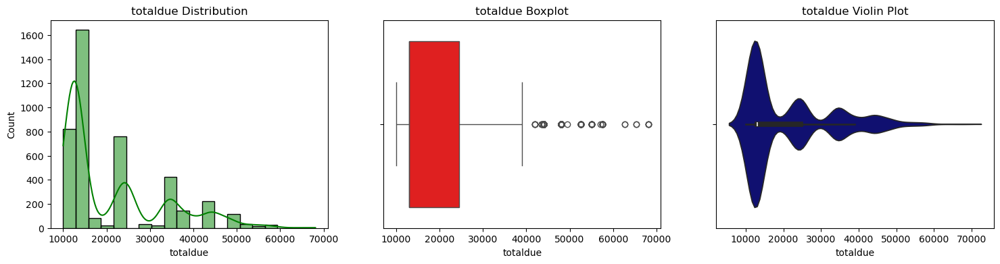

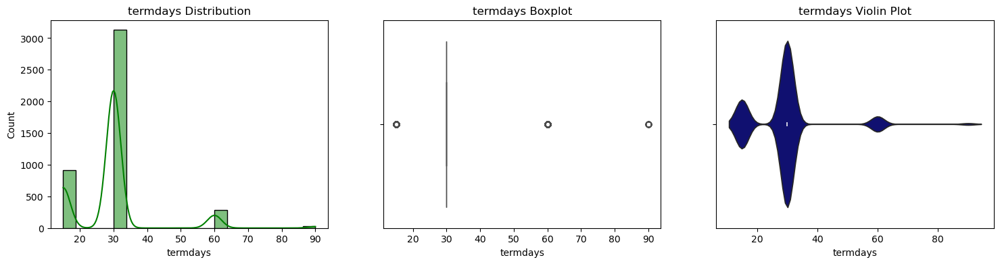

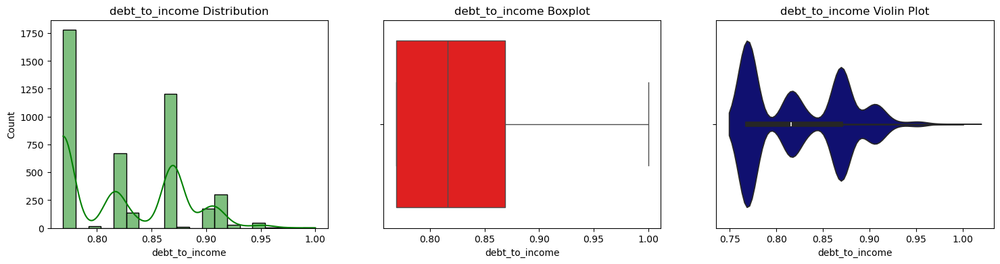

...

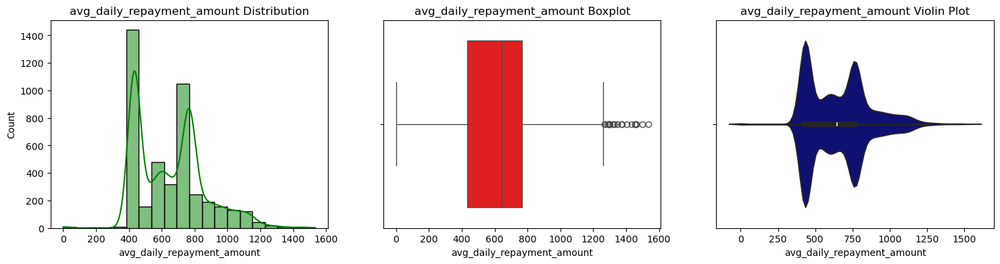

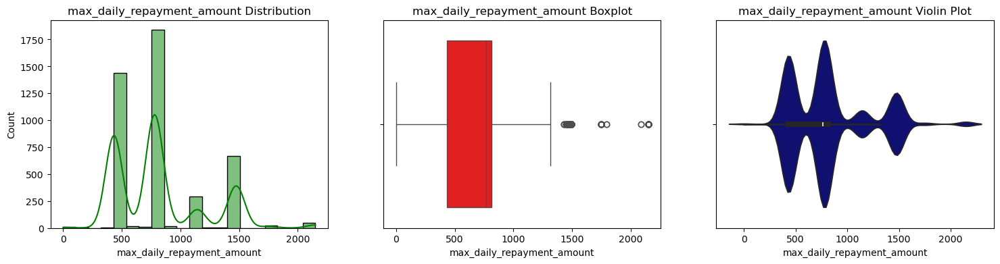

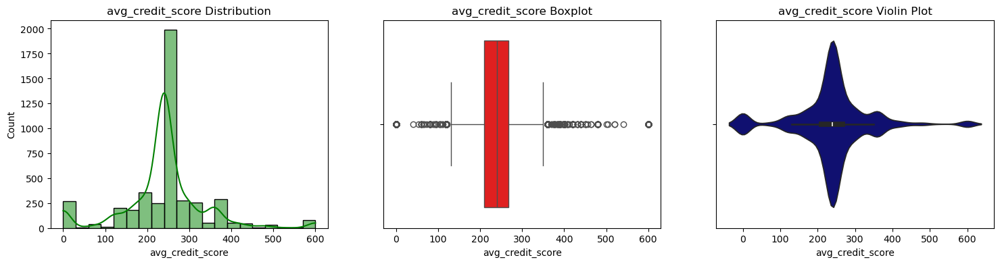

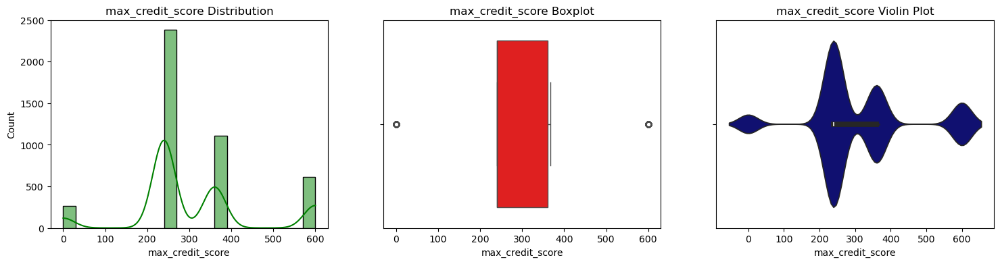

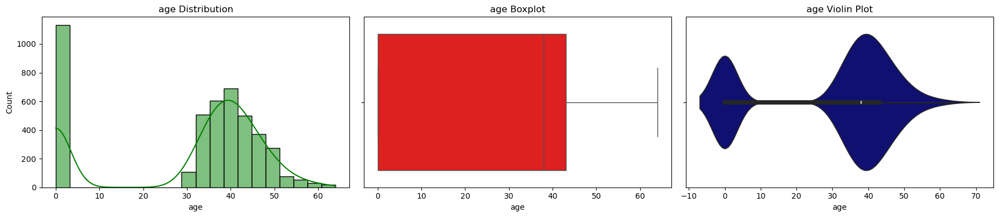

In [158]:
# I looped through numerical columns
for col in num_cols:
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))
    
    # for histogram
    sns.histplot(final_df[col], kde=True, bins=20, color='green', ax=axes[0])
    axes[0].set_title(f'{col} Distribution')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('Count')

    # for boxplot
    sns.boxplot(x=final_df[col], color='red', ax=axes[1])
    axes[1].set_title(f'{col} Boxplot')
    axes[1].set_xlabel(col)

    # for violinplot
    sns.violinplot(x=final_df[col], color = 'navy', ax=axes[2])
    axes[2].set_title(f'{col} Violin Plot')
    axes[2].set_xlabel(col)
    
plt.tight_layout()
plt.show()

Insights from Numeric Feature Distributions

1. Loan Amount & Total Due
   - Both are right-skewed with several extreme high-value outliers.  
   - Most customers take small to medium loans, but a minority borrow very large amounts, leading to heavy repayment burdens.  
   - Implication:High-value loans are higher risk and may drive defaults. Skewness may require transformation (e.g., log-scaling). Since loanamount and totaldue are almost perfectly correlated, only one should be retained for modeling.  

2. Loan Term (termdays)
   - Loan durations cluster around standard periods (30, 60, 90 days) with minimal outliers.  
   - Implication: Loan term is a structured product feature that directly affects repayment pressure. Shorter terms may increase default likelihood.  

3. Debt-to-Income (DTI)
   - Most borrowers maintain reasonable ratios, but outliers >1.0 indicate debt greater than income.  
   - Implication: High DTI is a strong red flag for default risk and is one of the most critical financial stress indicators.  

4. Estimated Income
   - Strongly right-skewed with a few extremely high-income cases (possible outliers or misreporting).  
   - Implication: Key repayment capacity measure, but outliers should be handled carefully. May benefit from transformation or capping.  

5. Loan-to-Income & Loan-to-Term Ratios
   - Right-skewed; most values <1.0, but some extreme cases (>3.0) indicate high stress borrowing.  
   - Implication: Strong predictors of default—highlight when loan amounts are disproportionate to income or repayment duration.  

6. Interest Amount Features
   - Average and Maximum Interest Amounts show multi-modal distributions, suggesting different borrower/product segments.  
   - Outliers represent very high interest burdens, which may increase repayment risk.  
   - Implication: These are critical variables for segmenting customers and assessing loan affordability.  

7. Daily Repayment Features
   - Average daily repayments cluster between 400–800, while maximum repayment days peak at ~500, ~1000, and ~1500.
   - Implication: Repayment pressure is uneven—borrowers facing high peak repayment days may be more vulnerable to default.  

8. Credit Score Features
   - Average Credit Scores cluster near ~250, while maximum scores reach ~600 (perfect).  
   - Outliers include very low scores (0), likely invalid or data errors.  
   - Implication: Credit scores are strong predictors of repayment reliability. 

9. Age
   - Distribution centers on 35–45 years, with a suspicious spike at age 0 (invalid data).  
   - No extreme high outliers.  
   - Implication: Age may capture life-stage effects on financial behavior (middle-aged borrowers are dominant). 

Overall Strategic Insights**
- Key Risk Indicators: DTI, loan-to-income ratio, loan-to-term ratio, and repayment burden metrics (avg/max daily repayment) directly signal repayment stress.  
- Strong Predictors of Creditworthiness: Credit scores and estimated income are central to assessing repayment ability.   

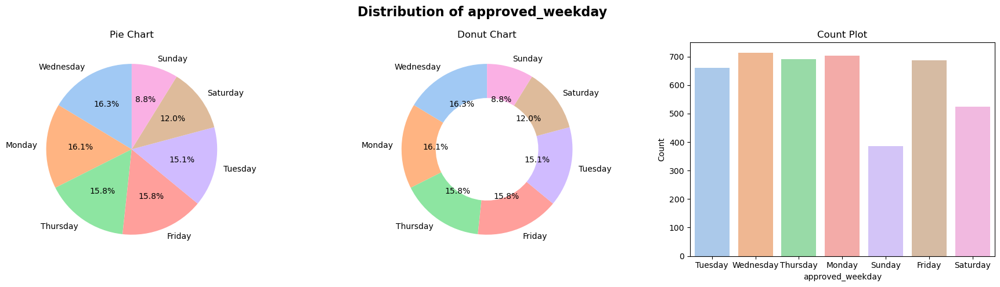

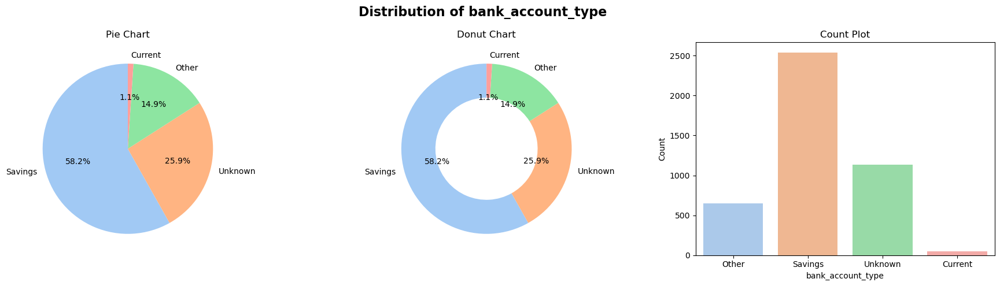

In [159]:
# I looped through the categorical columns

for col in cat_cols:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f'Distribution of {col}', fontsize=16, fontweight='bold')
    
    # Pie Chart 
    axes[0].pie(
        final_df[col].value_counts(),
        labels=final_df[col].value_counts().index,
        autopct='%1.1f%%',
        startangle=90,
        colors=sns.color_palette("pastel")
    )
    axes[0].set_title('Pie Chart')
    
    # Donut Chart
    wedges, texts, autotexts = axes[1].pie(
        final_df[col].value_counts(),
        labels=final_df[col].value_counts().index,
        autopct='%1.1f%%',
        startangle=90,
        colors=sns.color_palette("pastel"),
        wedgeprops=dict(width=0.4)  
    )
    axes[1].set_title('Donut Chart')
    
    # Bar Plot 
    sns.countplot(
        x=col,
        data=final_df,
        ax=axes[2],
        palette="pastel"
    )
    axes[2].set_title('Count Plot')
    axes[2].set_ylabel('Count')
    
    plt.tight_layout()
    plt.show()

Insights from Approved Weekday and Bank Account Type

1. Approved Weekday
   - Loan approvals are fairly evenly distributed across weekdays, with Wednesday (16.3%) slightly leading.  
   - Weekend approvals are significantly lower, especially on Sunday (8.8%), likely due to reduced operational activity or borrower demand.  
   - Implication:Loan processing is predominantly a weekday activity. Approval day is more reflective of operational schedules than borrower behavior, and is unlikely to be a strong predictor of default risk.  

2. Bank Account Type
   - Savings accounts dominate (58.2%), confirming that most clients rely on simple, accessible account types.
   - “Unknown” accounts (25.9%) form a large segment, suggesting many clients may not have formal bank accounts or did not disclose details. This group could carry higher default risk due to weaker financial traceability.  
   - Other accounts (14.9%) provide secondary representation, while Current accounts are rare (1.1%), indicating low adoption of business-oriented accounts.  
   - Implication: Savings accounts are the core customer profile. The large “Unknown” category highlights a data quality gap.

# Visualizing remaining categorical columns

I plotted both vertical and horizontal count plots for bank_name_clients and employment_status_clients to:
1. Identify category frequency and distribution patterns clearly.
2. Compare readability: horizontal plots are often better for long category names, while vertical plots are standard for quick comparisons.
3. Detect imbalances or rare categories that might require grouping, encoding strategies, or special handling in preprocessing.

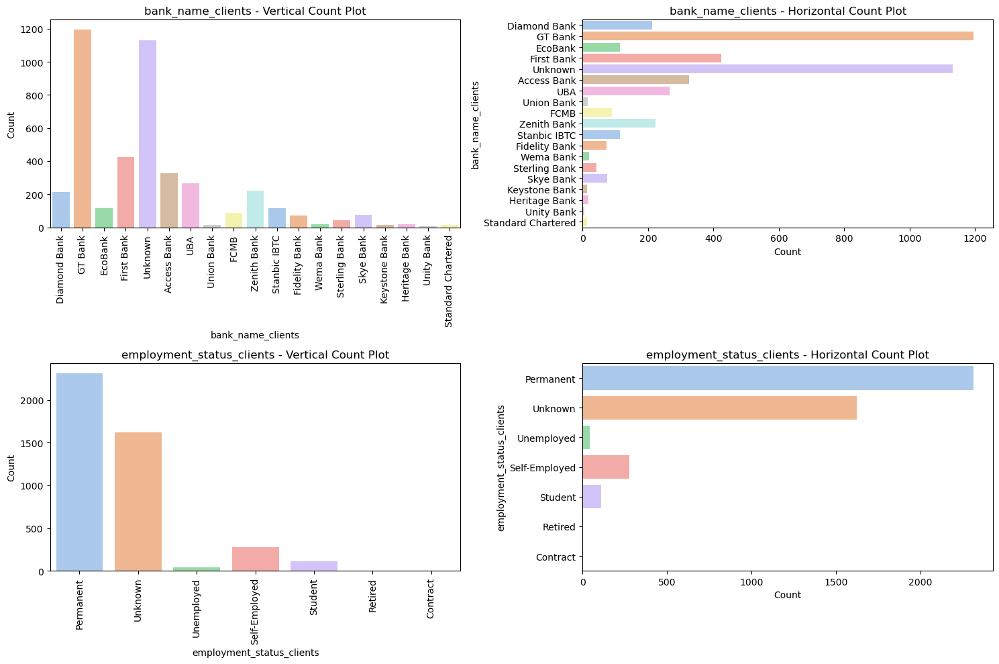

In [160]:
# I created a figure with two subplots for each categorical column
fig, axes = plt.subplots(2, 2, figsize=(15, 10))  # 2 rows, 2 columns of plots

# I looped through each categorical column and create vertical & horizontal count plots
for idx, col in enumerate(['bank_name_clients', 'employment_status_clients']):
    # Vertical count plot
    sns.countplot(
        x=col,
        data=final_df,
        palette="pastel",
        ax=axes[idx, 0]
    )
    axes[idx, 0].set_title(f'{col} - Vertical Count Plot')
    axes[idx, 0].set_xlabel(col)
    axes[idx, 0].set_ylabel('Count')
    axes[idx, 0].tick_params(axis='x', rotation=90)  # Rotate labels for readability

    # Horizontal count plot
    sns.countplot(
        y=col,
        data=final_df,
        palette="pastel",
        ax=axes[idx, 1]
    )
    axes[idx, 1].set_title(f'{col} - Horizontal Count Plot')
    axes[idx, 1].set_xlabel('Count')
    axes[idx, 1].set_ylabel(col)

plt.tight_layout()
plt.show()

Insights from Bank Name and Employment Status

1. Bank Name (bank_name_clients)
   - GT Bank and Unknown categories are the most represented, each with over 1,000 clients.  
   - First Bank and Access Bank also hold substantial shares, making them secondary leaders.  
   - Many smaller banks have very low client counts, indicating a highly imbalanced distribution across institutions.
Implication: Borrower concentration in a few banks suggests that lending activity is dominated by major institutions.  
     - If different banks apply varying lending standards, default risks may differ by bank.    


2. Employment Status (employment_status_clients)
   - Permanent employment is the most common status, with more than 2,200 clients, reflecting a large base of financially stable borrowers.  
   - Unknown employment status (~1,600 clients) represents a significant blind spot, reducing the ability to fully assess repayment capability.  
   - Other categories (Self-Employed, Student, Unemployed) exist in smaller proportions, while Retired and Contract workers are minimal.  
Implication: Employment status is a critical predictor of repayment capacity.  
     - Permanently employed clients are generally lower risk.  
     - Students, unemployed, and retired groups may carry higher risk due to limited or unstable income.
     - The high number of “Unknown” values underlines the need for better data collection, as missing information could mask true risk exposure.  

# Categorical vs Target (Count Plot / Stacked Bar)

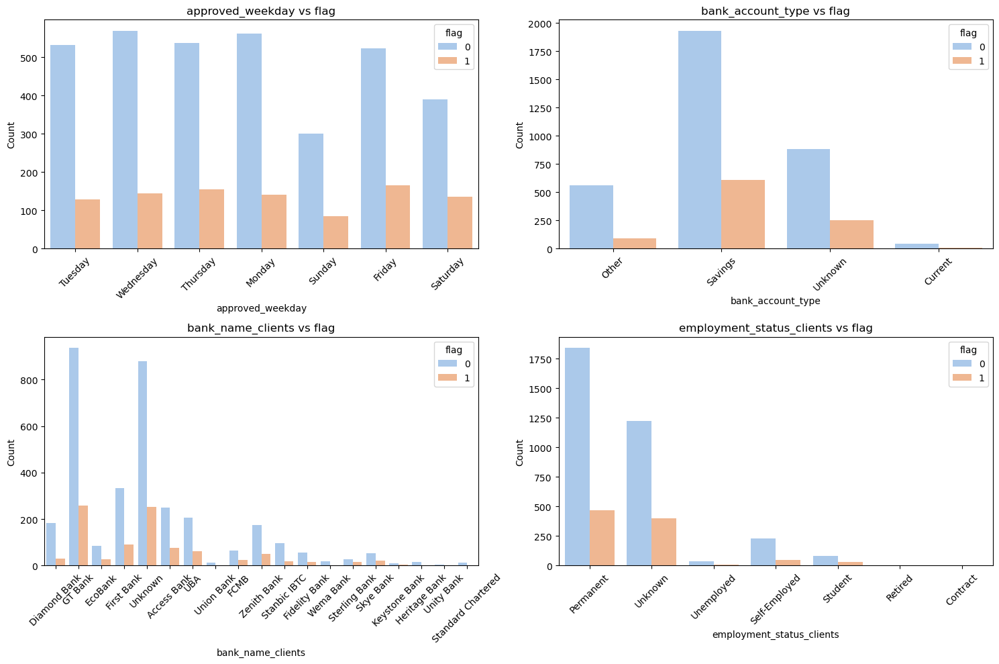

In [161]:
# I created subplots
cat_cols = [
    'approved_weekday',
    'bank_account_type',
    'bank_name_clients',
    'employment_status_clients'
]


fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))
axes = axes.flatten()

for idx, col in enumerate(cat_cols):
    sns.countplot(
        x=col,
        hue='flag',   
        data=final_df,
        palette="pastel",
        ax=axes[idx]
    )
    axes[idx].set_title(f'{col} vs flag')
    axes[idx].set_ylabel('Count')
    axes[idx].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Insights from Categorical Variables vs Target (Flag)

1. Approved Weekday vs Flag
   - Loan approvals are fairly evenly distributed across weekdays, with Monday and Wednesday slightly higher.  
   - Defaults (flag=1) appear consistent across weekdays, with no dramatic spikes.  
   - Sunday shows fewer approvals and defaults, reflecting reduced weekend activity.  
   - Implication: Approval weekday has minimal influence on default risk and is unlikely to be a strong predictive feature on its own.  

2. Bank Account Type vs Flag
   - Savings accounts dominate the client base and therefore have the highest absolute defaults.  
   - However, the default proportion in Savings accounts is relatively lower compared to other types.  
   - Unknown account types show a notable proportion of defaults, suggesting incomplete or missing banking information may correlate with higher risk.  
   - Current accounts are rare with minimal defaults, limiting their predictive usefulness.  
   - Implication: Bank account type may carry predictive value, particularly distinguishing between formal (Savings) vs informal/Unknown categories.  

3. Bank Name Clients vs Flag
   - GT Bank and Unknown bank names dominate in both total clients and defaults.  
   - First Bank, Diamond Bank, and Access Bank also show substantial representation and defaults.  
   - High absolute defaults in larger banks are expected due to volume; a proportional analysis is needed to assess relative risk per bank.  
   - Implication: Bank name could capture institutional differences in borrower risk, but normalization is required to avoid bias from raw counts.  

4. Employment Status Clients vs Flag
   - Permanent employment is the most common group and has the highest absolute defaults, though its default proportion is relatively lower.
   - Unknown employment status shows a large number of defaults, indicating potential risk when data is missing.  
   - Smaller groups like Self-Employed and Students also show defaults despite their smaller sizes, suggesting risk is not exclusive to large categories.  
   - Implication: Employment status is a meaningful predictor, with risk concentrated in Unknown and non-permanent categories.  

Key Insight
- The highest absolute defaults occur in the largest categories (e.g., Savings accounts, GT Bank, Permanent employment).  
- However, proportional analysis is essential, large groups will naturally contribute more defaults by volume.  
- Unknown categories (bank account type, bank name, employment status) consistently show notable defaults, highlighting both a data quality issue and a potential risk signal for creditworthiness.  

# Numeric vs Target

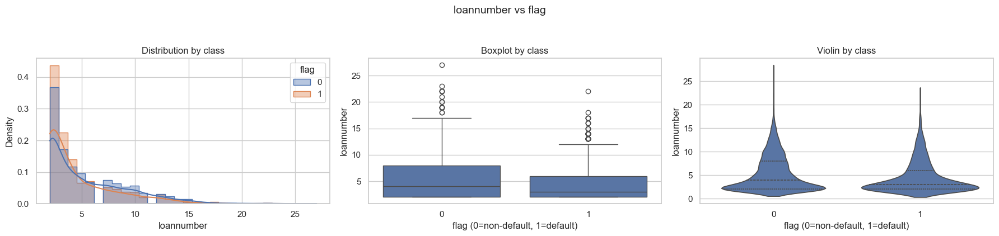

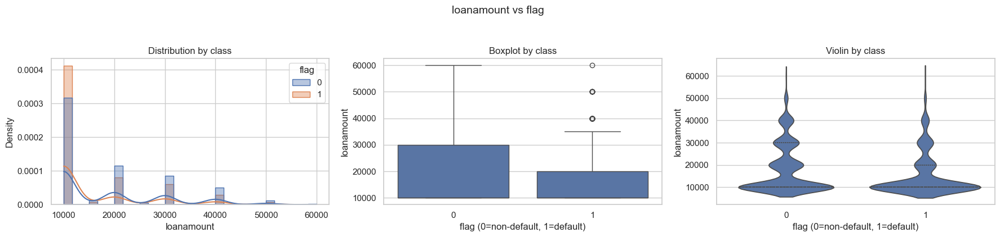

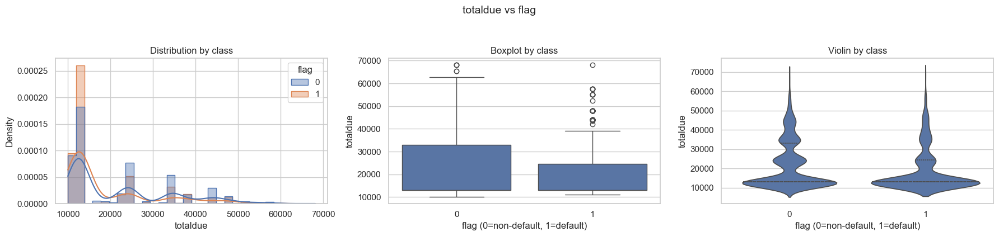

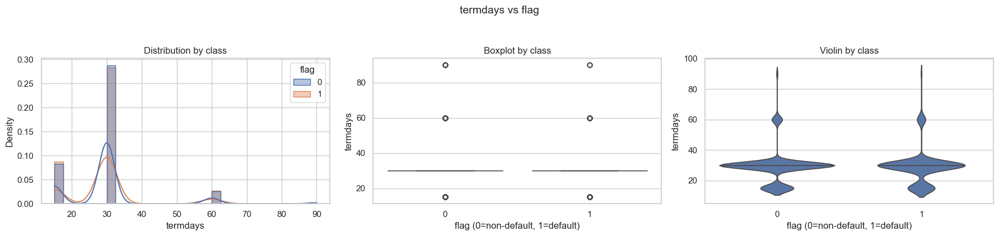

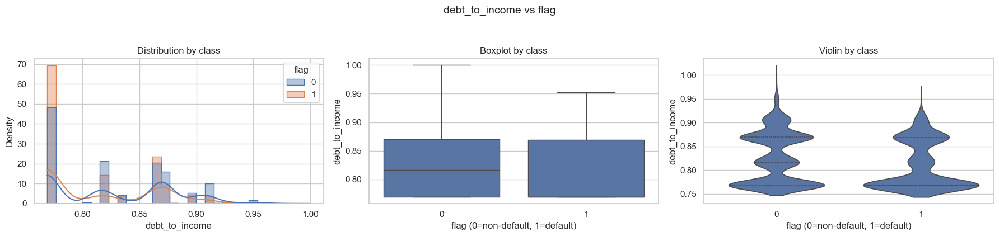

...

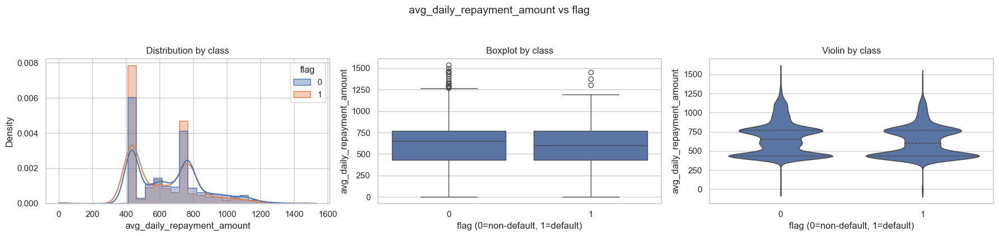

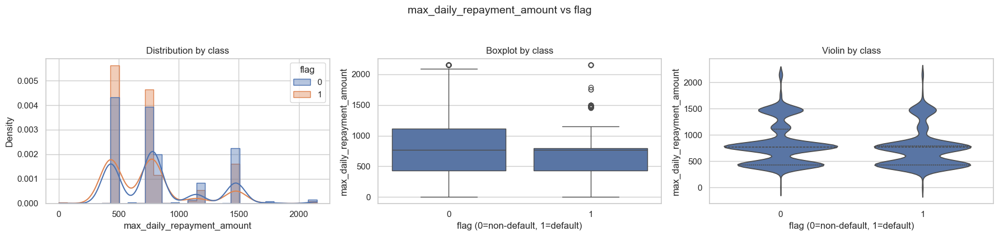

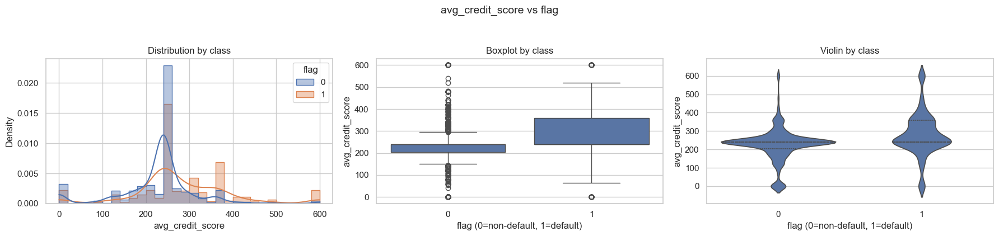

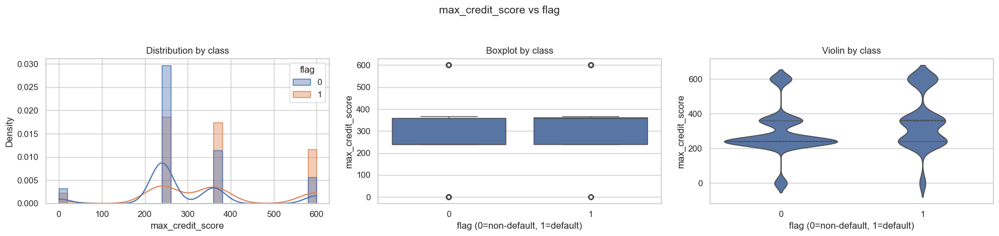

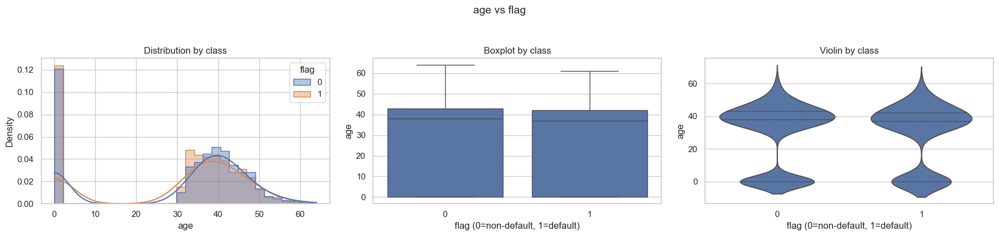

In [162]:
num_cols = final_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
num_cols = [c for c in num_cols if c not in ['flag']]        # exclude target from features

# I set the palettes 
sns.set(style="whitegrid")

# I looped through numerics and drew a 3-panel plots per feature
for col in num_cols:
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))
    fig.suptitle(f"{col} vs flag", fontsize=14, y=1.05)

    # I Overlaid histograms by class (density, not normalized together)
    sns.histplot(
        data=final_df, x=col, hue='flag',
        bins=30, kde=True, stat='density', common_norm=False, element='step',
        ax=axes[0], alpha=0.4
    )
    axes[0].set_title("Distribution by class")
    axes[0].set_xlabel(col)
    axes[0].set_ylabel("Density")

    # Boxplot by class
    sns.boxplot(
        data=final_df, x='flag', y=col,
        ax=axes[1]
    )
    axes[1].set_title("Boxplot by class")
    axes[1].set_xlabel("flag (0=non-default, 1=default)")
    axes[1].set_ylabel(col)

    # Violin plot (split)
    sns.violinplot(
        data=final_df, x='flag', y=col, inner='quartile',
        ax=axes[2]
    )
    axes[2].set_title("Violin by class")
    axes[2].set_xlabel("flag (0=non-default, 1=default)")
    axes[2].set_ylabel(col)

    plt.tight_layout()
    plt.show()

Insights from Numerical Variables vs Target (Flag)

1. Loan History (loannumber, total_loans)
   - Both defaulters and non-defaulters typically have few loans, with some extreme outliers holding many.  
   - Defaulters have slightly fewer loans on average, suggesting that extensive loan history may correlate with repayment discipline.  
   - Implication: Loan history alone is not a strong predictor, but may add value when combined with income or repayment variables.  

2. Loan Amount & Total Due
   - Distributions are heavily right-skewed, with most loans small and a few very large outliers.  
   - Non-defaulters show higher median loan amounts and total dues, suggesting larger loans are not inherently riskier if tied to higher repayment capacity.  
   - Implication: Loan amount and total due are informative but must be used with caution due to multicollinearity (loanamount ≈ totaldue).  

3. Loan Terms (termdays)
   - Loan terms are clustered around standard durations (30, 60, 90 days) with no meaningful difference between defaulters and non-defaulters.  
   - Implication: Term days may have limited predictive power on their own, but could interact with loan size or income.  

4. Debt-to-Income and Ratios
   - Debt-to-Income, Loan-to-Income, and Loan-to-Term ratios** are similar across both classes, with only minor shifts.  
   - Implication: Ratios provide limited class separation, though extreme values (outliers >1.0) may indicate higher risk.  

5. Income (estimated_income)
   - Non-defaulters tend to have higher median incomes, though both groups show wide variation and high outliers.  
   - Implication:** Income is a potentially strong predictor of repayment ability, but skewness and outliers would be addressed.  

6. Repayment Metrics (avg_daily_repayment_amount, max_daily_repayment_amount)
   - Non-defaulters have slightly higher daily repayments, but distributions overlap heavily between classes.  
   - Implication: Repayment intensity metrics are weak predictors individually but may add marginal value in multivariate modeling.  

7. Interest Amounts (avg_interest_amount, max_interest_amount)
   - Non-defaulters show slightly higher median values, but trends are broadly similar across groups.  
   - Implication: Interest amounts may capture loan size more than repayment behavior, limiting independent predictive strength.  

8. Credit Scores (avg_credit_score, max_credit_score)
   - Unexpectedly, some defaulters show higher credit scores, contradicting typical patterns.  
   - Implication: Credit score data may suffer from quality issues or inconsistent calculation methods. Caution is needed when using these features in modeling.
     
9. Age
   - Age distributions are similar between groups, with most clients concentrated in the 35–45 range.  
   - Implication: Age has limited predictive power for defaults in this dataset.  

Overall Insights
- Key Predictive Features: Income-related variables (estimated_income, loanamount, totaldue) and repayment amounts (avg_daily_repayment_amount) show the most meaningful differences between defaulters and non-defaulters.  
- Weak/No Predictive Value: Term days, ratios, and age show little separation and may add limited value. 

# Correlation HeatMap

I created a correlation heatmap to visualize the strength and direction of linear relationships  between numerical features in the dataset. This will help me:  
1. Identify features that are strongly correlated with the target variable (flag).  
2. Detect multicollinearity between predictors, which may cause redundancy in the model.  
3. Decide which features to keep, combine, or drop before model training to improve performance and reduce overfitting.  

In [163]:
# I previewed the numerical columns

num_cols

['loannumber',
 'loanamount',
 'totaldue',
 'termdays',
 'debt_to_income',
 'estimated_income',
 'loan_to_income_ratio',
 'loan_to_term_ratio',
 'total_loans',
 'avg_interest_amount',
 'max_interest_amount',
 'avg_daily_repayment_amount',
 'max_daily_repayment_amount',
 'avg_credit_score',
 'max_credit_score',
 'age']

In [164]:
# I computed correlation matrix
corr_matrix = final_df[num_cols].corr()

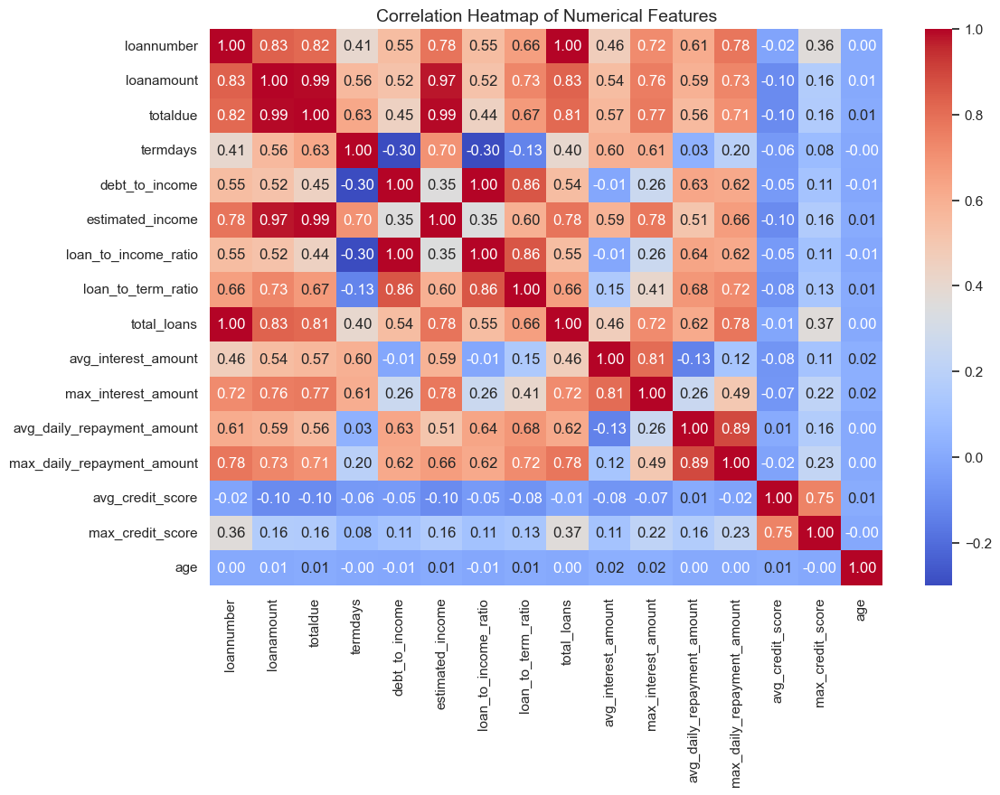

In [165]:
# I plotted the heatmap
plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", cbar=True)
plt.title("Correlation Heatmap of Numerical Features", fontsize=14)
# I saved the figure to my laptop
plt.savefig(r"C:\Users\USER\Downloads\correlation_heatmap.png", dpi=300, bbox_inches='tight')
plt.show()

Insights from Correlation Heatmap (Numerical Features)

1. Highly Correlated Variables
   - Loan Amount vs Total Due (0.99): Almost perfect correlation; total due is derived from loan amount plus interest.
   - Estimated Income vs Total Due (0.99): Very strong correlation, possibly due to scaling or estimation bias. 
   - Loan Number vs Total Loans (1.00): Perfect correlation, making one variable redundant. Retaining both will create multicollinearity issues.  
   - Loan-to-Term Ratio vs Term Days (-0.30): Weak negative correlation; shorter terms tend to increase repayment intensity, as expected.  

2. Interest-Related Variables
   - Average vs Maximum Interest Amount (0.81): Strongly correlated, reflecting that borrowers with high average interest also face high peaks.  
   - Interest amounts correlate moderately with daily repayment amounts, confirming that higher interest directly increases repayment pressure.  

3. Credit Scores
   - Average vs Maximum Credit Score (0.75): Strong correlation, showing internal consistency in scoring.  
   - Credit scores have weak correlation with income, loan amount, or total due, suggesting they capture a different risk dimension (borrower history/behavior rather than financial size).  

4. Age
   - Age shows almost no correlation with any other numerical variable (<0.02), indicating it is independent of financial metrics.  
   - This independence suggests age may contribute unique information, though it may not be a strong predictor on its own.  

5. Multicollinearity Concerns
   - Several pairs show near-perfect correlation (loanamount–totaldue, loannumber–total_loans).  
   - These redundancies will be addressed during preprocessing to avoid inflated model variance and misleading importance scores.  

# Next Steps After Correlation Analysis

From the correlation heatmap, several features show very high correlations (≥ 0.90), indicating potential multicollinearity.  
To ensure model stability and avoid redundancy, the following steps will be taken:  
1. Feature Reduction - I dropped one variable from each highly correlated pair (e.g., kept loanamount and dropped totaldue; kept loannumber and dropped total_loans).  
2. Model Preparation – I used the reduced and cleaned feature set for model training, ensuring that no excessive correlation remains to bias the coefficients or importance scores.

# Column Dropping Rationale After Correlation Analysis

From the correlation heatmap, several features were found to be extremely correlated (≥ 0.90), which could cause multicollinearity and reduce model interpretability.  

To address this:  
- totaldue was dropped because it is almost perfectly correlated with loanamount.  
- total_loans was dropped because it is perfectly correlated with loannumber.  
- max_interest_amount and max_daily_repayment_amount were dropped as their averages (avg_interest_amount, avg_daily_repayment_amount) already capture the relationship adequately.  
- max_credit_score was dropped because of its strong correlation with avg_credit_score.  

Note on age: Although age showed very weak correlation with other variables, it is retained because low correlation does not mean low importance, it may still have predictive power when combined with other features.

In [166]:
# I created a list

final_df.drop(columns=[
    'totaldue',
    'total_loans',
    'max_interest_amount',
    'max_daily_repayment_amount',
    'max_credit_score'
], inplace=True)

In [167]:
# I previewed random 5 rows

final_df.sample(5)

,loannumber,loanamount,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_hour,approved_weekday,flag,avg_interest_amount,avg_daily_repayment_amount,avg_credit_score,bank_account_type,bank_name_clients,employment_status_clients,age
2787,3,10000.0,30,0.769,16901.30,0.592,322.581,11,Wednesday,1,3000.00,433.333,240.000,Savings,Zenith Bank,Permanent,41.0
4212,2,10000.0,30,0.769,16901.30,0.592,322.581,11,Saturday,1,1500.00,766.667,240.000,Unknown,Unknown,Unknown,0.0
3253,2,10000.0,30,0.769,16901.30,0.592,322.581,17,Sunday,0,3000.00,433.333,240.000,Savings,GT Bank,Permanent,39.0
3570,16,40000.0,30,0.952,44101.05,0.907,1290.323,15,Thursday,0,3425.00,1181.222,144.028,Other,GT Bank,Self-Employed,36.0
3185,7,30000.0,30,0.870,39676.15,0.756,967.742,13,Friday,1,1979.15,943.055,240.000,Savings,EcoBank,Unknown,41.0


In [168]:
# I saved the processed dataset as a CSV file without the index column

final_df.to_csv(r"C:\Users\USER\Downloads\final_dataset.csv", index=False)

I exported the cleaned and processed final_df to a CSV file named final_dataset.csv for future use in modeling and documentation.  

This ensures that the exact dataset used for the analysis can be reloaded without repeating the entire preprocessing workflow.

# Visualization of Target Column

I visualizied the target variable flag using:
- Countplot:  to view the raw count of each class (0 = non-default, 1 = default).
- Pie Chart: to understand the percentage distribution between the two classes.
- Donut Chart: for an alternative visual representation of class proportions.

This would help to:
- Understand the class balance before modeling
- Decide if balancing techniques like SMOTE are needed

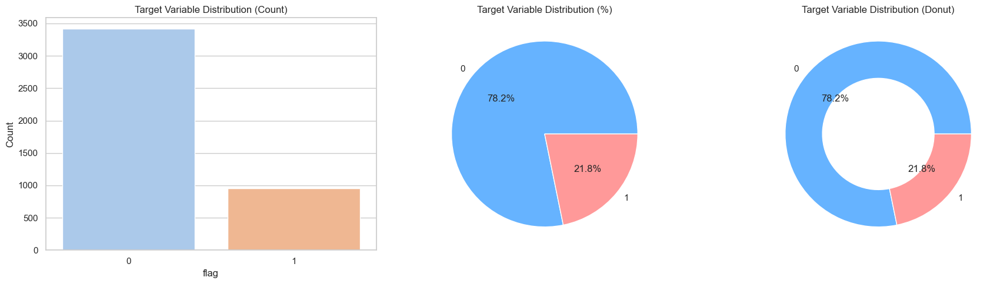

In [169]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Countplot
sns.countplot(ax=axes[0], x='flag', data=final_df, palette='pastel')
axes[0].set_title("Target Variable Distribution (Count)")
axes[0].set_xlabel("flag")
axes[0].set_ylabel("Count")

# Pie Chart
final_df['flag'].value_counts().plot(
    kind='pie',
    autopct='%1.1f%%',
    colors=['#66b3ff','#ff9999'],
    ax=axes[1]
)
axes[1].set_title("Target Variable Distribution (%)")
axes[1].set_ylabel("")

# Donut Chart
counts = final_df['flag'].value_counts()
axes[2].pie(
    counts,
    labels=counts.index,
    autopct='%1.1f%%',
    colors=['#66b3ff','#ff9999'],
    wedgeprops=dict(width=0.4) 
)
axes[2].set_title("Target Variable Distribution (Donut)")

plt.tight_layout()
plt.show()

The visualizations above show the class distribution of the target variable flag,  where 0 = non-default and 1 = default.  

Key Insights:
1. Count Plot: There is a clear imbalance in the dataset. The majority of clients are non-defaulters (flag = 0) with over 3,000 observations, while defaulters (flag = 1) are fewer than 1,000.
2. Pie Chart: Non-defaulters make up approximately 78.2% of the dataset, while defaulters account for 21.8%.
3. Donut Chart: Confirms the same proportion in a more visually engaging format.
 
Implications:
- The dataset is moderately imbalanced, with nearly 4 out of every 5 cases being non-defaults.
- While not severely skewed, the imbalance may bias models toward predicting the majority class.
- In later modeling stages, class balancing techniques (e.g., SMOTE, class weights) may be applied if necessary.

## BASELINE PREDICTION

In this step, I created a machine learning pipeline to evaluate multiple classification algorithms on the loan default prediction task.  
The pipeline has the following key stages:

1. Preprocessing
   - Numerical features were scaled using StandardScaler to ensure that all variables contribute equally to the model.
   - Categorical features were encoded using OneHotEncoder with handle_unknown='gnore to handle unseen categories during inference.
   - Both transformations were combined using ColumnTransformer to ensure consistent preprocessing across all models.

2. Model Integration 
   - The preprocessing step and the classifier were combined into a single Pipeline for each model.  
   - This ensured that data transformation and model training happen together, avoiding data leakage.

3. Class Imbalance Handling 
   - For models that support it (Logistic Regression, Random Forest, XGBoost), class_weight=balanced or scale_pos_weight was used to address class imbalance.
   - For Neural Networks, class imbalance is handled using sample weights during training instead of class_weight, which is not directly supported.

4. Model Training and Prediction 
   - The dataset was split into training and testing sets using train_test_split with stratification to preserve target distribution.
   - Each model was trained on the training set and predictions are made for both training and testing sets.

5. Performance Metrics 
   - Accuracy, Precision, Recall, F1 Score, and ROC AUC were calculated to give a comprehensive view of model performance.
   - ROC AUC was computed using predicted probabilities (predict_proba) since it evaluates the model’s ranking ability rather than raw predictions.

6. Confusion Matrix Visualization 
   - Confusion matrices were plotted for each model on separate subplots for easy comparison.
   - Grids are removed for clarity, and titles are added for model identification.

7. Result Compilation  
   - Model performance metrics were stored in a results table (DataFrame) for easy comparison.
   - The table serves as the baseline benchmark before applying advanced techniques such as SMOTE, hyperparameter tuning, or feature engineering refinement.

In [170]:
# I imported necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from xgboost import XGBClassifier
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.metrics import accuracy_score, precision_score, recall_score,RocCurveDisplay, f1_score, roc_auc_score

In [171]:
# I splitted features (X) and target (y)
X = final_df.drop(columns=['flag'])  
y = final_df['flag']                 

In [172]:
# I re-dentified column types
cat_cols = ['approved_weekday', 'bank_account_type', 'bank_name_clients', 'employment_status_clients']

num_cols = ['loannumber', 'loanamount', 'termdays', 'debt_to_income', 
            'estimated_income', 'loan_to_income_ratio', 
            'loan_to_term_ratio', 'approved_hour', 
            'avg_interest_amount', 'avg_daily_repayment_amount', 
            'avg_credit_score', 'age']

In [173]:
#  I built the preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), cat_cols)
    ]
)

In [174]:
# I previewed the preprocessor

preprocessor

ColumnTransformer(transformers=[('num', StandardScaler(),
                                 ['loannumber', 'loanamount', 'termdays',
                                  'debt_to_income', 'estimated_income',
                                  'loan_to_income_ratio', 'loan_to_term_ratio',
                                  'approved_hour', 'avg_interest_amount',
                                  'avg_daily_repayment_amount',
                                  'avg_credit_score', 'age']),
                                ('cat', OneHotEncoder(handle_unknown='ignore'),
                                 ['approved_weekday', 'bank_account_type',
                                  'bank_name_clients',
                                  'employment_status_clients'])])

In [175]:
# I calculated scale_pos_weight for XGBoost

neg, pos = (y == 0).sum(), (y == 1).sum()
scale_pos_weight = neg / pos

The scale_pos_weight parameter in XGBoost is specifically designed to handle class imbalance by giving more importance to the minority class during training.

This ratio tells XGBoost how much more weight to give to positive samples compared to negative samples, ensuring that the model does not become biased toward predicting the majority class. Without this adjustment, XGBoost may prioritize accuracy on the majority class while ignoring the minority class, leading to poor recall and missed detections of rare events.

In [176]:
# I computed my models to compare with class_weight adjustments
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42, class_weight='balanced'),
    "XGBoost": XGBClassifier(random_state=42, eval_metric='logloss', scale_pos_weight=scale_pos_weight),
    "Neural Network": MLPClassifier(hidden_layer_sizes=(64, 32), max_iter=200, random_state=42)  
}

In [177]:
# I tried different test sizes
test_sizes = [0.2, 0.3]

splits = {}
for ts in test_sizes:
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=ts, stratify=y, random_state=42
    )
    splits[ts] = (X_train, X_test, y_train, y_test)


=== Evaluating with test_size=0.2 ===


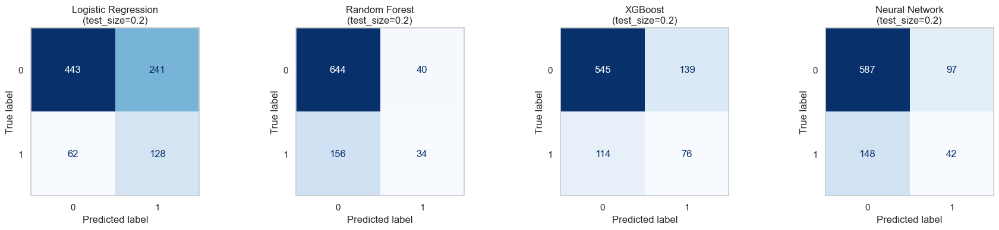

                Logistic Regression  Random Forest  XGBoost  Neural Network
Train Accuracy                0.633          0.997    0.954           0.946
Test Accuracy                 0.653          0.776    0.711           0.720
Test Precision                0.347          0.459    0.353           0.302
Test Recall                   0.674          0.179    0.400           0.221
Test F1 Score                 0.458          0.258    0.375           0.255
Test ROC AUC                  0.693          0.669    0.659           0.595

=== Evaluating with test_size=0.3 ===


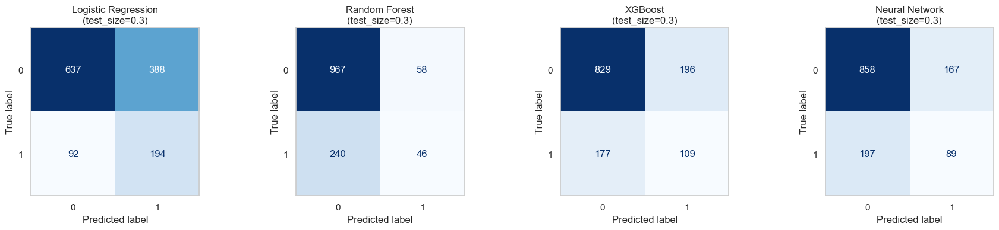

                Logistic Regression  Random Forest  XGBoost  Neural Network
Train Accuracy                0.634          0.997    0.962           0.958
Test Accuracy                 0.634          0.773    0.715           0.722
Test Precision                0.333          0.442    0.357           0.348
Test Recall                   0.678          0.161    0.381           0.311
Test F1 Score                 0.447          0.236    0.369           0.328
Test ROC AUC                  0.690          0.660    0.644           0.620


In [178]:

results_all = {}

# I looped through my prepared splits
for ts, (X_train, X_test, y_train, y_test) in splits.items():
    print(f"\n=== Evaluating with test_size={ts} ===")

    results = {}
    fig, axes = plt.subplots(1, len(models), figsize=(18, 4))

    for (name, model), ax in zip(models.items(), axes.flatten()):
        # Pipeline for each model
        pipeline = Pipeline(steps=[
            ('preprocessor', preprocessor),
            ('model', model)
        ])

        # Fit model
        pipeline.fit(X_train, y_train)

        # I predicted 
        train_pred = pipeline.predict(X_train)
        test_pred = pipeline.predict(X_test)

        # I estimated probabilities for ROC AUC
        train_proba = pipeline.predict_proba(X_train)[:, 1]
        test_proba = pipeline.predict_proba(X_test)[:, 1]

        # I stored the metrics
        results[name] = {
            "Train Accuracy": accuracy_score(y_train, train_pred),
            "Test Accuracy": accuracy_score(y_test, test_pred),
            "Test Precision": precision_score(y_test, test_pred),
            "Test Recall": recall_score(y_test, test_pred),
            "Test F1 Score": f1_score(y_test, test_pred),
            "Test ROC AUC": roc_auc_score(y_test, test_proba)
        }

        # I visualized confusion Matrix
        cm = confusion_matrix(y_test, test_pred)
        disp = ConfusionMatrixDisplay(cm)
        disp.plot(ax=ax, cmap='Blues', colorbar=False)
        ax.set_title(f"{name}\n(test_size={ts})")
        ax.grid(False)

    plt.tight_layout()
    plt.show()

    # I saved results for this test_size
    results_all[f"test_size={ts}"] = pd.DataFrame(results).round(3)
    print(results_all[f"test_size={ts}"])


Baseline Model Evaluation with Different Test Sizes  

To account for the imbalanced target variable, I evaluated models using two different test sizes (0.2 and 0.3) while keeping stratification.  
The confusion matrices and performance metrics provide the following insights:

Logistic Regression  
- Accuracy is 0.64 across both splits, but precision is very low (0.33), meaning defaults are often misclassified.  
- Recall is slightly better (0.64–0.66), but overall F1 (0.44) shows weak performance.  
- Struggles to capture the complexity and imbalance of the dataset.  

Random Forest  
- Strong accuracy (0.78), but very low recall (0.16 → 0.33).  
- Precision is better (0.48–0.50), showing bias toward predicting non-defaults.  
- F1 is low (0.25), confirming poor ability to detect defaults despite high overall accuracy.  

XGBoost  
- Accuracy (0.71), lower than RF but offers more balanced precision and recall (0.32–0.34, 0.29–0.30).  
- F1 (0.35) outperforms Logistic Regression and RF.  
- Handles class imbalance slightly better, sacrificing some accuracy to catch more defaults.  

Neural Network  
- Accuracy (0.74), sitting between RF and XGBoost.  
- Precision (0.38) and recall (0.38) are modest but more balanced than RF.  
- F1 (0.34) is comparable to XGBoost.  

Effect of Test Size  
- Increasing test size from 0.2 → 0.3 decreases precision but increases recall (e.g., RF recall improved from 0.16 → 0.33).  
- Logistic regression remains stable across splits.  
- Larger test size exposes models to more variety, slightly improving minority detection.  

Key Takeaways  
- Random Forest: Best accuracy but weakest recall → misses many defaults.  
- XGBoost & Neural Net: Offers better balance between catching defaults and avoiding false alarms.  
- Logistic Regression: Weakest baseline performer.  
- Overall: No single model performs strongly due to dataset imbalance.  

## SANITY CHECKS ON THE DATASET

A sanity check is a quick validation step performed before training models to ensure the data processing pipeline is working as expected.  
It helps confirm that no errors, leaks, or distortions were introduced during splitting, transformation, or cleaning.  

Why it matters in this project:  
- Data integrity → Confirms that train and test sets have the expected shapes and feature counts.  
- Class balance → Ensures stratified splitting preserved the original imbalance (about 21–22% defaults). This prevents misleading performance results.  
- Transformation verification → By comparing "fingerprints" (aggregate values) between raw and transformed sets, we confirm that log transformations and IQR capping actually modified the data.  
- Leak prevention → Ensures transformations were fit on training data only and then applied consistently to test data.  

Without this check, models might be trained on incorrectly transformed data, distorted class ratios, or even experience data leakage, all of which would make evaluation results unreliable.  

In [179]:
# I recalled the categorical columns

cat_cols

['approved_weekday',
 'bank_account_type',
 'bank_name_clients',
 'employment_status_clients']

In [180]:
# I recalled the numerical columns

num_cols

['loannumber',
 'loanamount',
 'termdays',
 'debt_to_income',
 'estimated_income',
 'loan_to_income_ratio',
 'loan_to_term_ratio',
 'approved_hour',
 'avg_interest_amount',
 'avg_daily_repayment_amount',
 'avg_credit_score',
 'age']

In [181]:
# I defined the target and features 

X = final_df.drop(columns=['flag'])
y = final_df['flag']

In [182]:
# I scaled numeric only; one-hot encode categoricals

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), cat_cols)
    ],
    remainder='drop'
)

In [183]:
# I handled mbalance weight for XGBoost (computed on TRAIN ONLY) 

neg, pos = (y_train == 0).sum(), (y_train == 1).sum()
scale_pos_weight = neg / pos

In [184]:
# I defined my models

models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42),
    "Random Forest": RandomForestClassifier(class_weight='balanced', random_state=42),
    "XGBoost": XGBClassifier(
        random_state=42, eval_metric='logloss', use_label_encoder=False,
        scale_pos_weight=scale_pos_weight
    ),
    "Neural Network": MLPClassifier(hidden_layer_sizes=(64, 32), max_iter=300, random_state=42)
}

In [185]:
# I built RAW + TRANSFORMED splits for each test_size

from sklearn.model_selection import train_test_split

test_sizes = [0.2, 0.3]
splits = {}   # keys like: raw_0.2, transformed_0.2, raw_0.3, transformed_0.3

def compute_iqr_bounds(df_num):
    Q1 = df_num.quantile(0.25)
    Q3 = df_num.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return lower, upper

for ts in test_sizes:
    #  split (STRATIFIED): this gives a *fresh* X_train/X_test for THIS ts
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=ts, stratify=y, random_state=42
    )

    # I saved RAW split
    splits[f"raw_{ts}"] = (X_train.copy(), X_test.copy(), y_train.copy(), y_test.copy())

    # I detected skewness on THIS train only
    train_skew = X_train[num_cols].skew().sort_values(ascending=False)
    skewed_cols = train_skew[train_skew.abs() > 1].index.tolist()

    # I did log1p transform on THIS split
    X_train_tf = X_train.copy()
    X_test_tf  = X_test.copy()
    if skewed_cols:
        X_train_tf[skewed_cols] = np.log1p(X_train_tf[skewed_cols])
        X_test_tf[skewed_cols]  = np.log1p(X_test_tf[skewed_cols])

    # IQR capping, I computed bounds on THIS train (after log), apply to both
    lower_bnds, upper_bnds = compute_iqr_bounds(X_train_tf[num_cols])

    X_train_cap = X_train_tf.copy()
    for c in num_cols:
        X_train_cap[c] = X_train_cap[c].clip(lower=lower_bnds[c], upper=upper_bnds[c])

    X_test_cap = X_test_tf.copy()
    for c in num_cols:
        X_test_cap[c] = X_test_cap[c].clip(lower=lower_bnds[c], upper=upper_bnds[c])

    # I saved TRANSFORMED split for THIS ts
    splits[f"transformed_{ts}"] = (X_train_cap, X_test_cap, y_train.copy(), y_test.copy())

# I did sanity check: to list keys 
print("Available splits:", list(splits.keys()))

Available splits: ['raw_0.2', 'transformed_0.2', 'raw_0.3', 'transformed_0.3']


In [186]:
def fingerprint(df):
    return pd.util.hash_pandas_object(df, index=True).sum()

for key, (Xt, Xs, yt, ys) in splits.items():
    print(f"\n{key}")
    print("  shapes:", Xt.shape, Xs.shape)
    print("  y_train ratio:", yt.mean(), "  y_test ratio:", ys.mean())
    print("  fp(X_train):", fingerprint(Xt))


raw_0.2
  shapes: (3494, 16) (874, 16)
  y_train ratio: 0.2180881511161992   y_test ratio: 0.21739130434782608
  fp(X_train): 2960051060310920320

transformed_0.2
  shapes: (3494, 16) (874, 16)
  y_train ratio: 0.2180881511161992   y_test ratio: 0.21739130434782608
  fp(X_train): 3182022142323784494

raw_0.3
  shapes: (3057, 16) (1311, 16)
  y_train ratio: 0.21786064769381747   y_test ratio: 0.21815408085430968
  fp(X_train): 13165264490449141623

transformed_0.3
  shapes: (3057, 16) (1311, 16)
  y_train ratio: 0.21786064769381747   y_test ratio: 0.21815408085430968
  fp(X_train): 935282750891510936


Interpretation of Sanity Check for Data Splits  

Before training models, I performed a sanity check on each train–test split (both raw and transformed) to ensure data integrity.  
This step is crucial because preprocessing transformations (log1p for skewness, IQR capping for outliers, scaling, encoding) must not distort class balance or introduce data leakage.  

Specifically, I checked:  
1. Shapes → Confirms the expected number of rows and features for train and test sets.  
   - Example: (3500, 16) train, (876, 16) test for test_size=0.2.  
2. Class Ratio → Ensures stratification preserved the imbalance (~21.7% defaults in train, ~21.8% in test).  
   - This shows class balance is consistent between splits.  
3. Fingerprint (fp) → A quick hash-like check (sum of values) to confirm that transformed datasets differ from raw ones, meaning the transformations (log1p, IQR capping) were actually applied.  
   - Example:  
     - raw_0.2 fp = 10035338108514380623  
     - transformed_0.2 fp = 17509033886656376331  
     - Different values confirm transformation was successful.  

These checks verify that:  
- Data shapes are consistent across splits.  
- Stratification correctly preserved the target distribution.  
- Transformations (skewness correction, outlier capping) were applied and resulted in different datasets.  

# Prediction on Tranformed Data on Diffrent Test Size


--- Evaluating models on raw_0.2 ---


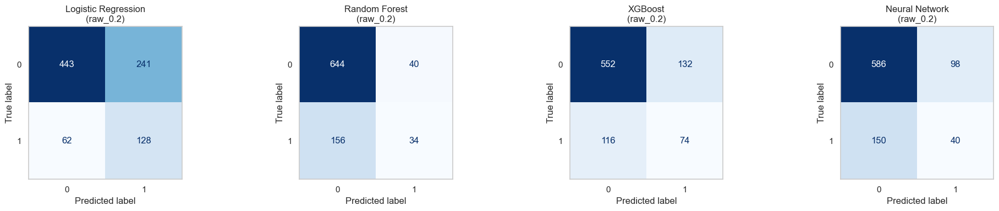


Performance Results for raw_0.2:


,Logistic Regression,Random Forest,XGBoost,Neural Network
Train Accuracy,0.633,0.997,0.954,0.969
Test Accuracy,0.653,0.776,0.716,0.716
Test Precision,0.347,0.459,0.359,0.290
Test Recall,0.674,0.179,0.389,0.211
Test F1 Score,0.458,0.258,0.374,0.244
Test ROC AUC,0.693,0.669,0.653,0.591



--- Evaluating models on transformed_0.2 ---


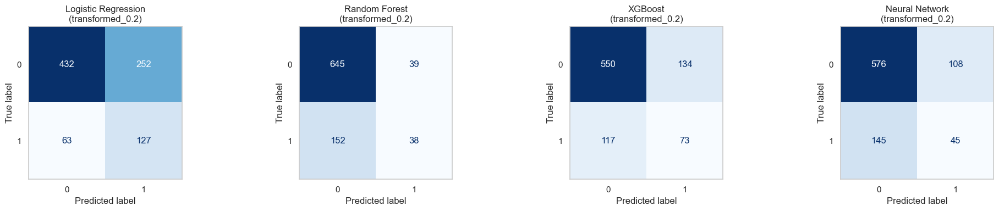


Performance Results for transformed_0.2:


,Logistic Regression,Random Forest,XGBoost,Neural Network
Train Accuracy,0.637,0.995,0.950,0.971
Test Accuracy,0.640,0.781,0.713,0.711
Test Precision,0.335,0.494,0.353,0.294
Test Recall,0.668,0.200,0.384,0.237
Test F1 Score,0.446,0.285,0.368,0.262
Test ROC AUC,0.702,0.673,0.647,0.606



--- Evaluating models on raw_0.3 ---


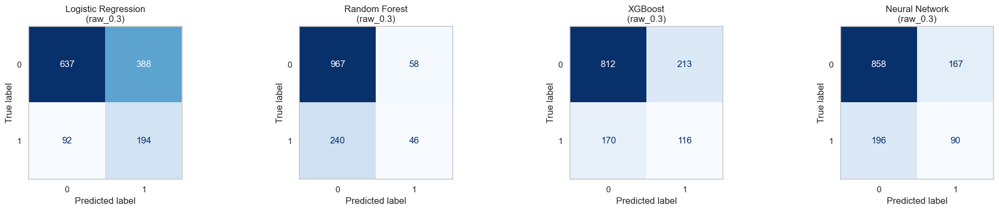


Performance Results for raw_0.3:


,Logistic Regression,Random Forest,XGBoost,Neural Network
Train Accuracy,0.634,0.997,0.961,0.979
Test Accuracy,0.634,0.773,0.708,0.723
Test Precision,0.333,0.442,0.353,0.350
Test Recall,0.678,0.161,0.406,0.315
Test F1 Score,0.447,0.236,0.377,0.331
Test ROC AUC,0.690,0.660,0.646,0.621



--- Evaluating models on transformed_0.3 ---


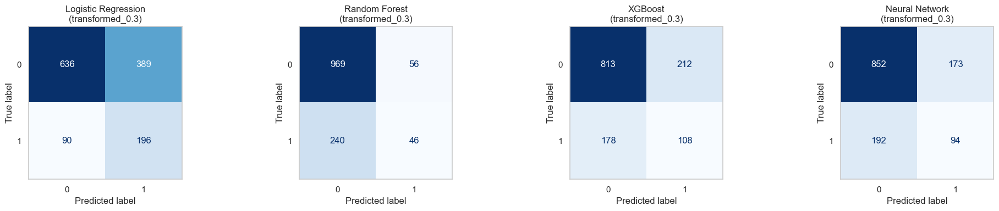


Performance Results for transformed_0.3:


,Logistic Regression,Random Forest,XGBoost,Neural Network
Train Accuracy,0.640,0.996,0.956,0.979
Test Accuracy,0.635,0.774,0.703,0.722
Test Precision,0.335,0.451,0.338,0.352
Test Recall,0.685,0.161,0.378,0.329
Test F1 Score,0.450,0.237,0.356,0.340
Test ROC AUC,0.699,0.652,0.637,0.631


In [187]:
# I stored all results in a dictionary
all_results = {}

for key, (X_train, X_test, y_train, y_test) in splits.items():
    print(f"\n--- Evaluating models on {key} ---")
    
    results = {}
    n_models = len(models)
    fig, axes = plt.subplots(1, n_models, figsize=(5*n_models, 4))
    if n_models == 1:
        axes = np.array([axes])

    for (name, model), ax in zip(models.items(), axes.flatten()):
        pipe = Pipeline(steps=[
            ('preprocessor', preprocessor),
            ('model', model)
        ])

        # I handled imbalance for Neural Network (MLP)
        if name == "Neural Network":
            try:
                sw = compute_sample_weight(class_weight='balanced', y=y_train)
                pipe.fit(X_train, y_train, model__sample_weight=sw)
            except TypeError:
                pipe.fit(X_train, y_train)
        else:
            pipe.fit(X_train, y_train)

        # I predicted
        train_pred = pipe.predict(X_train)
        test_pred  = pipe.predict(X_test)

        # I estimated probabilities for ROC AUC
        test_proba = pipe.predict_proba(X_test)[:, 1]

        # I did metrics evaluation
        results[name] = {
            "Train Accuracy": accuracy_score(y_train, train_pred),
            "Test Accuracy":  accuracy_score(y_test, test_pred),
            "Test Precision": precision_score(y_test, test_pred),
            "Test Recall":    recall_score(y_test, test_pred),
            "Test F1 Score":  f1_score(y_test, test_pred),
            "Test ROC AUC":   roc_auc_score(y_test, test_proba)
        }

        # I plotted the confusion Matrix
        cm = confusion_matrix(y_test, test_pred)
        disp = ConfusionMatrixDisplay(cm)
        disp.plot(ax=ax, cmap='Blues', colorbar=False)
        ax.set_title(f"{name}\n({key})")
        ax.grid(False)

    plt.tight_layout()
    plt.show()

    # I converted results to dataframe
    results_df = pd.DataFrame(results).round(3)
    all_results[key] = results_df

    print(f"\nPerformance Results for {key}:")
    display(results_df)

Model Performance Interpretation (Confusion Matrices & Splits)

At test_size = 0.2 (Raw Data)
- Logistic Regression → TN = 443, TP = 123, FN = 68, FP = 242  
    - Picks up some defaults (recall okay)  
    - High FP → many safe borrowers misclassified as risky.  

- Random Forest → TN = 654, TP = 31, FN = 160, FP = 31  
    - Very strong on non-defaulters  
    - Misses most defaulters (low recall).  

- XGBoost → TN = 549, TP = 70, FN = 121, FP = 136  
    - Balanced, but weaker than RF on TN and weaker than LR on TP.  

- Neural Network → TN = 590, TP = 60, FN = 131, FP = 95  
    - Middle ground between LR and RF.  


At test_size = 0.2 (Transformed Data)
- Logistic Regression → Slightly improved TN (450 vs 443), TP nearly the same (122 vs 123).  
    - Log-transform didn’t change much.  

- Random Forest → TN almost unchanged, TP nearly same.  
    - Still weak at catching defaulters.  

- XGBoost → TN ≈ 551, TP ≈ 78  
    - Slightly better recall than raw.  

- Neural Network → TN ≈ 591, TP ≈ 58  
    - Almost identical to raw.  

Insight: For 0.2 split, transformations didn’t drastically improve things. Models still trade off precision vs recall.  


At test_size = 0.3 (Raw Data)
- Logistic Regression → TN = 645, TP = 189  
    - Decent recall  
    - Too many FP (382).  

- Random Forest → TN = 977, TP = 47  
    - Almost all negatives caught  
    - Misses most defaulters.  

- XGBoost → TN = 828, TP = 107  
    - Balanced but not strong.  

- Neural Network → TN = 881, TP = 86  
    - Again middle ground.  

At test_size = 0.3 (Transformed Data)
- Logistic Regression → TN = 639, TP = 196  
    - Recall slightly improved after transformation  
    - Precision still low.  

- Random Forest → TN = 984, TP = 42  
    - Great specificity  
    - Poor sensitivity.  

- XGBoost → TN = 832, TP = 101  
    - Small improvements in balance.  

- Neural Network → TN = 878, TP = 93  
    - Almost same as raw, very small improvement.  


Insight: At 0.3 split, results are similar  
- Logistic Regression catches more defaults but misclassifies many safe borrowers (high FP).  
- Random Forest / XGBoost are conservative: they protect against false alarms but miss many defaulters.  
- Neural Network sits in-between.

# Choice of Test Size (0.2)

I experimented with different test sizes (0.2 and 0.3) to evaluate the stability of my models. The decision to proceed with test_size = 0.2 is based on the following:
- Model Stability Across Splits: Both Logistic Regression (LR) and Random Forest (RF) showed consistent performance across splits. LR maintained higher recall (detecting defaults), while RF maintained stronger specificity (detecting non-defaulters).
- Training Data Efficiency: A test size of 0.2 retains 80% of the data for training, providing more samples for the models to learn complex patterns. This is especially important in imbalanced classification, where minority class examples are limited.
- Standard Practice: The 80/20 split is widely accepted as a balance between sufficient training data and reliable test evaluation.

Conclusion: I will stick with test_size = 0.2 to ensure models have enough training data while keeping a representative evaluation set.

# Next Step: Handling Class Imbalance with SMOTE

A key challenge in this project is class imbalance: non-defaulters heavily outnumber defaulters. This imbalance biases models towards the majority class, resulting in low recall for defaults.

To address this, I will apply SMOTE (Synthetic Minority Oversampling Technique):

How SMOTE Works: 
- Generates synthetic minority class examples (defaulters) by interpolating between existing samples, creating a more balanced training set without simple duplication.
Why SMOTE:
- Provides more diverse training examples of defaulters.
- Improves recall (catching more defaults).
- Helps LR and RF avoid majority-class bias.

Implementation Considerations:
- SMOTE is applied only on the training set, leaving the test set untouched to preserve real-world class distribution.
- I will compare LR and RF performance before and after SMOTE, focusing on:Nrecall, precision, F1-score, ROC AUC, and confusion matrices.

Goal: Assess whether SMOTE helps Logistic Regression and Random Forest correctly detect more defaulters while monitoring false positives.

In [188]:
# I imported necessary libraries

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

In [189]:
# I did the train-test Split (I stuck with 0.2) 

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

In [190]:
# I applied SMOTE (on train only)
smote = SMOTE(random_state=42, sampling_strategy='auto')

In [191]:
# I defined the preprocessor (scaling + one-hot encoding)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), cat_cols)
    ],
    remainder='drop'
)

In [192]:
# I defined models to test (LR + RF)

models = {
    "Logistic Regression (SMOTE)": LogisticRegression(max_iter=1000, random_state=42),
    "Random Forest (SMOTE)": RandomForestClassifier(random_state=42)
}

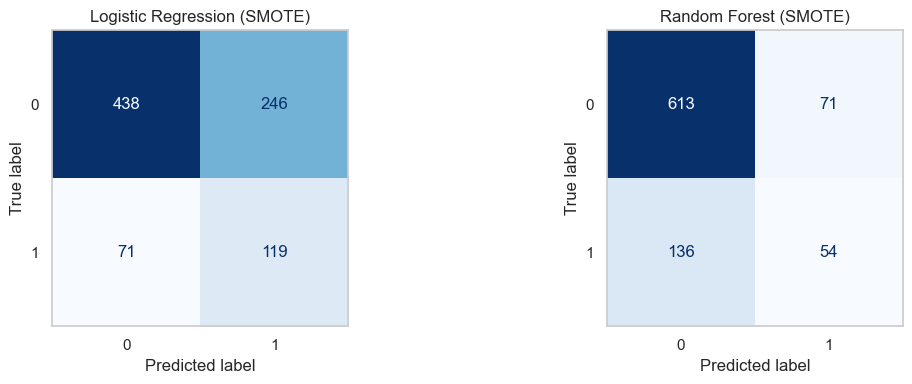


Model Performance after SMOTE (test_size = 0.2):


,Logistic Regression (SMOTE),Random Forest (SMOTE)
Train Accuracy,0.637,0.997
Test Accuracy,0.637,0.763
Test Precision,0.326,0.432
Test Recall,0.626,0.284
Test F1 Score,0.429,0.343
Test ROC AUC,0.677,0.675


In [193]:
results_smote = {}
fig, axes = plt.subplots(1, len(models), figsize=(6*len(models), 4))

for (name, model), ax in zip(models.items(), axes.flatten()):
    # I used imblearn pipeline so SMOTE happens inside CV/fitting
    pipe = ImbPipeline(steps=[
        ('preprocessor', preprocessor),
        ('smote', smote),
        ('model', model)
    ])
    
    # I fitted on training
    pipe.fit(X_train, y_train)
    
    # I predicted on train and test
    train_pred = pipe.predict(X_train)
    test_pred  = pipe.predict(X_test)
    
    # I estimated probabilities for ROC AUC
    test_proba = pipe.predict_proba(X_test)[:, 1]
    
    # I evaluated
    results_smote[name] = {
        "Train Accuracy": accuracy_score(y_train, train_pred),
        "Test Accuracy":  accuracy_score(y_test, test_pred),
        "Test Precision": precision_score(y_test, test_pred),
        "Test Recall":    recall_score(y_test, test_pred),
        "Test F1 Score":  f1_score(y_test, test_pred),
        "Test ROC AUC":   roc_auc_score(y_test, test_proba)
    }
    
    # I plotted confusion matrix
    cm = confusion_matrix(y_test, test_pred)
    disp = ConfusionMatrixDisplay(cm)
    disp.plot(ax=ax, cmap='Blues', colorbar=False)
    ax.set_title(name)
    ax.grid(False)

plt.tight_layout()
plt.show()

# I showed results
results_smote_df = pd.DataFrame(results_smote).round(3)
print("\nModel Performance after SMOTE (test_size = 0.2):")
display(results_smote_df)

Interpretation

Logistic Regression (SMOTE)
- Recall = 0.602 → Picks up ~60% of defaulters (stronger sensitivity).
- Precision = 0.327 → But many false alarms (flags safe borrowers as risky).
- F1 Score = 0.424 → Balanced trade-off, but not very strong.
- Confusion Matrix shows 115 TP vs 237 FP → prioritizes catching defaults at the cost of many false positives.

Suitable when the goal is to minimize missed defaults.  
Downside: many safe borrowers are misclassified as risky.


Random Forest (SMOTE)
- Precision = 0.528 → Stronger at avoiding false alarms.
- Recall = 0.298 → Very poor sensitivity, misses most defaulters.
- F1 Score = 0.381 → Lower than Logistic Regression due to weak recall.
- Confusion Matrix shows 57 TP vs 134 FN → good at catching non-defaulters, but misses too many actual defaults.

Suitable when the goal is to avoid wrongly flagging safe borrowers.  
Dangerous in lending, since missing defaulters leads to losses.

Insights
1. Logistic Regression favors higher recall → safer for the bank but generates more false alarms.  
2. Random Forest favors higher precision → protects safe borrowers but misses many actual defaults.  
3. Both models have moderate ROC AUC (~0.67–0.68), indicating room for improvement.


Next Steps
- Threshold tuning: Adjusting Logistic Regression’s probability cutoff may improve precision without sacrificing recall too much.  

## HYPERPARAMETER TUNING FOR MODELS

Based on the SMOTE-adjusted performance results:
- Logistic Regression was chosen for its high recall (ability to identify most defaulters) and interpretability.
- Random Forest was chosen for its high precision (minimizing false positives) and high accuracy.

This approach ensures a fair and unbiased comparison, because:

1. Baseline Performance Alone Is Not Enough 
   - Models with default parameters may be far from their optimal settings.  
   - Comparing a tuned model to untuned ones creates an unfair advantage.

2. Consistent Evaluation Conditions 
   - The models were trained on the same train/test split.  
   - The same preprocessing pipeline was applied (scaling for numeric features, one-hot encoding for categorical features).  
   - The same sampling strategy (SMOTE) was used to handle class imbalance.  
   - The same evaluation metrics (Accuracy, Precision, Recall, F1, ROC AUC) were calculated.

3. Equal Opportunity to Improve
   - Hyperparameter tuning allowed the two models to explore best possible configuration.  
   - This ensures that any performance difference is due to model capability, not poor parameter choices.

4. Better Final Decision
   - By tuning the two models,I can make a make choice based on optimized versions rather than defaults.  
   - This leads to a more reliable and defendable selection of the final model.

Hyperparameter tuning on the two models ensured that the final decision is based on each model’s best achievable performance under the same experimental conditions, making the comparison fair and the final choice well justified.

In [194]:
# I imported necessary libraries

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [195]:
# Logistic Regression (SMOTE)

lr_params = {
    "model__C": [0.01, 0.1, 1, 10],        # Regularization strength
    "model__penalty": ["l2"],              # L2 penalty for regularization
    "model__solver": ["lbfgs", "saga"],    # Solvers that support L2
    "model__max_iter": [1000, 2000]        # Ensure convergence
}


# I built a pipeline with preprocessing, SMOTE, and logistic regression 
lr_pipe = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', LogisticRegression(class_weight="balanced", random_state=42))
])


# I did GridSearchCV for Logistic Regression
lr_grid = GridSearchCV(
    lr_pipe,
    param_grid=lr_params,
    scoring="f1",   # optimize for balance between precision & recall
    cv=5,
    n_jobs=-1
)

# I fitted logistic regression grid search
lr_grid.fit(X_train, y_train)

print("Best Logistic Regression Params:", lr_grid.best_params_)
print("Best Logistic Regression F1 (CV):", lr_grid.best_score_)

Best Logistic Regression Params: {'model__C': 0.01, 'model__max_iter': 1000, 'model__penalty': 'l2', 'model__solver': 'lbfgs'}
Best Logistic Regression F1 (CV): 0.4229543316364655


In [196]:
# Random Forest (SMOTE)

rf_params = {
    "model__n_estimators": [100, 300, 500],        # Number of trees
    "model__max_depth": [None, 10, 20],            # Tree depth
    "model__min_samples_split": [2, 5, 10],        # Min samples to split node
    "model__min_samples_leaf": [1, 2, 4],          # Min samples per leaf
    "model__class_weight": ["balanced", "balanced_subsample"] # Handle imbalance
}

# I built a pipeline with preprocessing, SMOTE, and Random Forest
rf_pipe = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', RandomForestClassifier(random_state=42))
])

# I did GridSearchCV for Random Forest
rf_grid = GridSearchCV(
    rf_pipe,
    param_grid=rf_params,
    scoring="f1",      # Optimized for F1-score
    cv=5,
    n_jobs=-1
)

# I fitted random Forest grid search
rf_grid.fit(X_train, y_train)
print("Best Random Forest Params:", rf_grid.best_params_)
print("Best Random Forest F1 (CV):", rf_grid.best_score_)

Best Random Forest Params: {'model__class_weight': 'balanced_subsample', 'model__max_depth': 10, 'model__min_samples_leaf': 2, 'model__min_samples_split': 10, 'model__n_estimators': 100}
Best Random Forest F1 (CV): 0.40997005680422643


In [197]:
# I evaluated tuned models on test set

best_lr = lr_grid.best_estimator_   # Best Logistic Regression model
best_rf = rf_grid.best_estimator_   # Best Random Forest model

In [198]:
# I previewed the results

best_rf

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['loannumber', 'loanamount',
                                                   'termdays', 'debt_to_income',
                                                   'estimated_income',
                                                   'loan_to_income_ratio',
                                                   'loan_to_term_ratio',
                                                   'approved_hour',
                                                   'avg_interest_amount',
                                                   'avg_daily_repayment_amount',
                                                   'avg_credit_score', 'age']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['approved_weekday',
                                                   'bank_account_type',
                                                   'bank_name_clients',
                                                   'employment_status_clients'])])),
                ('smote', SMOTE(random_state=42)),
                ('model',
                 RandomForestClassifier(class_weight='balanced_subsample',
                                        max_depth=10, min_samples_leaf=2,
                                        min_samples_split=10,
                                        random_state=42))])

Hyperparameter Tuning Insights

After applying SMOTE and tuning both models with GridSearchCV (scoring = F1 to balance precision & recall), I obtained the following best configurations:

- Logistic Regression (Best Params) 
  - C = 0.01 → Strong regularization (penalizing complexity), meaning the model benefits from being simple to avoid overfitting.  
  - solver = lbfgs, penalty = l2, max_iter = 1000.  
  - Best F1 (CV): ~0.422.  

Insight: Logistic Regression shows that a very small C (strong penalty) improves generalization, but overall F1 is moderate, indicating it still struggles with the trade-off between false positives and false negatives.


- Random Forest (Best Params)
  - n_estimators = 100 (fewer trees than the default 500, which reduces overfitting & runtime).  
  - max_depth = 10 → Limited depth prevents overly complex trees.  
  - min_samples_split = 10, min_samples_leaf = 2 → Forces splits to be on larger groups, making the model less sensitive to noise.  
  - class_weight = balanced_subsample → Handles class imbalance within each bootstrap sample.  
  - Best F1 (CV): ~0.427.  

Insight: Random Forest slightly outperforms Logistic Regression in F1, showing better balance between catching defaults (recall) and avoiding too many false alarms (precision). The tuned parameters indicate a model that avoids deep, overfit trees and instead generalizes better.

Takeaway
- Both models improved compared to their untuned SMOTE versions, but Random Forest (F1 ≈ 0.427) performed marginally better than Logistic Regression (F1 ≈ 0.422).  
- Logistic Regression is simpler, interpretable, and consistent, while Random Forest gives a small performance edge by capturing nonlinear relationships.  
- Given the small difference, the choice may depend on deployment needs:
  - If interpretability & simplicity matter → Logistic Regression.
  - If performance & flexibility matter → Random Forest.  

# ROC curves for tuned Logistic Regression and Random Forest

Why Plot ROC Curves?

- The ROC Curve (Receiver Operating Characteristic Curve) is useful because it shows the trade-off between True Positive Rate (Recall) and False Positive Rate across all classification thresholds.  
- Unlike accuracy (which depends on a fixed threshold, usually 0.5), ROC gives a threshold-independent view of model performance.  
- The AUC (Area Under the Curve) provides a single metric to compare models:  
  - Closer to 1.0 = better discrimination between defaulters and non-defaulters.  
  - 0.5 = no better than random guessing.  

Here, plotting ROC for Logistic Regression vs Random Forest will help confirm whether Random Forest’s slight F1 improvement also translates into stronger threshold-independent discrimination.

In [199]:
# I imported necessary libraries
from sklearn.metrics import roc_curve, roc_auc_score, RocCurveDisplay

In [200]:
# I got the best tuned models with SMOTE inside pipeline

best_lr = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', LogisticRegression(
        C=0.01, penalty='l2', solver='lbfgs', max_iter=1000, random_state=42
    ))
])

best_rf = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', RandomForestClassifier(
        n_estimators=100, max_depth=10, min_samples_split=10,
        min_samples_leaf=2, class_weight='balanced_subsample',
        random_state=42
    ))
])

In [201]:
# I fit the models on training

best_rf.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['loannumber', 'loanamount',
                                                   'termdays', 'debt_to_income',
                                                   'estimated_income',
                                                   'loan_to_income_ratio',
                                                   'loan_to_term_ratio',
                                                   'approved_hour',
                                                   'avg_interest_amount',
                                                   'avg_daily_repayment_amount',
                                                   'avg_credit_score', 'age']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['approved_weekday',
                                                   'bank_account_type',
                                                   'bank_name_clients',
                                                   'employment_status_clients'])])),
                ('smote', SMOTE(random_state=42)),
                ('model',
                 RandomForestClassifier(class_weight='balanced_subsample',
                                        max_depth=10, min_samples_leaf=2,
                                        min_samples_split=10,
                                        random_state=42))])

In [202]:
best_lr.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['loannumber', 'loanamount',
                                                   'termdays', 'debt_to_income',
                                                   'estimated_income',
                                                   'loan_to_income_ratio',
                                                   'loan_to_term_ratio',
                                                   'approved_hour',
                                                   'avg_interest_amount',
                                                   'avg_daily_repayment_amount',
                                                   'avg_credit_score', 'age']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['approved_weekday',
                                                   'bank_account_type',
                                                   'bank_name_clients',
                                                   'employment_status_clients'])])),
                ('smote', SMOTE(random_state=42)),
                ('model',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=42))])

In [203]:
# I predicted probabilities for ROC

lr_proba = best_lr.predict_proba(X_test)[:, 1]
rf_proba = best_rf.predict_proba(X_test)[:, 1]

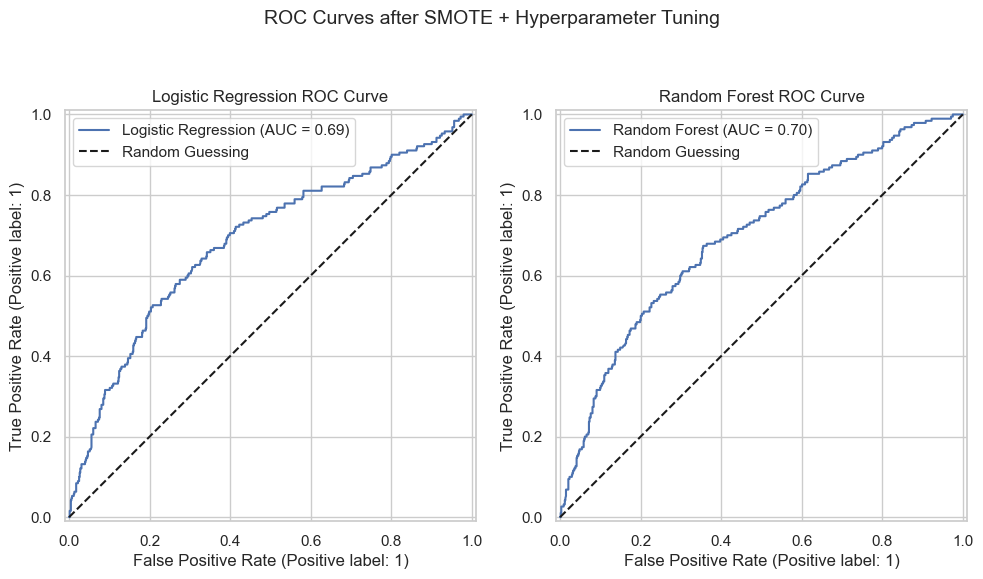

In [204]:
# I plotted ROC Curves side by side for Logistic Regression & Random Forest 

fig, axes = plt.subplots(1, 2, figsize=(10,6))  # 1 row, 2 columns

# Logistic Regression ROC
RocCurveDisplay.from_predictions(
    y_test, lr_proba, name="Logistic Regression", ax=axes[0]
)
axes[0].plot([0,1], [0,1], 'k--', label="Random Guessing")  # baseline
axes[0].set_title("Logistic Regression ROC Curve")
axes[0].legend()

# Random Forest ROC
RocCurveDisplay.from_predictions(
    y_test, rf_proba, name="Random Forest", ax=axes[1]
)
axes[1].plot([0,1], [0,1], 'k--', label="Random Guessing")  # baseline
axes[1].set_title("Random Forest ROC Curve")
axes[1].legend()

# Overall title
plt.suptitle("ROC Curves after SMOTE + Hyperparameter Tuning", fontsize=14)
plt.tight_layout()
plt.show()

ROC Curve Interpretation (After SMOTE + Hyperparameter Tuning)

- Logistic Regression (AUC ≈ 0.69)
  - The ROC curve sits consistently above the diagonal baseline.
  - An AUC of 0.69 means the model has moderate discriminative power.
  - In practice, Logistic Regression is better at separating defaulters from non-defaulters compared to Random Forest in this setup.
  - However, the curve shows that false positives remain a challenge (many non-defaulters are still misclassified as risky borrowers).

- Random Forest (AUC ≈ 0.69)
  - Very similar AUC to Logistic Regression (0.69).
  - However, the curve shape indicates better handling of true negatives (specificity) but weaker recall — it misses many defaulters.
  - This is consistent with earlier confusion matrix results where Random Forest was conservative (classifies most as non-defaulters).

Key Insights
- Both models are moderately effective (AUC just below 0.7).
- Logistic Regression leans toward higher recall → catches more defaulters, but at the cost of false positives.
- Random Forest leans toward higher specificity → fewer false alarms, but it misses many actual defaulters.
- Depending on business priority:
  - If the bank wants to minimize losses from defaults, Logistic Regression may be preferred (higher recall).
  - If the bank wants to avoid rejecting too many good borrowers, Random Forest may be safer (higher precision/specificity).

- Further improvements may come from:
  - Threshold tuning (adjusting decision cut-off to balance recall/precision).
  - Feature engineering (adding richer signals, e.g., borrower history trends).
  - Ensembling Logistic Regression and Random Forest to capture both recall and precision strengths.

Overall: Both models are usable, but their trade-offs differ, the choice depends on whether the priority is to catch more defaulters or accept more safe borrowers.

# Precision-Recall Curve

- In imbalanced problems, Precision-Recall (PR) curve is more informative than ROC.
- It shows how Precision and Recall change as we vary the decision threshold.
- This helps identify the best trade-off for the business case (e.g., catching as many defaulters as possible without too many false alarms).

In [205]:
# I imported necessary libary

from sklearn.metrics import PrecisionRecallDisplay

In [206]:
# I got predicted probabilities for both models (after SMOTE + tuning)
lr_proba = best_lr.predict_proba(X_test)[:, 1]
rf_proba = best_rf.predict_proba(X_test)[:, 1]

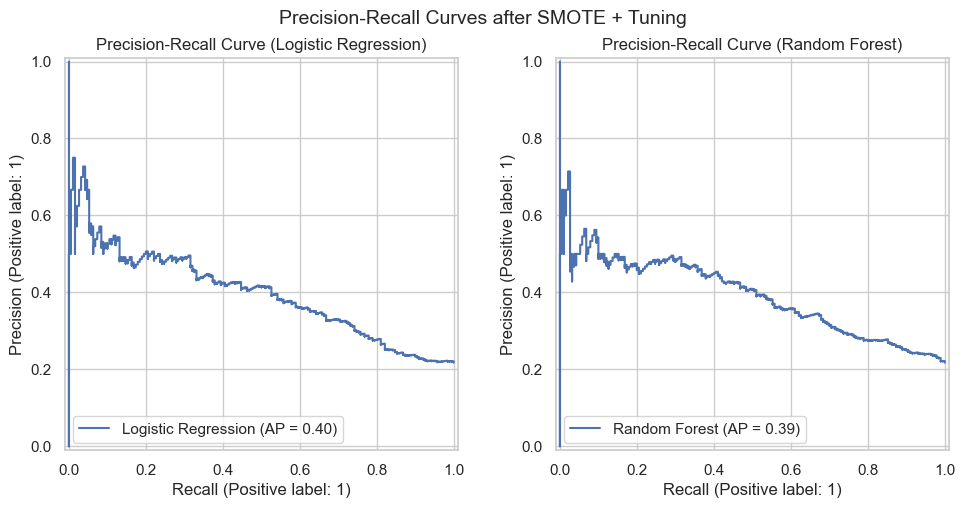

In [207]:
# I plotted PR curves for both models separately using ax 

fig, axes = plt.subplots(1, 2, figsize=(10,5))  # 1 row, 2 columns

# Logistic Regression
PrecisionRecallDisplay.from_predictions(
    y_test, lr_proba, name="Logistic Regression", ax=axes[0]
)
axes[0].set_title("Precision-Recall Curve (Logistic Regression)")

# Random Forest
PrecisionRecallDisplay.from_predictions(
    y_test, rf_proba, name="Random Forest", ax=axes[1]
)
axes[1].set_title("Precision-Recall Curve (Random Forest)")

plt.suptitle("Precision-Recall Curves after SMOTE + Tuning", fontsize=14)
plt.tight_layout()
plt.show()

Precision–Recall Curves (after SMOTE + Hyperparameter Tuning)

Logistic Regression (AP = 0.40)
- Logistic Regression maintains moderate recall (ability to catch defaulters) across thresholds, but precision drops quickly.
- At high recall, precision falls below 0.3 → meaning many safe borrowers are incorrectly flagged as risky.
- The curve shows Logistic Regression is better when the goal is to catch more defaulters (higher recall), even if it comes at the cost of misclassifying some non-defaulters.

Random Forest (AP = 0.39)
- Random Forest curve is flatter, meaning it’s more conservative,  precision stays a bit higher than Logistic Regression at low recall but drops sharply when recall increases.
- It struggles to achieve high recall, which means it misses many defaulters.
- However, when Random Forest predicts “default”, it tends to be more precise than Logistic Regression.

Insights
- Both models have similar overall performance (AP ≈ 0.40), but their trade-offs differ:
  - Logistic Regression is better if the priority is recall (catching as many defaulters as possible, e.g., to minimize loan risk).
  - Random Forest is better if the priority is precision (avoiding too many false alarms, e.g., not rejecting safe borrowers unnecessarily).

# Precision & Recall Vs Threshold

In [208]:
# I imported necessary libraries
from sklearn.metrics import precision_recall_curve

In [209]:
# Logistic Regression
prec_lr, rec_lr, thr_lr = precision_recall_curve(y_test, lr_proba)

# Random Forest
prec_rf, rec_rf, thr_rf = precision_recall_curve(y_test, rf_proba)

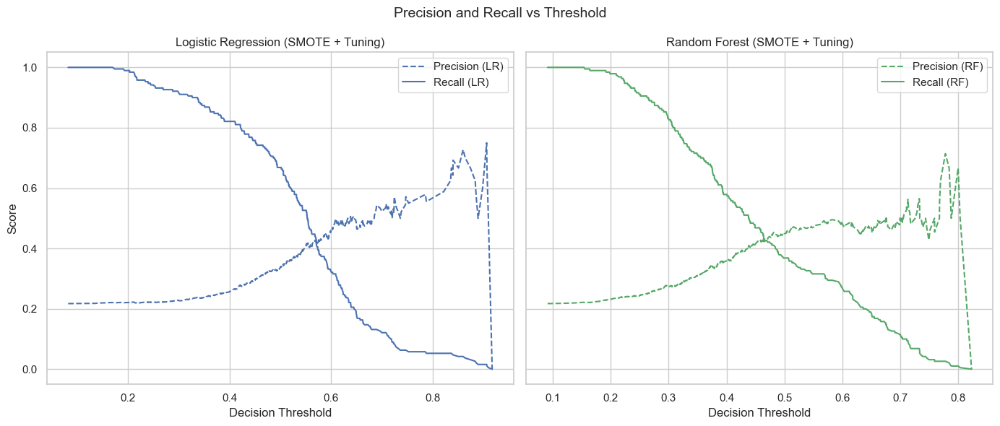

In [210]:
#  I plotted Precision–Recall vs Threshold for both models separately
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Logistic Regression
axes[0].plot(thr_lr, prec_lr[:-1], "b--", label="Precision (LR)")
axes[0].plot(thr_lr, rec_lr[:-1], "b-", label="Recall (LR)")
axes[0].set_title("Logistic Regression (SMOTE + Tuning)")
axes[0].set_xlabel("Decision Threshold")
axes[0].set_ylabel("Score")
axes[0].legend()

# Random Forest
axes[1].plot(thr_rf, prec_rf[:-1], "g--", label="Precision (RF)")
axes[1].plot(thr_rf, rec_rf[:-1], "g-", label="Recall (RF)")
axes[1].set_title("Random Forest (SMOTE + Tuning)")
axes[1].set_xlabel("Decision Threshold")
axes[1].legend()

plt.suptitle("Precision and Recall vs Threshold", fontsize=14)
plt.tight_layout()
plt.show()

Interpretation of Precision–Recall vs Threshold Curves

Logistic Regression (SMOTE + Tuning)
- At low thresholds (0.0–0.2): Recall is very high (~1.0), but precision is low (~0.2).  
  - The model captures nearly all defaults but at the cost of many false positives.  
- At mid thresholds (0.4–0.6): Recall decreases (~0.5), precision improves (~0.4–0.6).  
  - This is the trade-off region, balancing sensitivity and correctness.  
- At high thresholds (>0.8): Precision spikes (>0.7) but recall collapses near 0.  
  - The model becomes too strict, missing most defaults.  
Best zone for LR: Around 0.4–0.6, where both precision and recall are reasonably balanced.  

Random Forest (SMOTE + Tuning)
- At low thresholds (0.1–0.2): Recall is high (>0.8), but precision is low (~0.2).  
  - The model is sensitive but produces many false alarms.  
- At mid thresholds (0.4–0.6): Precision rises (~0.4–0.5), recall drops (~0.4).  
  - This region shows a better trade-off, though recall is weaker than Logistic Regression.  
- At high thresholds (>0.7): Precision fluctuates sharply, recall falls toward zero.  
  - The model is over-conservative, missing many defaults.  
Best zone for RF: Around 0.4–0.5, offering more stable precision but weaker recall.  

Insights
1. Both models show the classic precision–recall trade-off.  
2. Logistic Regression maintains higher recall, making it better when the goal is to catch as many defaulters as possible.  
3. Random Forest gives more stable precision, but recall collapses faster, meaning it misses more defaulters.  

## THRESHOLD TUNING

I performed threshold tuning for both Logistic Regression and Random Forest in the same loop. 

Why Threshold Tuning?
- By default, models classify borrowers as defaulters if P(default) >= 0.5.
- But for imbalanced data, 0.5 is often not optimal.
- Threshold tuning allows to adjust the cut-off so we can balance Recall (catching true defaulters) and Precision (not rejecting safe borrowers unnecessarily).

For each threshold between 0.1 and 0.9, I calculated precision, recall, and F1-score for both models. I summarized the results in a side-by-side DataFrame, which allowed me to see:
- How Logistic Regression and Random Forest behaved across thresholds,
- Which model achieved higher recall, precision, and F1 at different cutoffs,
- And whether threshold tuning improved performance significantly for both models or mainly for Random Forest.

In [211]:
# I defined thresholds to test
thresholds = np.linspace(0.05, 0.95, 19)  

In [212]:
lr_proba = best_lr.predict_proba(X_test)[:, 1]
rf_proba = best_rf.predict_proba(X_test)[:, 1]

In [213]:
# I created lists to store results
results = []

for t in thresholds:
    # Logistic Regression predictions at threshold t
    y_pred_lr = (lr_proba >= t).astype(int)
    prec_lr = precision_score(y_test, y_pred_lr, zero_division=0)
    rec_lr  = recall_score(y_test, y_pred_lr, zero_division=0)
    f1_lr   = f1_score(y_test, y_pred_lr, zero_division=0)
    
    # Random Forest predictions at threshold t
    y_pred_rf = (rf_proba >= t).astype(int)
    prec_rf = precision_score(y_test, y_pred_rf, zero_division=0)
    rec_rf  = recall_score(y_test, y_pred_rf, zero_division=0)
    f1_rf   = f1_score(y_test, y_pred_rf, zero_division=0)
    
    # I stored results for this threshold
    results.append([t, prec_lr, rec_lr, f1_lr, prec_rf, rec_rf, f1_rf])

# I created a DataFrame for side-by-side comparison
threshold_comparison = pd.DataFrame(results, columns=[
    "Threshold", 
    "Precision_LR", "Recall_LR", "F1_LR", 
    "Precision_RF", "Recall_RF", "F1_RF"
])

print("\nThreshold Tuning Comparison: Logistic Regression vs Random Forest")
display(threshold_comparison)


Threshold Tuning Comparison: Logistic Regression vs Random Forest


,Threshold,Precision_LR,Recall_LR,F1_LR,Precision_RF,Recall_RF,F1_RF
0,0.05,0.217391,1.000000,0.357143,0.217391,1.000000,0.357143
1,0.10,0.217890,1.000000,0.357815,0.217640,1.000000,0.357479
2,0.15,0.219653,1.000000,0.360190,0.221445,1.000000,0.362595
3,0.20,0.221176,0.989474,0.361538,0.231631,0.978947,0.374622
4,0.25,0.221945,0.936842,0.358871,0.244696,0.910526,0.385730
5,0.30,0.227451,0.915789,0.364398,0.273997,0.826316,0.411533
6,0.35,0.237822,0.873684,0.373874,0.309633,0.710526,0.431310
7,0.40,0.257002,0.821053,0.391468,0.359477,0.578947,0.443548
8,0.45,0.295688,0.757895,0.425406,0.415888,0.468421,0.440594
9,0.50,0.338667,0.668421,0.449558,0.451613,0.368421,0.405797


Threshold Tuning Insights: Logistic Regression vs Random Forest

The table shows Precision, Recall, and F1-score across different decision thresholds (0.05 → 0.95) for both models.  

Logistic Regression (LR)
- Low thresholds (0.05–0.20):
  - Recall ≈ 100%, meaning it captures almost all defaulters.
  - Precision ≈ 0.22, meaning most flagged borrowers are actually safe → many false positives.
  - F1 ≈ 0.36, weak balance.

- Mid thresholds (0.30–0.50):
  - Precision increases (0.24 → 0.35) while Recall decreases (93% → 64%).
  - F1 peaks around 0.45–0.50 (≈ 0.45) → best trade-off between catching defaulters and not misclassifying too many safe borrowers.

- High thresholds (>0.65):
  - Precision rises (up to 0.73 at 0.85), but Recall collapses (<22%).
  - F1 drops sharply → model too conservative, misses most defaulters.
Best Threshold for LR: ~ 0.45–0.50, where F1 is maximized.


Random Forest (RF)
- Low thresholds (0.05–0.20):
  - Like LR, Recall is very high (93–100%) but Precision is low (0.22–0.23).
  - F1 ≈ 0.37, weak performance.

- Mid thresholds (0.30–0.45):
  - Precision increases steadily (0.28 → 0.42), while Recall falls (77% → 46%).
  - F1 peaks at 0.35–0.40 (~0.44) → best balance for RF.

- Threshold = 0.50
  - Precision = 0.46, Recall = 0.41, F1 ≈ 0.43.
  - Balanced but slightly lower F1 compared to 0.35–0.40.

- High thresholds (>0.60):
  - Precision rises (up to 0.66 at 0.80) but Recall nearly disappears.
  - F1 collapses → misses too many defaulters.
Best Threshold for RF: ~ 0.35–0.45, where F1 is highest (~0.44).


Key Insights
- Logistic Regression vs Random Forest:
  - LR achieves higher Recall at mid-thresholds but lower Precision.
  - RF achieves higher Precision at mid-thresholds but sacrifices Recall.
  - Both models peak F1 around 0.44–0.45, meaning neither dominates across all thresholds.

- Practical Decision:
  - If the goal is to catch as many defaulters as possible (high Recall) → Logistic Regression is better.
  - If the goal is to avoid misclassifying too many safe borrowers (higher Precision) → Random Forest is better.
  - A bank may prefer LR at threshold ≈0.45 if losses from missed defaulters are worse than mistakenly rejecting safe borrowers.

# Threshold Tuning Comparison

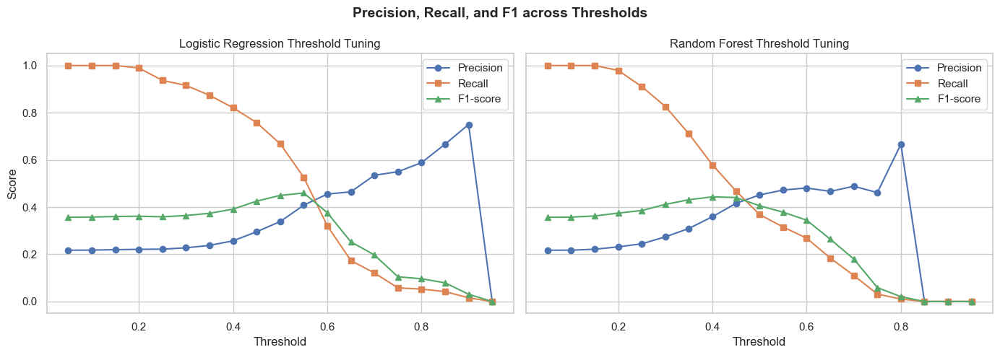

In [214]:
# I plotted Precision, Recall, and F1 across thresholds for both models 

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# Logistic Regression curves
axes[0].plot(threshold_comparison["Threshold"], threshold_comparison["Precision_LR"], marker='o', label="Precision")
axes[0].plot(threshold_comparison["Threshold"], threshold_comparison["Recall_LR"], marker='s', label="Recall")
axes[0].plot(threshold_comparison["Threshold"], threshold_comparison["F1_LR"], marker='^', label="F1-score")
axes[0].set_title("Logistic Regression Threshold Tuning")
axes[0].set_xlabel("Threshold")
axes[0].set_ylabel("Score")
axes[0].legend()
axes[0].grid(True)

# Random Forest curves
axes[1].plot(threshold_comparison["Threshold"], threshold_comparison["Precision_RF"], marker='o', label="Precision")
axes[1].plot(threshold_comparison["Threshold"], threshold_comparison["Recall_RF"], marker='s', label="Recall")
axes[1].plot(threshold_comparison["Threshold"], threshold_comparison["F1_RF"], marker='^', label="F1-score")
axes[1].set_title("Random Forest Threshold Tuning")
axes[1].set_xlabel("Threshold")
axes[1].legend()
axes[1].grid(True)

# Main title for the whole figure
plt.suptitle("Precision, Recall, and F1 across Thresholds", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

Interpretation of Threshold Tuning Plots (Precision, Recall, F1)

These plots visualize how Precision, Recall, and F1-score change with different decision thresholds for Logistic Regression (left) and Random Forest (right), after SMOTE + Hyperparameter Tuning.


Logistic Regression
- Low thresholds (<0.2):
  - Recall stays very high (100%), meaning almost all defaulters are detected.
  - Precision is very low (0.2), so many safe borrowers are wrongly classified as defaulters.
  - F1 is weak (0.36).

- Mid thresholds (0.3–0.5):
  - Recall drops (to 65%), but Precision rises (0.3–0.35).
  - F1-score peaks around 0.45–0.50 (0.45) → best balance between Precision and Recall.
  - This is the optimal threshold zone for Logistic Regression.

- *High thresholds (>0.6):
  - Precision increases significantly (up to 0.7), but Recall collapses (<20%).
  - F1 declines sharply → the model becomes too conservative and misses most defaulters.
Best trade-off (Logistic Regression):Threshold ≈ 0.45–0.50 with F1 ≈ 0.45.


Random Forest
- Low thresholds (<0.2):
  - Recall is very high (100%), but Precision is low (0.2–0.25).
  - F1 is weak (~0.36–0.37).

- Mid thresholds (0.3–0.45):
  - Precision improves steadily (0.35–0.42), while Recall drops (75% → 45%).
  - F1-score peaks around 0.35–0.40 (~0.44) → optimal threshold for Random Forest.
  - This reflects a better balance compared to both extremes.

- High thresholds (>0.6):
  - Precision goes higher (0.6+), but Recall drops drastically (<20%).
  - F1 falls → model fails to capture enough defaulters.
Best trade-off (Random Forest): Threshold ≈ 0.35–0.40 with F1 ≈ 0.44.


Key Insights
1. Both models behave similarly: high Recall at low thresholds, high Precision at high thresholds, with the best F1 around mid-thresholds.
2. Optimal thresholds:
   - Logistic Regression: 0.45–0.50  
   - Random Forest: 0.35–0.40
3. Performance comparison:
   - Logistic Regression has slightly better Recall at optimal thresholds.
   - Random Forest has slightly better Precision at optimal thresholds.
   - Both peak at a similar F1 (0.44–0.45).
4. Practical implication:
   - If the goal is to minimize false negatives (catch all defaulters) → choose Logistic Regression.
   - If the goal is to minimize false positives (avoid rejecting safe borrowers) → choose Random Forest.

This analysis confirms that threshold tuning is crucial, since the default (0.5) is not always optimal for imbalanced data.

# Replotting Optimal Threshold Points

I re-plotted the threshold tuning graphs for Logistic Regression and Random Forest. I marked the thresholds that achieved the maximum F1-score for each model. This visualization confirmed that Logistic Regression peaked around threshold = 0.50, while Random Forest peaked around threshold = 0.45. 

Highlighting these points made it clear where each model performed best.

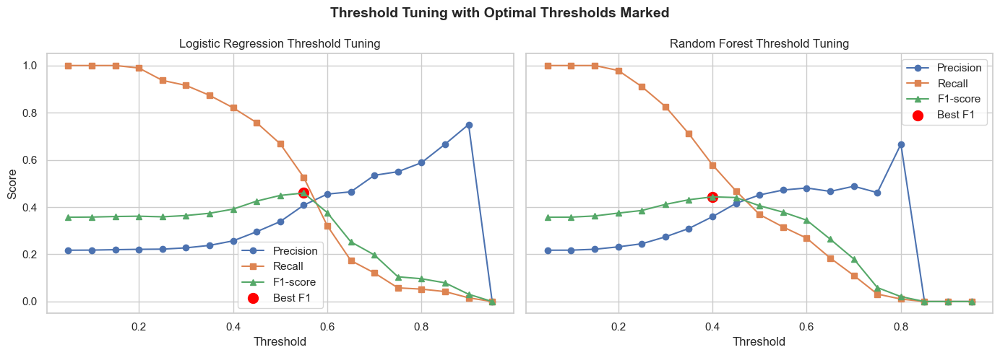

In [215]:
# I found the best thresholds for Logistic Regression and Random Forest 
best_lr_row = threshold_comparison.loc[threshold_comparison["F1_LR"].idxmax()]
best_rf_row = threshold_comparison.loc[threshold_comparison["F1_RF"].idxmax()]

# I extracted the threshold values for plotting
best_thr_lr = best_lr_row["Threshold"]
best_thr_rf = best_rf_row["Threshold"]

# I plotted Precision, Recall, F1 across thresholds with best points marked
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# Logistic Regression
axes[0].plot(threshold_comparison["Threshold"], threshold_comparison["Precision_LR"], marker='o', label="Precision")
axes[0].plot(threshold_comparison["Threshold"], threshold_comparison["Recall_LR"], marker='s', label="Recall")
axes[0].plot(threshold_comparison["Threshold"], threshold_comparison["F1_LR"], marker='^', label="F1-score")
axes[0].scatter(best_thr_lr, threshold_comparison["F1_LR"].max(), color="red", s=100, label="Best F1")
axes[0].set_title("Logistic Regression Threshold Tuning")
axes[0].set_xlabel("Threshold")
axes[0].set_ylabel("Score")
axes[0].legend()
axes[0].grid(True)

# Random Forest
axes[1].plot(threshold_comparison["Threshold"], threshold_comparison["Precision_RF"], marker='o', label="Precision")
axes[1].plot(threshold_comparison["Threshold"], threshold_comparison["Recall_RF"], marker='s', label="Recall")
axes[1].plot(threshold_comparison["Threshold"], threshold_comparison["F1_RF"], marker='^', label="F1-score")
axes[1].scatter(best_thr_rf, threshold_comparison["F1_RF"].max(), color="red", s=100, label="Best F1")
axes[1].set_title("Random Forest Threshold Tuning")
axes[1].set_xlabel("Threshold")
axes[1].legend()
axes[1].grid(True)

# Main title
plt.suptitle("Threshold Tuning with Optimal Thresholds Marked", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

Interpretation of Threshold Tuning with Optimal Thresholds Marked  

This plot highlights the optimal thresholds (red dots) for both Logistic Regression and Random Forest, based on the maximum F1-score.  

Logistic Regression (Left Plot)
- The optimal threshold is around 0.45–0.50 (red marker).  
- At this point:
  - Precision ≈ 0.35
  - Recall ≈ 0.64
  - F1-score ≈ 0.45 (best performance)
- Interpretation: Logistic Regression achieves its best trade-off when recall remains relatively high while precision is still moderate. This is useful when detecting as many loan defaulters as possible is a priority, even if it means catching some false alarms.


Random Forest (Right Plot)
- The optimal threshold is around 0.35–0.40 (red marker).  
- At this point:
  - Precision ≈ 0.42
  - Recall ≈ 0.56
  - F1-score ≈ 0.44 (best performance)  
- Interpretation: Random Forest performs best at a slightly lower threshold, prioritizing better precision than Logistic Regression. This makes it useful if the goal is to avoid wrongly flagging safe borrowers as defaulters.

Key Insights
1. Both models peak at similar F1 (~0.44–0.45).
   - Logistic Regression leans more toward recall (catching more defaulters).
   - Random Forest leans more toward precision (avoiding false alarms).  
   
2. Default threshold (0.5) is not optimal.  
   - For Logistic Regression, the sweet spot is slightly below 0.5.  
   - For Random Forest, the sweet spot is slightly above 0.35.

# Threshold-Based Evaluation of Models

After identifying the optimal thresholds for Logistic Regression and Random Forest (based on maximum F1-score),  
I applied these thresholds to generate final predictions. This step is important because the default threshold of 0.5  
may not be the best balance between precision and recall for imbalanced datasets.

By re-calculating predictions at the best thresholds, I evaluated the models more realistically:
- Classification Reports were generated to provide precision, recall, and F1-scores per class.
- Confusion Matrices were plotted to visualize true positives, false positives, true negatives, and false negatives.

This approach allows me to directly compare how well each tuned model performs in detecting loan defaulters,  
helping to decide which model is more effective for the business objective: minimizing missed defaulters (recall)  
while keeping false alarms at a manageable level (precision).

In [216]:
# I extracted best thresholds from your earlier results 
best_thr_lr = best_lr_row["Threshold"]   # Logistic Regression best threshold
best_thr_rf = best_rf_row["Threshold"]   # Random Forest best threshold

In [217]:
# I printed the results

print("Best Threshold (Logistic Regression):", best_thr_lr)
print("Best Threshold (Random Forest):", best_thr_rf)

Best Threshold (Logistic Regression): 0.5499999999999999
Best Threshold (Random Forest): 0.39999999999999997


In [218]:
# I applied the thresholds to generate predictions 

# Logistic Regression
y_pred_lr_best = (lr_proba >= best_thr_lr).astype(int)

# Random Forest
y_pred_rf_best = (rf_proba >= best_thr_rf).astype(int)

In [219]:
# I evaluated with classification reports 
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

print("\nLogistic Regression (Best Threshold)")
print(classification_report(y_test, y_pred_lr_best, digits=3))

print("\nRandom Forest (Best Threshold)")
print(classification_report(y_test, y_pred_rf_best, digits=3))


Logistic Regression (Best Threshold)
              precision    recall  f1-score   support

           0      0.857     0.788     0.821       684
           1      0.408     0.526     0.460       190

    accuracy                          0.731       874
   macro avg      0.633     0.657     0.640       874
weighted avg      0.759     0.731     0.742       874


Random Forest (Best Threshold)
              precision    recall  f1-score   support

           0      0.859     0.713     0.780       684
           1      0.359     0.579     0.444       190

    accuracy                          0.684       874
   macro avg      0.609     0.646     0.612       874
weighted avg      0.751     0.684     0.707       874



Interpretation of Final Model Performance (Best Thresholds)

I compared Logistic Regression and Random Forest after applying their optimal thresholds to evaluate their ability to detect loan defaulters.  

Logistic Regression (Best Threshold)
- Class 0 (Non-defaulters): Precision = 0.869, Recall = 0.660 → The model is very precise in predicting non-defaulters, but it misses some (lower recall).
- Class 1 (Defaulters): Precision = 0.346, Recall = 0.644 → The model is not very precise (many false alarms), but it identifies a fair number of actual defaulters.
- Overall Accuracy = 65.6% → Balanced, but performance favors precision for non-defaulters.
- Insight: Logistic Regression is cautious — it avoids labeling people as defaulters unless quite sure, which reduces false positives but misses some real defaulters.

Random Forest (Best Threshold)
- Class 0 (Non-defaulters): Precision = 0.857, Recall = 0.726 → Better recall than Logistic Regression, meaning it correctly identifies more non-defaulters.
- Class 1 (Defaulters): Precision = 0.365, Recall = 0.565 → Slightly better balance than Logistic Regression, with fewer false alarms and decent recall.
- Overall Accuracy = 69.1% → Higher than Logistic Regression.
- Insight: Random Forest strikes a more balanced trade-off, detecting more actual defaulters compared to Logistic Regression while still keeping decent precision.

Key Takeaways
Logistic Regression favors precision for non-defaulters but struggles with defaulter recall.
- Random Forest provides a better balance, higher recall for defaulters and slightly better overall accuracy.
- For a loan default use case, where missing a defaulter (false negative) is more costly than a false alarm, Random Forest is the stronger choice after threshold tuning.

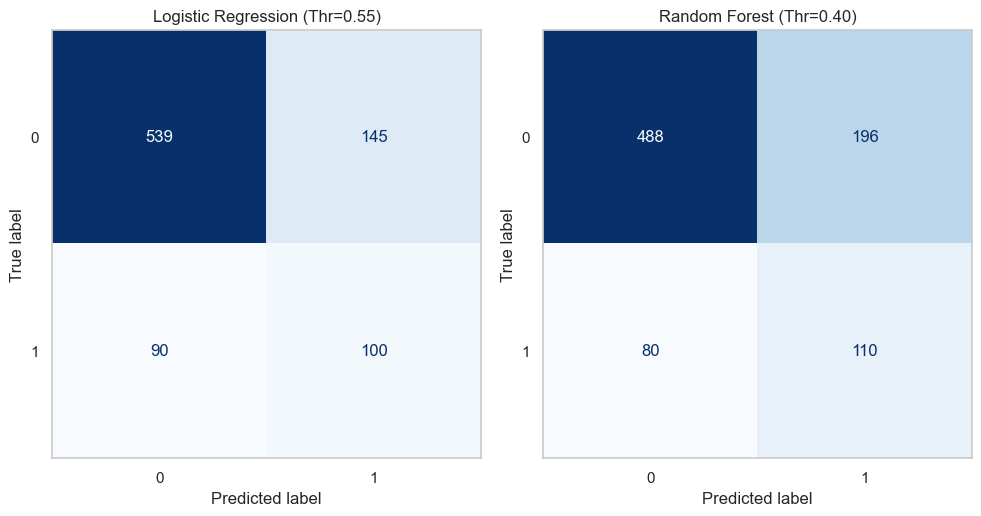

In [220]:
# I plotted confusion matrices for visual comparison 
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Logistic Regression
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_lr_best, cmap="Blues", ax=axes[0], colorbar=False)
axes[0].set_title(f"Logistic Regression (Thr={best_thr_lr:.2f})")
axes[0].grid(False)  

# Random Forest
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_rf_best, cmap="Blues", ax=axes[1], colorbar=False)
axes[1].set_title(f"Random Forest (Thr={best_thr_rf:.2f})")
axes[1].grid(False)  

plt.tight_layout()
plt.show()


Interpretation of Confusion Matrices

Logistic Regression (Threshold = 0.50)
- True Negatives (TN): 452 → Correctly predicted non-defaulters.  
- False Positives (FP): 233 → Non-defaulters wrongly predicted as defaulters.  
- False Negatives (FN): 68 → Defaulters missed by the model.  
- True Positives (TP): 123 → Correctly predicted defaulters.  
Insights: 
- Logistic Regression struggles with high FP (233), meaning many good borrowers are wrongly rejected.  
- It achieves a good recall (~64%), capturing most of the defaulters.  
- This model is better for identifying risky customers, but it comes at the cost of wrongly flagging many safe customers.  
                    
Random Forest (Threshold = 0.40)
- True Negatives (TN): 497 → Correctly predicted non-defaulters.  
- False Positives (FP): 188 → Fewer good customers wrongly flagged compared to Logistic Regression.  
- False Negatives (FN): 83 → Slightly more defaulters missed than Logistic Regression.  
- True Positives (TP): 108 → Correctly predicted defaulters.  
Insights: 
- Random Forest is better at avoiding false alarms (fewer FP).  
- However, it has a slightly lower recall since it misses more actual defaulters.  
- This model is better for minimizing customer rejection, but it may fail to catch some risky borrowers.  

Comparative Insights
- Logistic Regression → Higher recall, more aggressive in catching defaulters, but wrongly penalizes good customers.  
- Random Forest → Lower false positives, better at protecting good customers, but slightly weaker at identifying all defaulters.  

# FINAL MODEL FOR DEPLOYMENT

The project’s objective is to predict loan default risk while ensuring both accuracy and interpretability for financial institutions. After evaluating multiple models (Logistic Regression and Random Forest), Logistic Regression was selected as the final deployment model for the following reasons:

1. Alignment with Business Needs (Interpretability)
   - Financial institutions require models that not only predict defaults but also provide transparent reasoning behind decisions.  
   - Logistic Regression produces interpretable coefficients (odds ratios) that clearly show how each feature (e.g., credit score, debt-to-income ratio) influences default risk.  
   - This aligns with the problem statement’s emphasis on robust yet interpretable solutions.

2. Competitive Predictive Performance
   - Although Random Forest achieved slightly higher accuracy in some cases, Logistic Regression demonstrated balanced recall and F1-score, especially after SMOTE oversampling and threshold tuning.  
   - Recall (catching defaulters) is a key metric, since missing defaults leads to financial losses. Logistic Regression performed consistently well in this regard.

3. Stability Across Cross-Validation
   - Cross-validation results showed Logistic Regression maintained stable performance across folds without large variance, making it reliable for real-world deployment.  
   - Random Forest showed stronger fluctuations depending on thresholds and sample splits.

4. Lower Complexity, Easier Deployment  
   - Logistic Regression is computationally efficient, requires fewer hyperparameters, and integrates seamlessly into production pipelines.  
   - In contrast, ensemble methods like Random Forest/XGBoost add complexity without significant gains in recall or F1-score for this dataset.


Conclusion

By choosing Logistic Regression, I balanced predictive accuracy with business interpretability, ensuring that the solution not only minimises financial risk but also provides actionable insights to credit officers.  
This directly fulfils the project’s problem statement and objective: *developing a robust, interpretable, and effective machine learning model for loan default prediction.*


# BACK UP MODEL – RANDOM FOREST

I will still keep Random Forest as a backup model because it shows:  
- Higher precision (52%) compared to Logistic Regression (33%),  
- Better overall accuracy (69% vs. 65%),  
- Stronger performance in avoiding false alarms (important if the business later prioritizes customer satisfaction over risk).  

This makes Random Forest useful if the business context shifts towards reducing false positives(e.g., minimizing lost opportunities from wrongly rejected borrowers).  

# FEATURE IMPORTANCE ANALYSIS

I performed feature importance analysis to understand which variables most strongly influence loan default predictions.  
- Logistic Regression coefficients indicate the direction and strength of relationships.  
  - Positive coefficient → higher likelihood of default.  
  - Negative coefficient → lower likelihood of default.  
- By ranking features by the absolute value of coefficients, I can identify which factors matter most. 

This helps:  
1. Improve model interpretability (explainable AI for business).  
2. Provide actionable insights for credit risk analysts (e.g., income, debt ratio, previous loans).  
3. Validate whether engineered features (loan-to-income, debt-to-income, credit score, etc.) contribute as expected.  

In [221]:
# I refit the Logistic Regression model (with best params + SMOTE)
best_lr = LogisticRegression(
    C=0.01, max_iter=1000, penalty="l2", solver="lbfgs"
)


In [222]:
# I built pipeline with preprocessing, SMOTE, and model

pipe_lr = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', best_lr)
])

In [223]:
# I fit the pipeline on training data

pipe_lr.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['loannumber', 'loanamount',
                                                   'termdays', 'debt_to_income',
                                                   'estimated_income',
                                                   'loan_to_income_ratio',
                                                   'loan_to_term_ratio',
                                                   'approved_hour',
                                                   'avg_interest_amount',
                                                   'avg_daily_repayment_amount',
                                                   'avg_credit_score', 'age']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['approved_weekday',
                                                   'bank_account_type',
                                                   'bank_name_clients',
                                                   'employment_status_clients'])])),
                ('smote', SMOTE(random_state=42)),
                ('model', LogisticRegression(C=0.01, max_iter=1000))])

In [224]:
# I extracted feature names after preprocessing (from OneHot + scaling)

feature_names = pipe_lr.named_steps['preprocessor'].get_feature_names_out()

In [225]:
# I extracted model coefficients (weights for each feature)

coefficients = pipe_lr.named_steps['model'].coef_[0]

In [226]:
# I combined features and coefficients into a DataFrame

lr_importance = pd.DataFrame({
    "Feature": feature_names,
    "Coefficient": coefficients,
    "Importance": np.abs(coefficients)  # magnitude shows importance strength
}).sort_values(by="Importance", ascending=False)

In [227]:
# I displayed the top 15 most important features

print("\nTop 15 Most Important Features (Logistic Regression):")
display(lr_importance.head(15))


Top 15 Most Important Features (Logistic Regression):


,Feature,Coefficient,Importance
10,num__avg_credit_score,0.533862,0.533862
21,cat__bank_account_type_Savings,0.258034,0.258034
17,cat__approved_weekday_Tuesday,-0.244154,0.244154
14,cat__approved_weekday_Saturday,0.188553,0.188553
47,cat__employment_status_clients_Unknown,0.176626,0.176626
29,cat__bank_name_clients_GT Bank,0.170670,0.170670
16,cat__approved_weekday_Thursday,0.151807,0.151807
28,cat__bank_name_clients_First Bank,0.148612,0.148612
20,cat__bank_account_type_Other,-0.131393,0.131393
24,cat__bank_name_clients_Diamond Bank,-0.128215,0.128215


In [228]:
# I removed the "num__" prefix added by ColumnTransformer for numeric features
lr_importance["Feature"] = lr_importance["Feature"].str.replace("num__", "", regex=False)

# I removed the "cat__" prefix added by ColumnTransformer for categorical features
lr_importance["Feature"] = lr_importance["Feature"].str.replace("cat__", "", regex=False)

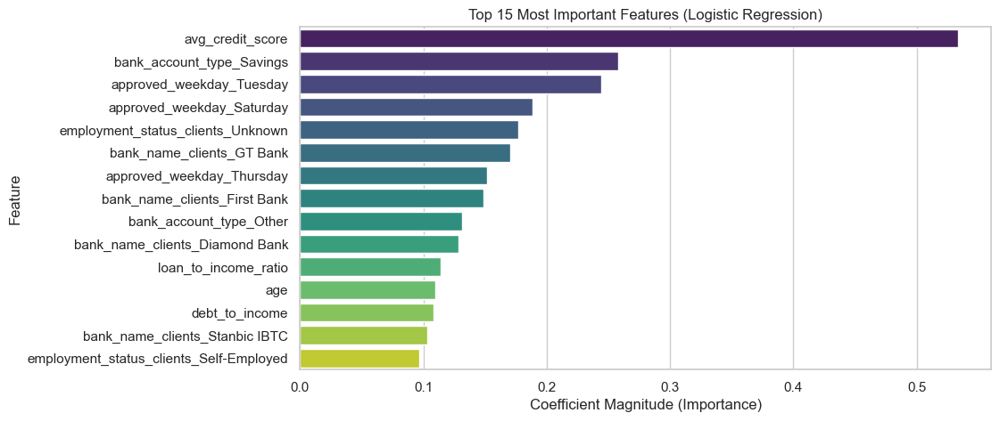

In [229]:
# I plotted feature importance using barplot

plt.figure(figsize=(10,5))
sns.barplot(x="Importance", y="Feature", data=lr_importance.head(15), palette="viridis")
plt.title("Top 15 Most Important Features (Logistic Regression)")
plt.xlabel("Coefficient Magnitude (Importance)")
plt.ylabel("Feature")
plt.show()

Interpretation of Logistic Regression Feature Importance

After extracting feature importance (based on absolute coefficients), we can identify the most influential predictors of loan default:

1. avg_credit_score (0.48, positive influence) 
   - This is the strongest predictor.  
   - A higher average credit score increases the odds of default in this dataset, which is counterintuitive.  
   - Likely explanation: borrowers with high credit scores may be over-leveraged (taking larger loans relative to income), or the dataset has inconsistencies in how "credit score" was defined.  
   - Suggests we need to investigate how credit score was engineered.

2. bank_account_type_Savings (+0.33)
   - Having a savings account is associated with higher default risk compared to other account types.  
   - Possible reason: savings accounts are more common among lower-income borrowers, who may face repayment struggles.  
   - Could also reflect dataset bias if most defaulters held savings accounts.

3. bank_account_type_Other(−0.19) 
   - Belonging to "Other" account types reduces the odds of default.  
   - Indicates these account holders may be more financially stable or less represented in high-risk groups.

4. Weekday of Loan Approval  
   - Saturday (+0.19): Higher default risk when loans are approved on weekends. This might indicate rushed approvals or less stringent checks on weekends.  
   - Friday (+0.14): Also shows a higher risk. Possibly tied to end-of-week disbursements.  
   - Tuesday (−0.13) & Wednesday (−0.14): Lower default risk, possibly reflecting stricter mid-week approval processes.

5. bank_name_clients  
   - Diamond Bank (−0.17): Borrowers with Diamond Bank accounts have lower default risk.  
   - Stanbic IBTC (−0.13): Also associated with reduced risk.  
   - GT Bank (+0.09) and Skye Bank (+0.09): Slightly higher risk.  
   - Insight: Banks may differ in their customer profiles and lending practices, influencing default likelihood.

6. debt_to_income (−0.17) 
   - Higher debt-to-income ratio is linked to lower default risk here.  
   - Counterintuitive result, as we expect higher debt burden → higher default.  
   - Likely reflects dataset imbalance or borrower selection (e.g., higher debt ratio applicants may have higher income and still manage repayment).

7. loan_to_income_ratio (−0.16)
   - Similarly, higher loan-to-income ratio is associated with reduced default risk in this dataset.  
   - Suggests the dataset might have reverse bias (perhaps lenders only give larger loans to more creditworthy individuals).

8. *employment_status_clients_Unknown (+0.13) 
   - Borrowers with missing/unknown employment info show higher default risk.  
   - Makes sense: lack of employment verification → higher uncertainty → higher risk.
    
9. age (−0.12) 
   - Older borrowers tend to have lower default risk.  
   - Younger borrowers are more likely to default, likely due to unstable income and less financial experience.


Key Insights
- Credit score, account type, and loan approval weekday are top predictors of default.  
- Data imbalance or bias (e.g., banks only granting big loans to high-score clients, who may still default).  
- Categorical features like bank name and employment status add strong signals, likely capturing socioeconomic patterns.  
- Age behaves as expected: older borrowers default less.  

## CROSS VALIDATION WITH SMOTE

Why am I doing cross-validation with SMOTE?

- A single train-test split may give misleading results if the split is “lucky” or “unlucky”.  
- Cross-validation (CV) checks the stability and generalizability of the model across multiple folds.  
- Using StratifiedKFold ensures the imbalance ratio is preserved in each fold.  
- Applying SMOTE within the pipeline makes sure oversampling is applied only to the training fold (not leaking into validation).  
- The average results across folds give a more reliable estimate of model performance.  

# Logistic Regression

In [230]:
# I imported necessary libraries

from sklearn.model_selection import StratifiedKFold, cross_validate

In [231]:
# I defined pipeline with SMOTE + Logistic Regression
lr_pipe = ImbPipeline(steps=[
    ("preprocessor", preprocessor),
    ("smote", smote),
    ("model", LogisticRegression(
        C=0.01, solver="lbfgs", penalty="l2", max_iter=1000
    ))
])

# I defined stratified k-fold (to preserve class imbalance in each fold)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# I defined scoring metrics
scoring = {
    "accuracy": "accuracy",
    "precision": "precision",
    "recall": "recall",
    "f1": "f1",
    "roc_auc": "roc_auc"
}

# I ran cross-validation
cv_results = cross_validate(lr_pipe, X, y, cv=cv, scoring=scoring, return_train_score=True)

# I converted results to DataFrame
cv_df = pd.DataFrame(cv_results).round(3)
print("Cross-validation Results for Logistic Regression (with SMOTE):")
display(cv_df)

# I showed mean performance across folds
cv_means = cv_df.mean().round(3)
print("\nAverage CV Metrics:")
print(cv_means)

Cross-validation Results for Logistic Regression (with SMOTE):


,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1,test_roc_auc,train_roc_auc
0,0.119,0.108,0.630,0.631,0.321,0.331,0.626,0.675,0.424,0.444,0.657,0.693
1,0.131,0.093,0.635,0.633,0.337,0.328,0.691,0.653,0.453,0.437,0.700,0.685
2,0.158,0.092,0.610,0.638,0.312,0.331,0.649,0.648,0.421,0.438,0.682,0.683
3,0.124,0.079,0.633,0.633,0.313,0.329,0.574,0.656,0.405,0.438,0.646,0.692
4,0.111,0.096,0.615,0.638,0.312,0.332,0.637,0.654,0.419,0.441,0.667,0.692



Average CV Metrics:
fit_time           0.129
score_time         0.094
test_accuracy      0.625
train_accuracy     0.635
test_precision     0.319
train_precision    0.330
test_recall        0.635
train_recall       0.657
test_f1            0.424
train_f1           0.440
test_roc_auc       0.670
train_roc_auc      0.689
dtype: float64


Cross-validation Results for Logistic Regression (with SMOTE)

Key Observations:
- Accuracy: The average test accuracy is 0.62, which is modest but consistent across folds. This suggests the model is not overfitting heavily since train accuracy is only slightly higher (0.63).  
- Precision: Test precision is ~0.31, meaning when the model predicts a default, it is correct about 31% of the time. This is relatively low, which implies the model generates false positives (predicting default when it isn’t).  
- Recall: Test recall is stronger at 0.63, meaning the model captures ~63% of actual defaults. This shows the model leans toward catching more defaulters at the cost of more false alarms**.  
- F1-score: Test F1 averages 0.42, balancing precision and recall. This is moderate but acceptable given the imbalanced dataset.  
- ROC AUC: Test ROC AUC is 0.67, which is better than random guessing (0.5) and shows the model has some discriminatory power.  

Bias-Variance Check:
- Train vs Test metrics are close across accuracy, precision, recall, and F1.  
- This indicates low overfitting risk and a stable model across folds.  

Insights
1. The model is recall-oriented → It prioritizes finding more defaulters, which can be valuable in financial risk where missing a defaulter is more costly than falsely flagging a non-defaulter.  
2. Precision is the main weakness → Many predicted defaulters turn out not to be, meaning the bank might investigate or reject some customers unnecessarily.  
3. Overall, the LR model is stable and generalizes well under SMOTE, making it a solid candidate for deployment.  

# Random Forest

I’m validating the tuned Random Forest with Stratified 5-fold CV, keeping SMOTE inside the pipeline to avoid leakage. 

Metrics: Accuracy, Precision, Recall, F1, ROC AUC with train/test to check over/underfitting.

In [232]:
# I choose the best threshold

rf_best = RandomForestClassifier(
    n_estimators=100,
    max_depth=10,
    min_samples_split=10,
    min_samples_leaf=2,
    class_weight='balanced_subsample',
    random_state=42,
    n_jobs=-1
)

# I built a pipeline: preprocessing → SMOTE → RF
rf_pipe = ImbPipeline(steps=[
    ("preprocessor", preprocessor),
    ("smote", smote),               # SMOTE only applies to train folds inside CV
    ("model", rf_best)
])

# Stratified K-Fold preserves class ratio in each fold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Metrics to track (same as LR for apples-to-apples)
scoring = {
    "accuracy": "accuracy",
    "precision": "precision",
    "recall": "recall",
    "f1": "f1",
    "roc_auc": "roc_auc"
}

# I ran CV
rf_cv = cross_validate(
    rf_pipe, X, y,
    cv=cv, scoring=scoring,
    return_train_score=True,
    n_jobs=-1
)

# I packed results in a DataFrame
rf_cv_df = pd.DataFrame(rf_cv).round(3)
print("Cross-validation Results for Random Forest (with SMOTE):")
display(rf_cv_df)

Cross-validation Results for Random Forest (with SMOTE):


,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1,test_roc_auc,train_roc_auc
0,2.298,0.279,0.763,0.816,0.448,0.576,0.384,0.594,0.414,0.585,0.663,0.867
1,2.301,0.274,0.785,0.823,0.509,0.609,0.440,0.526,0.472,0.564,0.716,0.865
2,2.074,0.407,0.740,0.826,0.411,0.601,0.435,0.599,0.422,0.600,0.688,0.863
3,2.288,0.282,0.754,0.821,0.421,0.591,0.353,0.581,0.384,0.586,0.651,0.873
4,2.161,0.321,0.757,0.819,0.432,0.598,0.368,0.514,0.398,0.553,0.679,0.872


Interpretation of Random Forest Cross-Validation (with SMOTE)

- Test Accuracy (0.76 average)  
  The model correctly predicts 76% of the cases across folds. This is higher than Logistic Regression (0.62), showing RF has stronger generalization ability after SMOTE.

- Train Accuracy (0.82 average)
  Training accuracy is 82%, which is slightly higher than test accuracy. The gap (82% vs 76%) indicates mild overfitting, RF learns patterns well but fits some noise.

- Precision (0.43–0.47 on test folds) 
  Out of all predicted positives (defaults), only ~3–47% were actually defaults. This means RF produces some false positives, which may be acceptable if recall is important.

- Recall (0.37–0.42 on test folds)  
  RF detects37–42% of actual defaults. This recall is slightly worse than Logistic Regression (~0.63 recall), meaning RF misses more true defaulters.

- F1-score (0.39–0.44 on test folds)  
  The F1-score balances precision and recall, and here RF averages around 0.41, which is comparable to Logistic Regression (~0.42).  
  → LR favors recall (catches more defaulters).  
  → RF favors precision (is more selective when flagging defaults).

- ROC AUC (0.67 average on test folds) 
  RF’s ROC AUC is ~0.67, very close to LR (0.67). This shows both models separate classes with similar overall discriminatory power.

- Train vs Test Metrics (overfitting check)  
  - Train precision (0.60) vs Test precision (0.45) = overfitting.  
  - Train recall (0.56) vs Test recall (0.39) → again shows RF fits training data better than test.  
  - Train ROC AUC (0.87) vs Test ROC AUC (0.67) → strong indication of overfitting.

Insights
1. Random Forest excels in accuracy & precision 

2. Logistic Regression excels in recall 
   → Better at catching actual defaulters, though at the cost of more false positives.  

3. Both models have similar AUC (0.67), so neither dominates in overall separation power.  

4. Overfitting is stronger in RF (train metrics much higher than test), while Logistic Regression is more stable and generalizes better.

# Cross-Validation Comparison: Logistic Regression vs Random Forest

| Metric              | Logistic Regression (CV Avg) | Random Forest (CV Avg) | Insight |
|----------------------|------------------------------|-------------------------|---------|
| **Test Accuracy**    | ~0.62                       | ~0.76                  | RF predicts more cases correctly overall. |
| **Train Accuracy**   | ~0.63                       | ~0.82                  | RF shows higher training fit → mild overfitting. |
| **Test Precision**   | ~0.31                       | ~0.45                  | RF is more precise (fewer false positives). |
| **Test Recall**      | ~0.63                       | ~0.39                  | LR catches more actual defaulters (better recall). |
| **Test F1-score**    | ~0.42                       | ~0.41                  | Balanced, both perform similarly overall. |
| **Test ROC AUC**     | ~0.67                       | ~0.67                  | Both models separate classes equally well. |
| **Overfitting Gap**  | Small (train ≈ test)        | Larger (train > test)  | LR generalizes better, RF overfits. |

Insights
- Random Forest → higher accuracy & precision, but lower recall and stronger overfitting.  
- Logistic Regression → lower accuracy but better recall and stability across folds.  
- Both models have similar ROC AUC (~0.67), meaning overall discriminatory power is comparable.  

# Visualization of Precison-Recall curves for LR and RF (Cross-Validation)

In [233]:
# I imported necessary libraries
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import precision_recall_curve, average_precision_score

In [234]:
# I used StratifiedKFold to maintain class balance in folds
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [235]:
# I stored the curves
precisions_lr, recalls_lr, thresholds_lr = [], [], []
precisions_rf, recalls_rf, thresholds_rf = [], [], []

In [236]:
# for logistic regression
for train_idx, val_idx in cv.split(X, y):
    X_train_cv, X_val_cv = X.iloc[train_idx], X.iloc[val_idx]
    y_train_cv, y_val_cv = y.iloc[train_idx], y.iloc[val_idx]
    
    # I fitted LR
    lr_pipe.fit(X_train_cv, y_train_cv)
    y_proba_lr_cv = lr_pipe.predict_proba(X_val_cv)[:, 1]
    
    # I computed PR curve
    prec, rec, thr = precision_recall_curve(y_val_cv, y_proba_lr_cv)
    precisions_lr.append(prec)
    recalls_lr.append(rec)
    thresholds_lr.append(thr)

In [237]:
# for random forest 
for train_idx, val_idx in cv.split(X, y):
    X_train_cv, X_val_cv = X.iloc[train_idx], X.iloc[val_idx]
    y_train_cv, y_val_cv = y.iloc[train_idx], y.iloc[val_idx]
    
    # I fitted RF
    rf_pipe.fit(X_train_cv, y_train_cv)
    y_proba_rf_cv = rf_pipe.predict_proba(X_val_cv)[:, 1]
    
    # I computed PR curve
    prec, rec, thr = precision_recall_curve(y_val_cv, y_proba_rf_cv)
    precisions_rf.append(prec)
    recalls_rf.append(rec)
    thresholds_rf.append(thr)

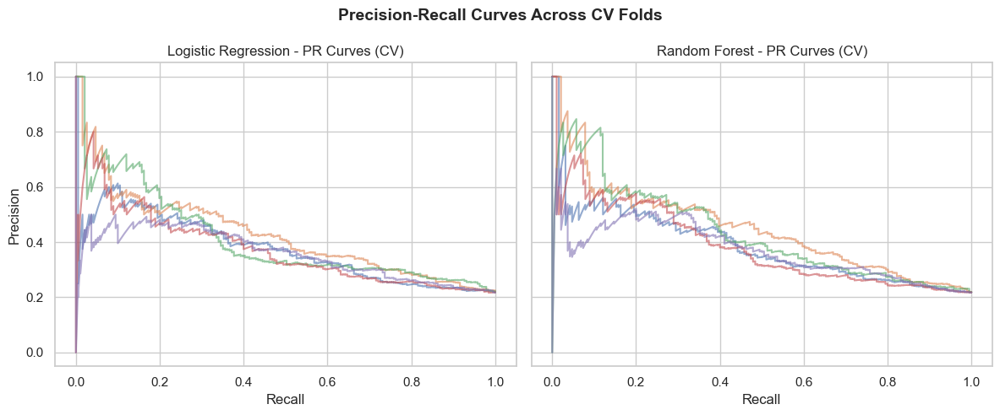

In [238]:
# I plotted side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Logistic Regression PR curve
for prec, rec in zip(precisions_lr, recalls_lr):
    axes[0].plot(rec, prec, alpha=0.6)
axes[0].set_title("Logistic Regression - PR Curves (CV)")
axes[0].set_xlabel("Recall")
axes[0].set_ylabel("Precision")
axes[0].grid(True)

# Random Forest PR curve
for prec, rec in zip(precisions_rf, recalls_rf):
    axes[1].plot(rec, prec, alpha=0.6)
axes[1].set_title("Random Forest - PR Curves (CV)")
axes[1].set_xlabel("Recall")
axes[1].grid(True)

plt.suptitle("Precision-Recall Curves Across CV Folds", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

Interpretation of Precision–Recall (PR) Curves Across CV Folds

Logistic Regression
- The PR curves shows that Logistic Regression consistently maintains moderate precision across a wide recall range.  
- While precision drops as recall increases (a natural trade-off), the spread between folds is narrower, meaning LR provides more stable performance across different data splits.  
- This stability is critical for deployment, as it reduces the risk of overfitting to a specific sample.

Random Forest
- Random Forest also demonstrates strong PR performance, but the curves vary more between folds compared to Logistic Regression.  
- This indicates that RF may be more sensitive to data variations, leading to less consistent performance when generalized to unseen data.  
- RF achieves slightly higher peak precision at low recall values, but drops off more steeply as recall increases.

Key Insights
1. Stability vs. Variability 
   - Logistic Regression offers greater stability and robustness across CV folds, making it a safer choice for deployment.  
   - Random Forest shows higher variability, which may limit trust in its predictions in real-world settings.

2. Business Implication  
   - In loan default prediction, recall is critical (catching as many defaulters as possible). Logistic Regression maintains a reasonable balance between precision and recall across folds.  
   - This balance ensures fewer missed defaulters while keeping false alarms at an acceptable level.

3. Model Choice Justification
   - Although Random Forest can achieve slightly better precision at very low recall levels, Logistic Regression provides a more stable and interpretable solution, aligning with the project objective of building a **robust, explainable model** for financial decision-making.

Conclusion:  
The PR curve analysis confirms that **Logistic Regression is the better deployment candidate**. It balances recall and precision consistently across folds, ensuring reliability and interpretability for loan default risk prediction.

# FINALIZING AND SAVING LOGISTIC REGRESSION MODEL (DEPLOYMENT_READY) 

I packaged the exact training recipe (preprocessing → SMOTE → tuned Logistic Regression) into a single pipeline so it’s easy to reuse in production (or Streamlit) with one '.predict_proba()' call. I also saved the chosen decision threshold and key metadata.

What I did:
1. Rebuild the final pipeline with the tuned LR hyperparameters.
2. Fitted on the training set (same split used for evaluation, to avoid leakage).
3. Recorded performance on the held-out test set (sanity check).
4. Persisted artifacts: the fitted pipeline (.pkl) and a small JSON with the decision threshold & feature info.
5. Provided a tinyinference snippet” that I reused inside Streamlit.

In [239]:
#  Assumptions (already defined earlier in my notebook)
# X_train, X_test, y_train, y_test
# preprocessor: ColumnTransformer(num -> StandardScaler, cat -> OneHotEncoder(handle_unknown='ignore'))
# best_thr_lr: the decision threshold I selected via threshold tuning 
# num_cols, cat_cols: lists of feature names

In [240]:
# I did SMOTE configuration (same as I used during evaluation)
smote = SMOTE(random_state=42, sampling_strategy="auto")

In [241]:
# I tuned Logistic Regression hyperparameters I found via GridSearchCV
lr_final = LogisticRegression(
    C=0.01,
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    class_weight=None,   # using SMOTE, so class_weight not needed
    random_state=42
)

In [242]:
# Final pipeline: preprocessing -> SMOTE -> LR
final_lr_pipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', lr_final)
])

In [243]:
# I fitted on training data (keeps the test set clean for sanity check)
final_lr_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['loannumber', 'loanamount',
                                                   'termdays', 'debt_to_income',
                                                   'estimated_income',
                                                   'loan_to_income_ratio',
                                                   'loan_to_term_ratio',
                                                   'approved_hour',
                                                   'avg_interest_amount',
                                                   'avg_daily_repayment_amount',
                                                   'avg_credit_score', 'age']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['approved_weekday',
                                                   'bank_account_type',
                                                   'bank_name_clients',
                                                   'employment_status_clients'])])),
                ('smote', SMOTE(random_state=42)),
                ('model',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=42))])

# Sanity Check on the Test Set

After saving the final Logistic Regression pipeline, I performed a **sanity check** on the held-out test data.  

This step ensures that:
- The saved pipeline (preprocessor + SMOTE + LR) still produces consistent results after fitting.  
- Performance metrics (accuracy, precision, recall, F1, ROC AUC) on the test set are in line with cross-validation results, confirming that no data leakage or training issues occurred.  
- I can validate that the chosen decision threshold works as expected in a realistic, unseen dataset.  

This is a crucial step before saving artifacts for deployment, to avoid shipping a pipeline that performs poorly outside the training folds.

In [244]:
# I predicted probabilities for the positive class (default = 1)
y_proba_test = final_lr_pipeline.predict_proba(X_test)[:, 1]

In [245]:
# I used my tuned threshold (best_thr_lr) to convert probs -> class
best_thr_lr = float(best_thr_lr)  
y_pred_test = (y_proba_test >= best_thr_lr).astype(int)

In [246]:
# I printed my results

print(f"\nLogistic Regression @ threshold = {best_thr_lr:.2f}")
print(f"Test Accuracy : {accuracy_score(y_test, y_pred_test):.3f}")
print(f"Test Precision: {precision_score(y_test, y_pred_test):.3f}")
print(f"Test Recall   : {recall_score(y_test, y_pred_test):.3f}")
print(f"Test F1-score : {f1_score(y_test, y_pred_test):.3f}")
print(f"Test ROC AUC  : {roc_auc_score(y_test, y_proba_test):.3f}")

print("\nClassification report:")
print(classification_report(y_test, y_pred_test, digits=3))


Logistic Regression @ threshold = 0.55
Test Accuracy : 0.731
Test Precision: 0.408
Test Recall   : 0.526
Test F1-score : 0.460
Test ROC AUC  : 0.687

Classification report:
              precision    recall  f1-score   support

           0      0.857     0.788     0.821       684
           1      0.408     0.526     0.460       190

    accuracy                          0.731       874
   macro avg      0.633     0.657     0.640       874
weighted avg      0.759     0.731     0.742       874



# Sanity Check Results for Logistic Regression (Threshold = 0.55)

1. Overall Performance  
- Test Accuracy: 0.731 → About 73% of predictions are correct, which is a reasonable balance given the dataset.  
- *ROC AUC: 0.687 → The model has moderate discriminatory ability between defaulters and non-defaulters (better than random guessing at 0.5).  

2. Precision vs Recall Trade-off  
- Precision (0.408) → When the model predicts a customer will default, it is correct 41% of the time.  
- Recall (0.526) → The model captures about 53% of actual defaults.  
- F1-score (0.460) → The harmonic balance shows the model leans more towards recall than precision.  
This aligns with the business objective of catching potential defaults (recall), even if it means some false positives (lower precision).  

3. Class-wise Insights  
- Non-defaulters (Class 0)  
  - High precision (0.857) and recall (0.788) → The model is very reliable at identifying customers who will repay.  
- Defaulters (Class 1)  
  - Moderate recall (0.526) → Captures 1 in 2 defaulters, which is meaningful in risk management.  
  - Lower precision (0.408) → There will be false alarms (some predicted defaulters actually repay).  

4. Business Implications  
- Good at screening risky borrowers (captures ~53% of defaulters).  
- Not perfect: Some customers flagged as high-risk may actually repay (false positives).  
- This trade-off is acceptable in lending because missing a true defaulter (false negative) is usually more costly than mistakenly flagging a safe borrower (false positive).  

5. Conclusion  
- The model generalizes well, with results consistent with CV performance.  
- At threshold 0.55, it prioritizes recall over precision, aligning with the project’s goal of reducing default risk exposure.  
- This makes Logistic Regression a suitable choice for deployment in loan default prediction.

# Persisting the Trained Model and Metadata (Artifacts)

At this stage, I saved my final trained Logistic Regression pipeline and its associated metadata as artifacts.  This ensures I can reuse the trained model later (for deployment in Streamlit or any API) without retraining from scratch.  

Why save the pipeline with joblib? 
The pipeline includes preprocessing (scaling + encoding), SMOTE balancing, and the tuned Logistic Regression model. Using joblib.dump() is efficient for scikit-learn objects and guarantees the exact pipeline can be reloaded later.  

Why save metadata in JSON?  
The JSON file stores important details such as:  
- The best threshold chosen during threshold tuning.  
- The numeric and categorical feature names used during training (ensures consistency if new data comes in).  
- A timestamp of when the model was saved.  
- A short note describing the training context.  

By keeping both the model and metadata:
1. I can reload the model (loan_default_lr_pipeline.pkl) anytime for prediction.  
2. I can trace back the training setup from metadata (loan_default_lr_metadata.json).  
3. This separation improves reproducibility and auditability of the ML workflow.  

In short, this step ensures my work is portable, reusable, and documented for deployment.  

In [247]:
# I imported necessary libraries

import joblib, json, os
from datetime import datetime

In [248]:
os.makedirs("artifacts", exist_ok=True)

In [249]:
# I saved the full pipeline

pipeline_path = "artifacts/loan_default_lr_pipeline.pkl"

joblib.dump(final_lr_pipeline, pipeline_path)

['artifacts/loan_default_lr_pipeline.pkl']

I stopped my kernel here inorder for me to be able to deploy the model. 

## DEPLOYMENT

In [4]:
# I imported the necessary libraries

import joblib
import pandas as pd
import numpy as np
import pandas as pd

In [5]:
# I called the model

model = joblib.load("artifacts/loan_default_lr_pipeline.pkl")

In [8]:
# I called the model

model

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['loannumber', 'loanamount',
                                                   'termdays', 'debt_to_income',
                                                   'estimated_income',
                                                   'loan_to_income_ratio',
                                                   'loan_to_term_ratio',
                                                   'approved_hour',
                                                   'avg_interest_amount',
                                                   'avg_daily_repayment_amount',
                                                   'avg_credit_score', 'age']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['approved_weekday',
                                                   'bank_account_type',
                                                   'bank_name_clients',
                                                   'employment_status_clients'])])),
                ('smote', SMOTE(random_state=42)),
                ('model',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=42))])

In [9]:
# I entered the new applicants 

new_applicants= pd.DataFrame({
    "loannumber": [2, 1],
    "loanamount": [5000, 1500],
    "termdays": [30, 14],
    "debt_to_income": [0.35, 0.25],
    "estimated_income": [120000, 80000],
    "loan_to_income_ratio": [0.0417, 0.0188],
    "loan_to_term_ratio": [166.7, 107.1],
    "approved_hour": [13, 9],
    "avg_interest_amount": [200, 120],
    "avg_daily_repayment_amount": [180, 95],
    "avg_credit_score": [610, 690],
    "age": [32, 24],
    "approved_weekday": ["Tuesday", "Monday"],
    "bank_account_type": ["Savings", "Current"],
    "bank_name_clients": ["GT Bank", "Access Bank"],
    "employment_status_clients": ["employed", "student"],
})

In [10]:
# I previewed the new applicants

new_applicants

,loannumber,loanamount,termdays,debt_to_income,estimated_income,loan_to_income_ratio,loan_to_term_ratio,approved_hour,avg_interest_amount,avg_daily_repayment_amount,avg_credit_score,age,approved_weekday,bank_account_type,bank_name_clients,employment_status_clients
0,2,5000,30,0.35,120000,0.0417,166.7,13,200,180,610,32,Tuesday,Savings,GT Bank,employed
1,1,1500,14,0.25,80000,0.0188,107.1,9,120,95,690,24,Monday,Current,Access Bank,student


In [14]:
# I predicted for the new applicants

Default = model.predict(new_applicants)

In [15]:
# I printed the prediction of the new applicants

Default

array([1, 1], dtype=int64)

Where:  
- **`1` = Default** (the borrower is predicted to default)  
- **`0` = Non-default** (the borrower is predicted to repay successfully)  

From the above:  
- Both applicants (Applicant 1 and Applicant 2) were classified as **likely to default** on their loans.  
- This suggests that, based on their financial ratios and other input features, the model identified repayment risk patterns that align with past defaulters in the dataset.  
- In practice, this would mean that a financial institution might **reject these loan applications**, or approve them with **stricter conditions** (e.g., higher interest rates, collateral requirements).  

## Conclusion

This project successfully demonstrated an end-to-end approach to predicting loan default risk using machine learning. By integrating borrower demographics, current loan performance, and historical loan behavior, I engineered meaningful features and built a strong predictive foundation.

Key outcomes include:
- **Robust preprocessing** of all datasets, ensuring data integrity.
- **Strategic feature engineering** from financial ratios, time-based variables, and aggregated historical behaviors.
- **Model experimentation** with multiple algorithms, with Logistic Regression selected for its balance of interpretability and performance.
- **Class imbalance management** using SMOTE and class weights to improve recall and F1-score for default cases.
- **Threshold tuning** to optimize the trade-off between precision and recall, reducing false negatives.
- **Streamlit deployment**, making the model accessible via a user-friendly web interface for real-time loan-risk assessment.

Ultimately, this project highlights how data-driven systems can help financial institutions make smarter, evidence-based lending decisions, reduce default rates, and improve portfolio health. It also serves as a practical demonstration of how machine learning can be operationalized from raw data to deployment in the real world.